In [1]:
import warnings
import os
from hmmlearn import hmm
import numpy as np
from librosa.feature import mfcc
import librosa
import random
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import itertools
from tabulate import tabulate

In [2]:
def buildDataSet(dir,rte):
    # Filter out the wav audio files under the dir
    fileList = [f for f in os.listdir(dir) if os.path.splitext(f)[1] == '.wav']
    train_dataset = {}
    test_dataset = {}
    cnt=1
    # Calculate percent of each train and test
    nm = int(rte*50)
    rnd = random.sample(range(0,50), nm)

    for fileName in fileList:
        label = fileName.split('-')[0]
        print(label)
        feature = extract_mfcc(dir+fileName).T
        if cnt in rnd:
            if label not in test_dataset.keys():
                test_dataset[label] = []
                test_dataset[label].append(feature)
            else:
                exist_feature = test_dataset[label]
                exist_feature.append(feature)
                test_dataset[label] = exist_feature
        else:
            if label not in train_dataset.keys():
                train_dataset[label] = []
                train_dataset[label].append(feature)
            else:
                exist_feature = train_dataset[label]
                exist_feature.append(feature)
                train_dataset[label] = exist_feature
        if (cnt == 50):
            cnt = 1
            rnd = random.sample(range(0, 50), 12)
        else:
            cnt += 1
    return train_dataset,test_dataset

In [3]:
def extract_mfcc(full_audio_path):
    print(full_audio_path,'ini audio')
    wave, sample_rate =  librosa.load(full_audio_path)
    mfcc_features = mfcc(wave, sample_rate )
    print(mfcc_features,'ini mfcc nya di SDR pake library')
    return mfcc_features

In [4]:
### Gussian HMM
def train_HMM(dataset):
    Models = {}
    for label in dataset.keys():
        model = hmm.GMMHMM(n_components=6)
        trainData = dataset[label]
        trData = np.vstack(trainData)
        model.fit(trData)
        Models[label] = model
    return Models

In [5]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [6]:
def main():
    ### ignore warning message of readfile
    warnings.filterwarnings('ignore')

    ### Step.1 Loading data
    trainDir = 'car_sound_dataset/'
    print('Step.1 data loading...')
    trainDataSet,testDataSet = buildDataSet(trainDir,rte=0.30)
    print("Finish prepare the data")


    ### Step.2 Training
    print('Step.2 Training model...')
    hmmModels = train_HMM(trainDataSet)
    print("Finish training of the GMM_HMM models")

    ### Step.3 predict test data
    acc_count = 0
    all_data_count = 0
    real = []
    pred = []
    for label in testDataSet.keys():
        feature = testDataSet[label]
        for index in range(len(feature)):
            all_data_count+=1
            scoreList = {}
            for model_label in hmmModels.keys():
                model = hmmModels[model_label]
                score = model.score(feature[index])
                scoreList[model_label] = score
            predict = max(scoreList, key=scoreList.get)
            real.append(label)
            pred.append(predict)
            print(label, "has predicted result =>", predict)
            
            if predict == label:
                acc_count+=1

    accuracy = round(((acc_count/all_data_count)*100.0),3)
    
#     print(real,'ini real')
#     print(pred,'ini inipredict')
    cm = confusion_matrix(real, pred)
    np.set_printoptions(precision=2)
    classes = ["normal","altenator", "bearing", "idler", "kompresor", "waterpump"]
    plt.figure()
    plot_confusion_matrix(cm, classes=classes, normalize=True,
    title='Normalized confusion matrix')

    plt.show()
    

    print("\n##########################################################################")
    print("######################## A-C-C-U-R-A-C-Y #################################")
    print("########################    ",accuracy,"%","   #################################")
    print("##########################################################################")
    
    


Step.1 data loading...
normal
car_sound_dataset/normal-avanza2012-115.wav ini audio
[[-1.12836029e+02 -1.11041359e+02 -1.15229767e+02 -1.16065063e+02
  -1.08876190e+02 -1.03851601e+02 -1.04884338e+02 -1.08007797e+02
  -1.08651245e+02 -1.07737816e+02 -1.08797791e+02 -1.10432091e+02
  -1.08249786e+02 -1.06521614e+02 -1.10897949e+02 -1.15130882e+02
  -1.13355095e+02 -1.10741219e+02 -1.09692261e+02 -1.10856873e+02
  -1.10694588e+02 -1.12175667e+02 -1.08831207e+02 -1.09753944e+02
  -1.09140511e+02 -1.08427727e+02 -1.08719856e+02 -1.07747749e+02
  -1.07198715e+02 -1.06969879e+02 -1.10106285e+02 -1.12469284e+02
  -1.08724030e+02 -1.05463699e+02 -1.06917122e+02 -1.06996956e+02
  -1.11089226e+02 -1.13786896e+02 -1.09917793e+02 -1.06325851e+02
  -1.04628090e+02 -1.02630630e+02 -1.07325203e+02 -1.16461662e+02]
 [ 3.59103928e+01  3.89895782e+01  3.98201523e+01  3.56129227e+01
   3.52185974e+01  3.53161545e+01  3.69730988e+01  3.61784821e+01
   3.46156960e+01  3.16995888e+01  3.43589859e+01  3.3558

[[-1.63591232e+02 -1.63591125e+02 -1.72266098e+02 -1.67610245e+02
  -1.70455719e+02 -1.76451309e+02 -1.76229126e+02 -1.83908249e+02
  -1.87891922e+02 -1.79754730e+02 -1.80857895e+02 -1.81091110e+02
  -1.71752731e+02 -1.71966827e+02 -1.69267548e+02 -1.65733841e+02
  -1.73299835e+02 -1.84719818e+02 -1.88288361e+02 -1.79434464e+02
  -1.76869980e+02 -1.70955231e+02 -1.65306366e+02 -1.66275650e+02
  -1.67264969e+02 -1.67474838e+02 -1.72675034e+02 -1.74577454e+02
  -1.64470596e+02 -1.60318710e+02 -1.60800415e+02 -1.60544189e+02
  -1.57975418e+02 -1.57775589e+02 -1.62393814e+02 -1.60216171e+02
  -1.56509567e+02 -1.53677231e+02 -1.46541595e+02 -1.39248444e+02
  -1.41412445e+02 -1.43133820e+02 -1.35029495e+02 -1.35606537e+02]
 [ 1.24156326e+02  1.27147507e+02  1.25310883e+02  1.30608566e+02
   1.32468506e+02  1.24729340e+02  1.14922684e+02  1.04672768e+02
   1.02344704e+02  1.06497192e+02  1.10694443e+02  1.11029663e+02
   1.11011925e+02  1.11048172e+02  1.12942589e+02  1.13925842e+02
   1.1106

[[-1.13121483e+02 -1.13362648e+02 -1.24096680e+02 -1.21737724e+02
  -1.19500610e+02 -1.22905785e+02 -1.22530884e+02 -1.23612335e+02
  -1.28567352e+02 -1.35140472e+02 -1.26306755e+02 -1.22963448e+02
  -1.23197731e+02 -1.23793060e+02 -1.28098099e+02 -1.28621201e+02
  -1.27812119e+02 -1.26616173e+02 -1.31364197e+02 -1.25864540e+02
  -1.26497650e+02 -1.28508789e+02 -1.29990295e+02 -1.32385742e+02
  -1.33007172e+02 -1.29880951e+02 -1.25075203e+02 -1.28842346e+02
  -1.30331467e+02 -1.26384888e+02 -1.27889885e+02 -1.31495636e+02
  -1.26434845e+02 -1.24680168e+02 -1.27033806e+02 -1.28792542e+02
  -1.27725548e+02 -1.30929993e+02 -1.26005928e+02 -1.21607346e+02
  -1.26695114e+02 -1.28701248e+02 -1.22145294e+02 -1.19007530e+02]
 [ 4.45741997e+01  4.49248848e+01  3.61111374e+01  3.98256836e+01
   3.71890640e+01  3.69425659e+01  2.81381264e+01  2.71396255e+01
   3.19785957e+01  3.76886139e+01  4.02554626e+01  4.14555817e+01
   3.71581345e+01  2.74857750e+01  2.57658691e+01  3.34677200e+01
   3.8139

[[-5.81415977e+01 -5.32686539e+01 -5.55455742e+01 -5.01664925e+01
  -5.01744766e+01 -5.42662468e+01 -4.23608017e+01 -4.56296196e+01
  -5.09881439e+01 -4.75843811e+01 -4.65362854e+01 -4.99191742e+01
  -5.05399208e+01 -5.17662239e+01 -5.01127930e+01 -4.92522583e+01
  -5.09822197e+01 -5.42339554e+01 -5.50152626e+01 -5.44125748e+01
  -5.50210114e+01 -5.54235840e+01 -5.15073929e+01 -4.82080460e+01
  -4.99858208e+01 -5.54854774e+01 -5.99927521e+01 -5.56534691e+01
  -5.23927574e+01 -5.25476265e+01 -5.17055321e+01 -4.76908112e+01
  -4.50117340e+01 -4.36318436e+01 -4.67014694e+01 -5.21560135e+01
  -4.96875916e+01 -5.09533081e+01 -4.91653175e+01 -4.70919762e+01
  -5.94208183e+01 -5.42918816e+01 -5.22558441e+01 -5.98516731e+01]
 [-3.05602760e+01 -2.93652916e+01 -2.89216232e+01 -2.83919487e+01
  -2.79034119e+01 -2.54209404e+01 -2.38517570e+01 -2.34289055e+01
  -1.93726864e+01 -1.87345295e+01 -1.94882584e+01 -2.36174240e+01
  -2.51820297e+01 -2.41986656e+01 -2.69519806e+01 -2.99485207e+01
  -2.7748

[[-3.92261009e+01 -2.70145378e+01 -2.39312477e+01 -2.34778290e+01
  -2.05131187e+01 -3.42842484e+01 -3.34471664e+01 -2.03421936e+01
  -2.13518505e+01 -2.17961922e+01 -1.41497936e+01 -1.43923168e+01
  -1.84471664e+01 -2.49507771e+01 -2.83659649e+01 -2.28237953e+01
  -2.04573231e+01 -2.08495445e+01 -1.55031052e+01 -1.70711918e+01
  -1.11436615e+01 -8.30871105e+00 -7.91914701e+00 -8.83405018e+00
  -9.82056904e+00 -9.88971138e+00 -1.12805109e+01 -1.48921022e+01
  -1.12142582e+01 -1.38860874e+01 -2.59105277e+00  4.61643410e+00
   2.06666064e+00  1.55429065e-01 -6.31329012e+00  1.71509612e+00
   1.54252577e+00 -1.16161752e+00 -2.92288899e-01 -1.85977018e+00
   1.89284730e+00  1.68587458e+00  5.39285946e+00 -1.80786043e-01]
 [ 7.50797958e+01  8.37723083e+01  8.39064941e+01  7.97056122e+01
   8.53451157e+01  8.45554352e+01  8.17243500e+01  8.81800385e+01
   8.57964249e+01  8.58561249e+01  6.41897659e+01  5.37723618e+01
   7.12670670e+01  7.55758209e+01  7.79191818e+01  7.87758484e+01
   7.6647

[[-1.52920227e+02 -1.37318359e+02 -1.35162109e+02 -1.36110748e+02
  -1.37944427e+02 -1.38137817e+02 -1.37474625e+02 -1.40519211e+02
  -1.37772125e+02 -1.37170746e+02 -1.36264053e+02 -1.36072235e+02
  -1.37555664e+02 -1.36306396e+02 -1.34232956e+02 -1.35866470e+02
  -1.39955994e+02 -1.35481552e+02 -1.30742996e+02 -1.38081909e+02
  -1.40802673e+02 -1.42437668e+02 -1.37084686e+02 -1.39892670e+02
  -1.39230270e+02 -1.41213455e+02 -1.43788422e+02 -1.43378922e+02
  -1.40002106e+02 -1.37662003e+02 -1.39164001e+02 -1.34892319e+02
  -1.33021698e+02 -1.33288162e+02 -1.36944214e+02 -1.34655258e+02
  -1.30226593e+02 -1.33087738e+02 -1.35183502e+02 -1.29745178e+02
  -1.33846832e+02 -1.42398956e+02 -1.34452499e+02 -1.31398163e+02]
 [ 3.65103073e+01  3.62773170e+01  3.76014252e+01  3.52811279e+01
   3.11427574e+01  2.98702431e+01  3.33772659e+01  3.24018135e+01
   3.83032379e+01  3.99499893e+01  4.02303619e+01  3.29779282e+01
   3.35141029e+01  3.45496750e+01  4.03333511e+01  3.55035210e+01
   3.0384

[[-3.56003532e+01 -3.05580311e+01 -3.63634987e+01 -3.74046707e+01
  -4.39272118e+01 -6.15263367e+01 -7.03452072e+01 -5.99129448e+01
  -6.25777206e+01 -7.54449768e+01 -8.79766617e+01 -8.97546616e+01
  -8.57633667e+01 -9.45319595e+01 -1.01921158e+02 -1.09799385e+02
  -1.03984444e+02 -9.90911484e+01 -9.93412323e+01 -1.06434288e+02
  -1.12025993e+02 -1.07802559e+02 -9.86824188e+01 -9.82813568e+01
  -1.09987556e+02 -1.18601776e+02 -1.21217384e+02 -1.16784042e+02
  -1.10493248e+02 -1.05496758e+02 -1.10674377e+02 -1.13054459e+02
  -1.18899010e+02 -1.20828293e+02 -1.16725975e+02 -1.13594116e+02
  -1.16095291e+02 -1.23939278e+02 -1.31046173e+02 -1.24587746e+02
  -1.14328316e+02 -1.12501068e+02 -1.18375786e+02 -1.29353882e+02]
 [ 1.02920166e+02  1.01932297e+02  1.03640732e+02  1.06966202e+02
   1.10835907e+02  1.06784210e+02  1.16648071e+02  1.30596329e+02
   1.22378937e+02  1.14009354e+02  1.06278770e+02  1.10011787e+02
   1.07096710e+02  1.05252579e+02  1.06496643e+02  9.90504913e+01
   9.9630

[[-1.17685966e+02 -1.12586708e+02 -1.06047455e+02 -1.01633217e+02
  -1.06866310e+02 -1.08050522e+02 -1.03695992e+02 -1.05426369e+02
  -1.06979507e+02 -1.04646729e+02 -1.01907288e+02 -1.06085587e+02
  -1.04216309e+02 -1.04421425e+02 -1.08207016e+02 -1.11174362e+02
  -1.13419853e+02 -1.05037529e+02 -1.03373367e+02 -1.07991287e+02
  -1.11001312e+02 -1.11510658e+02 -1.03963577e+02 -1.07613632e+02
  -1.12127159e+02 -1.10838913e+02 -1.08787521e+02 -1.07521294e+02
  -1.12594238e+02 -1.12323700e+02 -1.08936630e+02 -1.11186249e+02
  -1.11271683e+02 -1.09760536e+02 -1.13805389e+02 -1.14425438e+02
  -1.17326210e+02 -1.11881607e+02 -1.05659073e+02 -1.06368553e+02
  -1.08021439e+02 -1.10138504e+02 -1.11448380e+02 -1.17945335e+02]
 [ 2.86505642e+01  3.33486176e+01  3.22278328e+01  3.19404793e+01
   3.23324471e+01  2.99953594e+01  3.24935989e+01  3.28010559e+01
   3.31774673e+01  3.16519699e+01  3.08629684e+01  3.19166431e+01
   3.28987389e+01  2.93675823e+01  3.04663010e+01  3.00722580e+01
   3.1034

[[-1.12920624e+02 -1.08091591e+02 -1.13133255e+02 -1.17776642e+02
  -1.16331734e+02 -1.15849457e+02 -1.15237350e+02 -1.13977783e+02
  -1.12300758e+02 -1.07858749e+02 -1.05575455e+02 -1.09353249e+02
  -1.16955261e+02 -1.18003662e+02 -1.17686928e+02 -1.13150215e+02
  -1.14325157e+02 -1.16398888e+02 -1.15246819e+02 -1.11037697e+02
  -1.05812851e+02 -1.12413338e+02 -1.17112015e+02 -1.15121162e+02
  -1.09791885e+02 -1.11730270e+02 -1.20122971e+02 -1.18696068e+02
  -1.20089516e+02 -1.15387047e+02 -1.14189392e+02 -1.15924576e+02
  -1.12214722e+02 -1.11321144e+02 -1.09172058e+02 -1.12978996e+02
  -1.15581009e+02 -1.13593750e+02 -1.08456429e+02 -1.11722092e+02
  -1.19736664e+02 -1.13902626e+02 -1.05460976e+02 -1.11465347e+02]
 [ 2.09766388e+01  2.65326653e+01  3.25003662e+01  3.27313156e+01
   2.85786819e+01  2.26390686e+01  1.92209320e+01  2.79263783e+01
   3.11248302e+01  3.16596489e+01  3.28630409e+01  3.34835663e+01
   2.84148026e+01  2.24322472e+01  2.37968540e+01  2.94822197e+01
   2.8938

[[-1.83369476e+02 -1.74251190e+02 -1.79802887e+02 -1.86196609e+02
  -1.82216110e+02 -1.81913742e+02 -1.82151199e+02 -1.79912323e+02
  -1.76282715e+02 -1.81237839e+02 -1.83016098e+02 -1.81753540e+02
  -1.83193054e+02 -1.81591476e+02 -1.80208908e+02 -1.77181122e+02
  -1.78096298e+02 -1.77655045e+02 -1.79014496e+02 -1.72186432e+02
  -1.75971771e+02 -1.79107132e+02 -1.77427780e+02 -1.74164017e+02
  -1.74815613e+02 -1.72909119e+02 -1.72535843e+02 -1.79587784e+02
  -1.77758820e+02 -1.73647446e+02 -1.69688812e+02 -1.69682861e+02
  -1.76617096e+02 -1.75439819e+02 -1.75680756e+02 -1.71009140e+02
  -1.67373459e+02 -1.77494141e+02 -1.83511658e+02 -1.84823074e+02
  -1.82779831e+02 -1.81621368e+02 -1.80896713e+02 -1.84592636e+02]
 [ 4.22977371e+01  5.23328094e+01  5.77634659e+01  5.47828827e+01
   5.36126862e+01  5.77955933e+01  5.28522720e+01  5.77428970e+01
   5.62373276e+01  5.28650131e+01  5.13009529e+01  5.21319656e+01
   5.76295891e+01  6.16450844e+01  6.05837822e+01  6.07998276e+01
   5.5746

[[-5.91932831e+01 -5.13254700e+01 -5.28437996e+01 -4.88434105e+01
  -4.50493240e+01 -5.16619530e+01 -4.76580582e+01 -5.05286560e+01
  -5.90711403e+01 -5.33216248e+01 -5.17361259e+01 -5.45812187e+01
  -4.65166664e+01 -4.49361534e+01 -4.93708534e+01 -5.17659645e+01
  -6.25079956e+01 -5.48535995e+01 -4.83817863e+01 -4.93104210e+01
  -4.83124580e+01 -5.20794792e+01 -5.23961830e+01 -4.96839676e+01
  -4.95090408e+01 -4.56012650e+01 -4.87895164e+01 -5.18263550e+01
  -5.78723488e+01 -5.03813782e+01 -4.68386536e+01 -4.86040840e+01
  -4.84447975e+01 -4.85674210e+01 -5.02488899e+01 -5.56878510e+01
  -5.18712540e+01 -4.53840866e+01 -4.88831673e+01 -4.87774086e+01
  -4.80521011e+01 -4.50916748e+01 -5.34385223e+01 -7.26046677e+01]
 [-2.81503048e+01 -2.45837936e+01 -2.16049652e+01 -2.36002083e+01
  -2.55250931e+01 -2.55934620e+01 -2.10830593e+01 -2.50371208e+01
  -2.70667114e+01 -2.41233444e+01 -2.64257431e+01 -2.76196213e+01
  -2.27629681e+01 -2.64835949e+01 -2.87369690e+01 -2.86517258e+01
  -2.9779

[[-1.82912888e+02 -1.94593292e+02 -2.14395065e+02 -2.00691971e+02
  -1.92039169e+02 -1.64749939e+02 -1.53935959e+02 -1.54521973e+02
  -1.37870926e+02 -1.19773544e+02 -1.34633118e+02 -1.33738602e+02
  -1.33983917e+02 -1.26453201e+02 -1.24640816e+02 -1.42636307e+02
  -1.53515808e+02 -1.38312943e+02 -1.26852577e+02 -1.36546631e+02
  -1.44615723e+02 -1.38336411e+02 -1.28159775e+02 -1.30494751e+02
  -1.40409348e+02 -1.50474487e+02 -1.38963211e+02 -1.29274124e+02
  -1.24094711e+02 -1.37793640e+02 -1.32698944e+02 -1.30834030e+02
  -1.30927261e+02 -1.48460464e+02 -1.43387863e+02 -1.33490036e+02
  -1.20923912e+02 -1.26040878e+02 -1.30656189e+02 -1.31887222e+02
  -1.35012741e+02 -1.37597275e+02 -1.45707855e+02 -1.49849640e+02]
 [ 6.87825155e+00  1.81983542e+00 -1.22437515e+01 -1.07188072e+01
   1.19612312e+01  1.10470800e+01  5.58356094e+00 -2.07618058e-01
  -7.81557500e-01  5.02238464e+00  1.15048528e+00 -1.02267256e+01
  -4.78670549e+00  2.47930479e+00  6.81910419e+00  4.85907698e+00
  -2.7916

[[-2.94128590e+01 -2.64634457e+01 -3.02426033e+01 -3.03557129e+01
  -2.95997887e+01 -3.25757942e+01 -3.17805138e+01 -2.99947548e+01
  -3.39113235e+01 -2.51075211e+01 -2.30579491e+01 -2.70368423e+01
  -2.90913868e+01 -3.83175659e+01 -3.42540894e+01 -3.88808556e+01
  -3.90360413e+01 -3.43530807e+01 -3.85628967e+01 -3.62740173e+01
  -3.39503174e+01 -3.71164360e+01 -3.58353310e+01 -2.90775814e+01
  -2.92989140e+01 -3.18767300e+01 -3.73618393e+01 -3.22039948e+01
  -3.00081291e+01 -3.50627480e+01 -3.42272720e+01 -3.19869843e+01
  -3.35445061e+01 -3.32406425e+01 -3.30205460e+01 -3.88608246e+01
  -3.56494904e+01 -3.66860390e+01 -3.33827400e+01 -3.15732136e+01
  -3.37172356e+01 -3.05042667e+01 -3.02281246e+01 -3.98058968e+01]
 [-2.68781710e+00 -2.34035087e+00 -1.17237985e+00 -1.80644655e+00
  -5.18669891e+00 -3.61956191e+00 -4.01560163e+00 -2.50109434e+00
  -3.20461559e+00 -3.30328727e+00  7.79999435e-01  1.54024959e-02
  -4.21269798e+00 -7.22920513e+00 -5.47256660e+00 -9.96334267e+00
  -8.2342

[[-1.31992172e+02 -1.29222809e+02 -1.30949600e+02 -1.30210648e+02
  -1.31652374e+02 -1.40731247e+02 -1.35729858e+02 -1.29048447e+02
  -1.34167526e+02 -1.37587036e+02 -1.36581772e+02 -1.33257492e+02
  -1.38036880e+02 -1.35710159e+02 -1.27644661e+02 -1.31738602e+02
  -1.41892105e+02 -1.37987595e+02 -1.39064026e+02 -1.42500168e+02
  -1.37450378e+02 -1.37784210e+02 -1.36125763e+02 -1.41206253e+02
  -1.39375122e+02 -1.43204300e+02 -1.40048355e+02 -1.36401047e+02
  -1.44152863e+02 -1.42525665e+02 -1.36200546e+02 -1.33286407e+02
  -1.36733658e+02 -1.37386429e+02 -1.34676285e+02 -1.34993454e+02
  -1.34180161e+02 -1.35953430e+02 -1.31776749e+02 -1.30566498e+02
  -1.27687820e+02 -1.24551834e+02 -1.34273849e+02 -1.36037476e+02]
 [ 2.63280182e+01  3.19252224e+01  3.01119194e+01  3.36146126e+01
   3.33849220e+01  2.92207737e+01  2.42156944e+01  2.07683525e+01
   2.64926567e+01  2.99790802e+01  3.21143646e+01  3.65960121e+01
   3.57503624e+01  2.63457184e+01  2.68916721e+01  3.10253487e+01
   2.9232

[[-1.31687943e+02 -1.22122849e+02 -1.28560593e+02 -1.30074692e+02
  -1.29694733e+02 -1.25290764e+02 -1.21912354e+02 -1.27066696e+02
  -1.33199631e+02 -1.28954910e+02 -1.25766701e+02 -1.27048454e+02
  -1.26700562e+02 -1.32480713e+02 -1.27514656e+02 -1.21858315e+02
  -1.24312881e+02 -1.23552689e+02 -1.22059494e+02 -1.24117325e+02
  -1.30046860e+02 -1.28926514e+02 -1.30551987e+02 -1.26812202e+02
  -1.23682678e+02 -1.27207100e+02 -1.26341660e+02 -1.28037964e+02
  -1.23339508e+02 -1.17580391e+02 -1.22439888e+02 -1.26181572e+02
  -1.28962143e+02 -1.24516479e+02 -1.23867119e+02 -1.27003677e+02
  -1.25272903e+02 -1.25105339e+02 -1.22670044e+02 -1.24061356e+02
  -1.24567619e+02 -1.28064880e+02 -1.19266739e+02 -1.20870300e+02]
 [ 2.88499031e+01  3.07925167e+01  3.27604370e+01  3.18368721e+01
   3.14307690e+01  3.21179352e+01  3.13354969e+01  2.78319035e+01
   3.11155586e+01  3.13317318e+01  2.66803932e+01  2.90343761e+01
   3.00040436e+01  3.25278969e+01  2.90429611e+01  3.09114151e+01
   2.9647

[[-1.05840919e+02 -1.07949654e+02 -9.12975311e+01 -7.13827591e+01
  -6.63145370e+01 -1.08425377e+02 -1.26174858e+02 -8.92779236e+01
  -6.70584641e+01 -7.29139862e+01 -1.03317345e+02 -9.51442261e+01
  -6.03582993e+01 -4.97423019e+01 -7.60524216e+01 -1.07147263e+02
  -8.35868683e+01 -6.02602768e+01 -6.69385605e+01 -9.82900009e+01
  -9.87648849e+01 -6.20206528e+01 -5.49998894e+01 -8.88801117e+01
  -1.22020050e+02 -8.58569794e+01 -5.47837181e+01 -5.78513145e+01
  -8.62386780e+01 -8.92977142e+01 -5.48911972e+01 -5.60709152e+01
  -8.66199112e+01 -1.08541794e+02 -8.54403152e+01 -7.78946533e+01
  -8.46880875e+01 -1.03069702e+02 -1.26673523e+02 -1.24286118e+02
  -1.08178314e+02 -9.70997543e+01 -1.09002190e+02 -1.24165550e+02]
 [ 7.07929840e+01  6.88885803e+01  7.03284607e+01  7.64063950e+01
   6.95199432e+01  5.39969711e+01  5.03163948e+01  7.14850006e+01
   8.04444351e+01  7.96218414e+01  6.50888672e+01  6.54259949e+01
   7.13447800e+01  6.88036804e+01  6.58425446e+01  5.79354935e+01
   6.9621

[[-2.24622955e+02 -2.16392502e+02 -2.21726974e+02 -2.08942825e+02
  -2.09591904e+02 -2.18715515e+02 -2.28024887e+02 -2.14334366e+02
  -2.09482712e+02 -2.05173523e+02 -2.18577042e+02 -2.12238174e+02
  -2.03898499e+02 -2.07813995e+02 -2.17415787e+02 -2.16258957e+02
  -2.12646454e+02 -1.98375000e+02 -1.95810318e+02 -2.08571213e+02
  -2.11091354e+02 -2.13638382e+02 -2.12992157e+02 -2.10434921e+02
  -2.10575180e+02 -2.03189377e+02 -1.90817703e+02 -2.00113739e+02
  -2.10746902e+02 -2.16327850e+02 -2.06227509e+02 -2.06380875e+02
  -2.10151932e+02 -2.15486038e+02 -2.01786316e+02 -2.01632874e+02
  -2.09395905e+02 -2.28804840e+02 -2.16689117e+02 -2.01218857e+02
  -2.02703781e+02 -2.20301392e+02 -2.13384048e+02 -2.12415146e+02]
 [ 1.51916542e+01  3.22801828e+00  2.33655810e+00  1.16873112e+01
   2.33011055e+01  1.57208309e+01  8.85744858e+00  1.31692905e+01
   1.73444881e+01  5.73674250e+00  3.43688631e+00  6.18249893e+00
   1.99578037e+01  2.74806595e+01  2.32302704e+01  1.00933352e+01
   1.6169

[[-1.13357872e+02 -1.11089211e+02 -1.14945778e+02 -1.11263763e+02
  -1.03747864e+02 -1.00191010e+02 -1.05390892e+02 -1.07842369e+02
  -1.06378235e+02 -1.11658218e+02 -1.11059677e+02 -1.17105011e+02
  -1.14999756e+02 -1.11885941e+02 -1.07530106e+02 -1.12442535e+02
  -1.16638611e+02 -1.13100075e+02 -1.14500824e+02 -1.14623848e+02
  -1.15335686e+02 -1.14263260e+02 -1.13033005e+02 -1.15616409e+02
  -1.18246582e+02 -1.19092224e+02 -1.16463364e+02 -1.13280495e+02
  -1.11955696e+02 -1.14285149e+02 -1.18326691e+02 -1.13836983e+02
  -1.11494629e+02 -1.15379395e+02 -1.19053879e+02 -1.11635170e+02
  -1.12472229e+02 -1.18798309e+02 -1.22216438e+02 -1.19941521e+02
  -1.15765038e+02 -1.12669281e+02 -1.07410332e+02 -1.15966095e+02]
 [ 3.08029957e+01  3.29718475e+01  3.40827255e+01  3.46755600e+01
   3.54777145e+01  4.20606613e+01  4.29068832e+01  4.09750977e+01
   3.69402847e+01  2.93899193e+01  3.28085899e+01  3.46138496e+01
   3.16304550e+01  2.81868973e+01  3.10604401e+01  3.26341782e+01
   3.1663

[[-4.60934875e+02 -2.48271942e+02 -1.80709732e+02 -1.75259766e+02
  -1.81403290e+02 -1.80787109e+02 -1.77827347e+02 -1.75678925e+02
  -1.82281372e+02 -1.82405853e+02 -1.74672760e+02 -1.76589340e+02
  -1.79785782e+02 -1.79796448e+02 -1.70344360e+02 -1.79002106e+02
  -1.78809784e+02 -1.76282913e+02 -1.74572968e+02 -1.79631668e+02
  -1.74510178e+02 -1.67438705e+02 -1.73107864e+02 -1.85140182e+02
  -1.87499863e+02 -1.81472107e+02 -1.79320343e+02 -1.74202820e+02
  -1.68608871e+02 -1.63042236e+02 -1.72185333e+02 -1.77037064e+02
  -1.69935837e+02 -1.68548080e+02 -1.70236603e+02 -1.63813171e+02
  -1.56086273e+02 -1.63296799e+02 -1.66127747e+02 -1.71606857e+02
  -1.64900742e+02 -1.54082687e+02 -1.53759781e+02 -1.63589706e+02]
 [ 7.68536911e+01  8.83311310e+01  8.61006317e+01  6.94946136e+01
   6.66961746e+01  6.98919373e+01  7.31436234e+01  6.84894867e+01
   6.67336426e+01  6.77245483e+01  7.53781281e+01  7.39910736e+01
   7.48416901e+01  7.64088745e+01  7.76811371e+01  7.61569138e+01
   7.7498

[[-1.42644989e+02 -1.37832748e+02 -1.32898575e+02 -1.31140778e+02
  -1.29484299e+02 -1.28901199e+02 -1.30591110e+02 -1.34648605e+02
  -1.36480179e+02 -1.32206223e+02 -1.33361526e+02 -1.32581268e+02
  -1.24521126e+02 -1.30475525e+02 -1.38528290e+02 -1.34834381e+02
  -1.32298477e+02 -1.31322571e+02 -1.28185242e+02 -1.27546249e+02
  -1.33426788e+02 -1.38620987e+02 -1.29684647e+02 -1.28290848e+02
  -1.28767944e+02 -1.28224396e+02 -1.37730438e+02 -1.38584946e+02
  -1.35983170e+02 -1.36618408e+02 -1.37800064e+02 -1.29068817e+02
  -1.27527809e+02 -1.27874954e+02 -1.35294937e+02 -1.36223160e+02
  -1.36191345e+02 -1.33090607e+02 -1.23981033e+02 -1.30936142e+02
  -1.33129913e+02 -1.36922440e+02 -1.29782166e+02 -1.41507080e+02]
 [ 2.69166927e+01  2.81279526e+01  2.56990700e+01  3.18979263e+01
   3.13808689e+01  2.43345337e+01  2.58629665e+01  2.23872147e+01
   2.29397430e+01  2.49060020e+01  2.67121353e+01  2.29541206e+01
   2.32414818e+01  2.65294189e+01  2.57749710e+01  2.56673737e+01
   2.7081

   4.26747894e+00 -2.07599974e+00 -1.86118269e+00  1.37870193e+00]] ini mfcc nya di SDR pake library
kompresor
car_sound_dataset/kompresor-avanza-107.wav ini audio
[[-1.28630371e+01 -9.45083141e+00 -7.28327799e+00 -8.24318981e+00
  -1.29436121e+01 -1.84449253e+01 -2.18811760e+01 -2.49542618e+01
  -1.85117836e+01 -1.28105488e+01 -1.38940773e+01 -2.02522221e+01
  -1.72193298e+01 -1.56607475e+01 -1.22591114e+01 -6.71725988e+00
  -7.66351891e+00 -1.39012604e+01 -1.75802994e+01 -1.64417458e+01
  -1.33630037e+01 -1.57202539e+01 -1.04550495e+01 -9.77214527e+00
  -1.20121832e+01 -1.48352480e+01 -1.34858761e+01 -1.05857792e+01
  -7.61680174e+00 -7.33627319e+00 -5.85612440e+00 -4.55168962e+00
   1.82301331e+00  3.09642839e+00 -4.36909246e+00 -9.46439362e+00
  -6.61972284e+00 -3.40456462e+00 -7.73384428e+00 -6.96369505e+00
  -4.86825037e+00 -1.41095791e+01 -1.32695284e+01 -1.15220795e+01]
 [ 8.92656403e+01  9.12628632e+01  8.99928589e+01  9.09825439e+01
   9.62503357e+01  9.52784576e+01  9.339676

[[-3.31993890e+00 -3.85847718e-01 -8.11997128e+00 -1.04808168e+01
  -9.43587780e+00 -1.82311094e+00  4.56884909e+00  2.61085415e+00
  -3.27175188e+00 -6.81038761e+00 -7.77463436e+00 -8.30630493e+00
  -1.37787666e+01 -1.64764862e+01 -1.93230667e+01 -1.67170315e+01
  -1.25399952e+01 -1.52807016e+01 -1.68608208e+01 -1.24862499e+01
  -1.43487644e+01 -1.17339230e+01 -8.17704296e+00 -1.04266348e+01
  -1.19810181e+01 -1.50815945e+01 -1.02411442e+01 -1.66664391e+01
  -1.89120312e+01 -1.63885822e+01 -1.23597889e+01 -9.16517353e+00
  -1.05902281e+01 -1.19723969e+01 -1.14408598e+01 -1.20497475e+01
  -8.22447300e+00 -1.28684006e+01 -1.32631559e+01 -9.16617393e+00
  -1.36939669e+01 -2.26343594e+01 -2.58676472e+01 -3.48291969e+01]
 [ 8.32783356e+01  8.41968460e+01  8.58486328e+01  8.82553406e+01
   9.26687927e+01  9.49352722e+01  9.47266464e+01  9.28614197e+01
   8.74188309e+01  9.31707077e+01  9.98090363e+01  9.88130951e+01
   9.41931305e+01  9.36465302e+01  9.08169403e+01  9.57463150e+01
   1.0125

[[-4.17251740e+01 -3.41303253e+01 -3.36360321e+01 -2.77893143e+01
  -2.98717175e+01 -3.71171608e+01 -2.75668335e+01 -2.62826767e+01
  -2.30307121e+01 -2.44757137e+01 -3.58265114e+01 -3.31670074e+01
  -2.63772964e+01 -3.04944763e+01 -2.69181957e+01 -3.01514263e+01
  -3.10439110e+01 -2.78434410e+01 -3.04266262e+01 -2.51524487e+01
  -2.24331512e+01 -2.95882359e+01 -2.70948639e+01 -2.23172512e+01
  -2.26433659e+01 -1.98159771e+01 -2.80427666e+01 -3.24895782e+01
  -2.73532200e+01 -2.62454090e+01 -2.86955318e+01 -2.79100304e+01
  -3.53159599e+01 -3.07509232e+01 -3.26064529e+01 -3.25469360e+01
  -2.76322117e+01 -3.15193634e+01 -3.55085678e+01 -3.39076767e+01
  -3.42897110e+01 -2.75873547e+01 -2.94759541e+01 -3.66630096e+01]
 [-1.17516575e+01 -9.44562817e+00 -1.26034842e+01 -1.29946976e+01
  -1.06119308e+01 -1.28536530e+01 -1.16357889e+01 -6.76694965e+00
  -3.70324993e+00 -1.05905027e+01 -1.35000057e+01 -7.75909281e+00
  -6.49941921e+00 -4.13149309e+00 -5.64330196e+00 -9.05451107e+00
  -8.1055

[[-1.06209045e+02 -1.10848747e+02 -1.20148956e+02 -1.17125900e+02
  -1.13748833e+02 -1.10616493e+02 -1.14209679e+02 -1.19407539e+02
  -1.16976753e+02 -1.19485504e+02 -1.17649353e+02 -1.15819885e+02
  -1.19452812e+02 -1.20173721e+02 -1.15728310e+02 -1.12154564e+02
  -1.20168900e+02 -1.20567184e+02 -1.20274132e+02 -1.18023590e+02
  -1.19830605e+02 -1.21322685e+02 -1.18209679e+02 -1.15305382e+02
  -1.10468300e+02 -1.13846390e+02 -1.15009140e+02 -1.12155403e+02
  -1.13675095e+02 -1.13800941e+02 -1.22405991e+02 -1.20675652e+02
  -1.16822784e+02 -1.12245140e+02 -1.18384346e+02 -1.21419220e+02
  -1.17005516e+02 -1.13787994e+02 -1.11058739e+02 -1.15495476e+02
  -1.14927650e+02 -1.10424019e+02 -1.06628532e+02 -1.07496964e+02]
 [ 3.07728043e+01  2.97436771e+01  2.56773758e+01  2.71324692e+01
   2.57159920e+01  2.98345966e+01  2.95900822e+01  2.76537647e+01
   2.48498688e+01  2.58325424e+01  2.89052238e+01  2.85644417e+01
   2.40475311e+01  2.23974152e+01  2.18716507e+01  2.77504387e+01
   2.6868

[[-1.06279106e+02 -1.03766853e+02 -1.07008087e+02 -1.07342422e+02
  -1.05696320e+02 -1.08017509e+02 -1.06314186e+02 -1.08278748e+02
  -1.08590004e+02 -1.08391045e+02 -1.12170853e+02 -1.11908958e+02
  -1.10439095e+02 -1.09489204e+02 -1.09134842e+02 -1.08277885e+02
  -1.04556107e+02 -1.10866142e+02 -1.13164337e+02 -1.09106445e+02
  -1.07340546e+02 -1.08431206e+02 -1.08103058e+02 -1.04085243e+02
  -1.03228981e+02 -1.02568916e+02 -1.06263824e+02 -1.11908730e+02
  -1.08332123e+02 -1.02203667e+02 -9.91365967e+01 -1.05151184e+02
  -1.08029869e+02 -1.03075043e+02 -1.02946785e+02 -1.04874664e+02
  -1.04897499e+02 -1.07779716e+02 -1.12260475e+02 -1.14958801e+02
  -1.07810822e+02 -1.05562141e+02 -9.99150848e+01 -1.03028336e+02]
 [ 2.78316536e+01  2.87024384e+01  2.57525158e+01  2.57227478e+01
   3.07590904e+01  3.13023033e+01  2.73741341e+01  2.74790535e+01
   2.76742764e+01  3.00572853e+01  3.06768456e+01  2.52149372e+01
   2.80842972e+01  2.49912910e+01  2.84313183e+01  3.40468712e+01
   3.9304

[[-1.20996483e+02 -1.14284935e+02 -1.17251137e+02 -1.21668739e+02
  -1.19417816e+02 -1.17502075e+02 -1.17486771e+02 -1.18258301e+02
  -1.23895493e+02 -1.21466553e+02 -1.21989319e+02 -1.16858353e+02
  -1.16258080e+02 -1.20835869e+02 -1.19937225e+02 -1.20061584e+02
  -1.21606850e+02 -1.23728203e+02 -1.25724548e+02 -1.21902298e+02
  -1.17604851e+02 -1.10924416e+02 -1.14033592e+02 -1.18158203e+02
  -1.19733788e+02 -1.19082222e+02 -1.15438622e+02 -1.22521179e+02
  -1.21052750e+02 -1.19262291e+02 -1.22919533e+02 -1.17586731e+02
  -1.22813965e+02 -1.25760239e+02 -1.21393379e+02 -1.20089386e+02
  -1.18889725e+02 -1.22931595e+02 -1.24313774e+02 -1.22864677e+02
  -1.21381714e+02 -1.13819954e+02 -1.11170273e+02 -1.20005806e+02]
 [ 3.49823837e+01  3.60210114e+01  3.30615654e+01  3.31197128e+01
   3.17667484e+01  3.36449089e+01  3.29021339e+01  3.59210548e+01
   3.74646988e+01  3.77389145e+01  3.59557228e+01  3.45749054e+01
   3.38294907e+01  3.50341644e+01  3.29619865e+01  3.45069885e+01
   3.4165

[[-1.97744308e+02 -1.92221390e+02 -1.89221664e+02 -1.89397018e+02
  -1.89911819e+02 -1.87273865e+02 -1.86901016e+02 -1.88131577e+02
  -1.90884384e+02 -1.94400269e+02 -1.94509857e+02 -1.83391190e+02
  -1.82580673e+02 -1.84597809e+02 -1.88988358e+02 -1.86494278e+02
  -1.81605438e+02 -1.82364456e+02 -1.81720398e+02 -1.84331375e+02
  -1.87629517e+02 -1.88912094e+02 -1.90488327e+02 -1.92544861e+02
  -1.92672791e+02 -1.90270508e+02 -1.90691498e+02 -1.83446518e+02
  -1.81320343e+02 -1.85965622e+02 -1.89782425e+02 -1.90020966e+02
  -1.89947845e+02 -1.86300369e+02 -1.78779434e+02 -1.79463058e+02
  -1.82283264e+02 -1.81259750e+02 -1.79808395e+02 -1.81845840e+02
  -1.90378738e+02 -1.91962067e+02 -1.78711395e+02 -1.76380539e+02]
 [ 5.97251740e+01  5.79137535e+01  5.22804260e+01  5.15028152e+01
   4.87640762e+01  5.11004944e+01  5.30492401e+01  5.35905838e+01
   5.55185776e+01  6.43629761e+01  5.57997742e+01  6.20015259e+01
   6.41188278e+01  6.29849701e+01  5.84102249e+01  5.46249428e+01
   5.3530

[[-1.33075546e+02 -1.24694946e+02 -1.30888046e+02 -1.36348557e+02
  -1.34952713e+02 -1.34103867e+02 -1.34151794e+02 -1.32131409e+02
  -1.25732185e+02 -1.25052162e+02 -1.29208801e+02 -1.26794067e+02
  -1.26098137e+02 -1.33529953e+02 -1.34381302e+02 -1.30459152e+02
  -1.30186066e+02 -1.27279198e+02 -1.24004753e+02 -1.24118645e+02
  -1.29923721e+02 -1.23988670e+02 -1.25440216e+02 -1.25536850e+02
  -1.26300591e+02 -1.25286583e+02 -1.30530594e+02 -1.27381676e+02
  -1.19984871e+02 -1.24598824e+02 -1.27808083e+02 -1.29438858e+02
  -1.28989105e+02 -1.29691681e+02 -1.22626259e+02 -1.24470428e+02
  -1.26755493e+02 -1.29584930e+02 -1.25214996e+02 -1.29077637e+02
  -1.33329865e+02 -1.29823074e+02 -1.27564713e+02 -1.27888519e+02]
 [ 3.85358734e+01  3.57217369e+01  2.72167549e+01  2.87856731e+01
   2.94884377e+01  3.20980377e+01  3.69618874e+01  3.26026344e+01
   3.18460350e+01  3.62676659e+01  3.53468475e+01  3.93863831e+01
   3.34260292e+01  3.42930298e+01  3.04261436e+01  2.41895218e+01
   2.7127

[[-6.55884743e+00 -7.17559385e+00 -1.22966156e+01 -1.39525433e+01
  -8.94294834e+00 -8.07663536e+00 -1.35080376e+01 -1.76747551e+01
  -1.57481880e+01 -1.64288273e+01 -1.73340034e+01 -1.35825453e+01
  -1.06048031e+01 -7.12102365e+00 -1.28829603e+01 -6.54487419e+00
  -7.57932425e+00 -1.27371740e+01 -7.30589437e+00 -2.12634683e+00
   4.65116596e+00  1.92750955e+00 -2.04575276e+00  5.56800795e+00
  -2.80659461e+00 -3.70098978e-01  4.79775715e+00  5.50066411e-01
  -1.73544300e+00 -2.17846513e-01  8.33381653e+00 -1.52576819e-01
  -2.08410692e+00 -1.18792880e+00  2.04954457e+00  5.11730719e+00
   5.41353083e+00  8.94192219e+00  1.12783632e+01  5.69071436e+00
   1.03934603e+01  1.30089474e+01  1.33205414e+01  1.60356369e+01]
 [ 7.90658875e+01  8.20634003e+01  8.35885162e+01  8.76115494e+01
   9.20100555e+01  9.35102081e+01  8.90364685e+01  8.44698181e+01
   8.91890106e+01  8.83401260e+01  8.28290024e+01  7.67369308e+01
   7.13994598e+01  7.47612305e+01  8.13103027e+01  7.70231552e+01
   7.8922

[[-1.32952026e+02 -1.27590981e+02 -1.33493011e+02 -1.28998108e+02
  -1.29498047e+02 -1.27361755e+02 -1.26905815e+02 -1.30370667e+02
  -1.35385757e+02 -1.29667679e+02 -1.25008270e+02 -1.28336700e+02
  -1.27558197e+02 -1.28784134e+02 -1.33598068e+02 -1.40078110e+02
  -1.35004669e+02 -1.33896042e+02 -1.33234146e+02 -1.28567459e+02
  -1.20571632e+02 -1.25277557e+02 -1.31930054e+02 -1.23737602e+02
  -1.26531166e+02 -1.26625641e+02 -1.11682129e+02 -9.56326294e+01
  -9.92824173e+01 -1.15954803e+02 -1.22471916e+02 -1.28269440e+02
  -1.28459717e+02 -1.29361679e+02 -1.35669250e+02 -1.37727509e+02
  -1.26212448e+02 -1.25908943e+02 -1.26882462e+02 -1.23591965e+02
  -1.27201530e+02 -1.33512894e+02 -1.35754669e+02 -1.31293243e+02]
 [ 2.99226608e+01  2.75766487e+01  3.04241829e+01  3.19674644e+01
   3.13745651e+01  3.36885223e+01  3.25347633e+01  2.95524559e+01
   2.68911400e+01  2.95794296e+01  3.13348465e+01  2.90903244e+01
   2.16025009e+01  2.28377361e+01  2.82168694e+01  2.39585896e+01
   2.4203

[[-1.59766647e+02 -1.43325958e+02 -1.39642303e+02 -1.50044113e+02
  -1.55575470e+02 -1.47586288e+02 -1.50248337e+02 -1.53455078e+02
  -1.46967545e+02 -1.37273636e+02 -1.36287277e+02 -1.44289932e+02
  -1.49176132e+02 -1.46290115e+02 -1.43799438e+02 -1.47060425e+02
  -1.44525848e+02 -1.37724045e+02 -1.28576447e+02 -1.33173584e+02
  -1.39524536e+02 -1.48668335e+02 -1.52182785e+02 -1.44077667e+02
  -1.52581589e+02 -1.58137558e+02 -1.45554291e+02 -1.37953796e+02
  -1.44061401e+02 -1.48710342e+02 -1.44843399e+02 -1.44317459e+02
  -1.54907196e+02 -1.33589127e+02 -1.21620613e+02 -1.33762772e+02
  -1.46465363e+02 -1.49043381e+02 -1.42561050e+02 -1.48027710e+02
  -1.54297546e+02 -1.47464157e+02 -1.44962387e+02 -1.63281403e+02]
 [ 8.36967163e+01  7.91284561e+01  7.44926834e+01  7.39589081e+01
   8.12404022e+01  8.26786652e+01  7.89408569e+01  8.06452484e+01
   8.80870972e+01  8.01365814e+01  7.77218475e+01  8.89572983e+01
   9.01671448e+01  8.82105255e+01  8.85806274e+01  9.31958084e+01
   8.9750

[[-1.49781601e+02 -1.17245262e+02 -9.45818710e+01 -1.11242844e+02
  -1.36838135e+02 -1.33673615e+02 -1.14315147e+02 -1.10152016e+02
  -1.17815735e+02 -1.43192749e+02 -1.22219048e+02 -1.06199120e+02
  -1.11320419e+02 -1.29360794e+02 -1.25686478e+02 -1.09027328e+02
  -1.03921623e+02 -1.12558762e+02 -1.38208298e+02 -1.27391884e+02
  -1.11247566e+02 -1.11638206e+02 -1.29963608e+02 -1.24485802e+02
  -1.06806908e+02 -1.00086441e+02 -1.15575340e+02 -1.32063385e+02
  -1.23592628e+02 -1.04768440e+02 -1.08337761e+02 -1.26269051e+02
  -1.34285782e+02 -1.15558868e+02 -9.50423965e+01 -9.25779419e+01
  -1.09117546e+02 -1.00054230e+02 -8.03575363e+01 -7.45220718e+01
  -8.33905258e+01 -9.38183060e+01 -9.02695465e+01 -9.77912369e+01]
 [ 4.27491341e+01  5.48848534e+01  6.75578156e+01  7.34280853e+01
   5.41282806e+01  5.16520920e+01  6.33600807e+01  7.09787216e+01
   6.45725861e+01  5.42741547e+01  5.47211761e+01  6.60220795e+01
   7.31712189e+01  6.10802078e+01  5.49044380e+01  6.97055740e+01
   7.7742

[[-1.09743408e+02 -1.07098862e+02 -1.09906387e+02 -1.14383171e+02
  -1.14166283e+02 -1.10786377e+02 -1.09162346e+02 -1.06266747e+02
  -9.62574997e+01 -1.00391373e+02 -1.00408020e+02 -8.16520615e+01
  -5.90735703e+01 -5.54748421e+01 -5.91833115e+01 -6.36359825e+01
  -7.24745789e+01 -8.87635040e+01 -1.01026390e+02 -1.10591949e+02
  -1.15367355e+02 -1.18649712e+02 -1.16716873e+02 -1.12874809e+02
  -1.11949280e+02 -1.10259476e+02 -1.11293404e+02 -1.08858307e+02
  -1.02851021e+02 -1.01349762e+02 -1.00796677e+02 -1.04985352e+02
  -1.00470985e+02 -9.77622986e+01 -1.01388405e+02 -1.05294670e+02
  -1.07094330e+02 -1.10816093e+02 -1.09673798e+02 -1.09547623e+02
  -1.09654182e+02 -1.09666855e+02 -1.07253807e+02 -1.07658279e+02]
 [ 2.87097626e+01  3.46505737e+01  3.76087761e+01  3.43499527e+01
   3.54299088e+01  3.48785477e+01  3.62442284e+01  3.37211533e+01
   3.33761177e+01  3.27887039e+01  3.32915878e+01  3.20040092e+01
   2.49395981e+01  1.96868286e+01  1.77268867e+01  2.38484573e+01
   3.3434

[[-9.56004868e+01 -9.95406876e+01 -1.11780548e+02 -1.09494431e+02
  -1.07273178e+02 -1.09358467e+02 -1.11092758e+02 -1.12555763e+02
  -1.07335693e+02 -1.09299286e+02 -1.13320656e+02 -1.18052818e+02
  -1.18930817e+02 -1.13983086e+02 -1.10905602e+02 -1.09833824e+02
  -1.08421036e+02 -1.16540863e+02 -1.14610771e+02 -1.10432129e+02
  -1.16016708e+02 -1.08363670e+02 -1.08018288e+02 -1.09322975e+02
  -1.08937172e+02 -1.10645012e+02 -1.06917305e+02 -1.10513466e+02
  -1.10168877e+02 -1.04737946e+02 -1.07610275e+02 -1.07876953e+02
  -1.07745026e+02 -1.15051758e+02 -1.13104111e+02 -1.08629707e+02
  -1.10908798e+02 -1.10096512e+02 -1.13429688e+02 -1.10117508e+02
  -1.06809242e+02 -1.07748383e+02 -9.93070450e+01 -9.83511505e+01]
 [ 3.58038864e+01  3.85065689e+01  3.48055344e+01  3.96647682e+01
   4.18790398e+01  3.45319977e+01  3.69521141e+01  3.62526741e+01
   3.58607521e+01  3.69503632e+01  3.30478325e+01  2.99758282e+01
   3.34154129e+01  3.75534592e+01  3.58260384e+01  3.73320465e+01
   3.2813

[[-1.11522583e+02 -1.13848267e+02 -1.12310150e+02 -1.12250763e+02
  -1.18758774e+02 -1.20983315e+02 -1.20907730e+02 -1.16508331e+02
  -1.14188614e+02 -1.13218979e+02 -1.18531555e+02 -1.15735344e+02
  -1.11701233e+02 -1.11799820e+02 -1.08434258e+02 -1.11975410e+02
  -1.11618622e+02 -1.10260513e+02 -1.11756897e+02 -1.10194801e+02
  -1.13927185e+02 -1.12489365e+02 -1.12833893e+02 -1.11463531e+02
  -1.19971725e+02 -1.21980507e+02 -1.13207756e+02 -1.13996666e+02
  -1.13636383e+02 -1.12404686e+02 -1.13027008e+02 -1.13765724e+02
  -1.14067513e+02 -1.10620239e+02 -1.19659973e+02 -1.17568275e+02
  -1.17311134e+02 -1.16343185e+02 -1.13455658e+02 -1.12452049e+02
  -1.03084755e+02 -1.04128876e+02 -1.05639587e+02 -1.11316338e+02]
 [ 3.67895279e+01  3.42717819e+01  3.12679825e+01  2.95669708e+01
   2.45116081e+01  2.79876442e+01  2.63873520e+01  2.48286781e+01
   2.66107674e+01  2.93031540e+01  3.23474121e+01  3.16241570e+01
   3.16673489e+01  3.10473614e+01  3.33894081e+01  3.69074173e+01
   3.6390

[[-1.09392944e+02 -1.07545357e+02 -1.03776550e+02 -1.03371681e+02
  -1.10668381e+02 -1.03319084e+02 -8.40436783e+01 -9.25738678e+01
  -1.03508644e+02 -1.09145515e+02 -1.13754204e+02 -1.14687576e+02
  -1.14598068e+02 -1.07392189e+02 -1.10903442e+02 -1.12923882e+02
  -1.15227699e+02 -1.14040428e+02 -1.11379135e+02 -1.12372856e+02
  -1.12945587e+02 -1.06552216e+02 -1.05042000e+02 -1.07730782e+02
  -1.13301193e+02 -1.15390717e+02 -1.08883781e+02 -1.10603081e+02
  -1.13645584e+02 -1.11415367e+02 -1.16282150e+02 -1.15226089e+02
  -1.08827827e+02 -1.09382545e+02 -1.09121178e+02 -1.06904778e+02
  -1.10152672e+02 -1.10662094e+02 -1.12953812e+02 -1.12594574e+02
  -1.09478775e+02 -1.10308205e+02 -1.02676010e+02 -9.81551743e+01]
 [ 4.02393761e+01  4.07621994e+01  4.25152817e+01  3.88108444e+01
   3.38414307e+01  3.39332733e+01  4.13027992e+01  3.41677017e+01
   3.01725693e+01  3.33020859e+01  3.11561852e+01  3.27134552e+01
   3.57147293e+01  3.50072937e+01  3.40115051e+01  3.52443352e+01
   3.2492

[[-2.37627411e+01 -2.43651123e+01 -2.76555882e+01 -2.70359173e+01
  -3.05520439e+01 -3.09801254e+01 -2.92645855e+01 -2.38885155e+01
  -2.27723541e+01 -2.54196987e+01 -3.32603302e+01 -3.32462425e+01
  -2.67082157e+01 -2.25250015e+01 -2.44381714e+01 -2.53151360e+01
  -2.52177067e+01 -2.57900429e+01 -2.34730453e+01 -1.94934464e+01
  -2.42313061e+01 -1.95104980e+01 -2.02561531e+01 -2.49917164e+01
  -2.19773083e+01 -2.35584126e+01 -2.50158329e+01 -2.44200153e+01
  -2.64426441e+01 -2.59707012e+01 -2.34445496e+01 -2.26624794e+01
  -2.19237118e+01 -2.73274879e+01 -2.76312904e+01 -2.74314346e+01
  -2.89093609e+01 -2.37267151e+01 -2.55725060e+01 -2.98521767e+01
  -2.38307037e+01 -2.29500580e+01 -2.08411655e+01 -2.47608318e+01]
 [-1.33597386e+00  3.47577482e-01 -1.18683958e+00 -2.67980075e+00
  -5.65883064e+00 -5.63067913e+00 -4.70520401e+00 -3.70985532e+00
  -2.10678768e+00 -3.06475687e+00 -5.95834923e+00 -7.72466183e+00
  -6.36681843e+00  2.40937400e+00  5.83797038e-01 -1.46405184e+00
  -5.2958

[[-2.72957993e+01 -2.11386414e+01 -2.22684593e+01 -2.56926289e+01
  -2.47122841e+01 -2.58811855e+01 -2.58888912e+01 -1.73626957e+01
  -9.50662518e+00 -1.27583704e+01 -1.86057167e+01 -2.15909214e+01
  -1.41268415e+01 -1.32113390e+01 -1.71511250e+01 -1.65973949e+01
  -1.80444202e+01 -2.09873753e+01 -2.28465157e+01 -1.73929749e+01
  -1.89369068e+01 -1.83343239e+01 -1.65316296e+01 -1.97953205e+01
  -1.88435631e+01 -1.58208332e+01 -2.49000015e+01 -2.60059509e+01
  -2.39380913e+01 -2.26660652e+01 -2.26012764e+01 -1.75743370e+01
  -1.38172312e+01 -1.75628281e+01 -1.49728737e+01 -9.78570938e+00
  -8.54047966e+00 -3.29602242e+00 -4.28255463e+00 -3.88824153e+00
  -1.21274078e+00 -2.58521557e+00  3.47453523e+00  1.19356978e+00]
 [ 5.39535141e+01  5.42369232e+01  5.49380493e+01  5.50352058e+01
   4.98899841e+01  5.21280174e+01  5.33448792e+01  5.48166389e+01
   5.83458023e+01  5.70267029e+01  5.94680138e+01  6.06286011e+01
   5.97289200e+01  5.59080200e+01  5.72392616e+01  6.06071243e+01
   6.3788

[[-1.05882149e+02 -8.61568985e+01 -7.80117340e+01 -7.33661957e+01
  -6.70822372e+01 -8.03798218e+01 -8.57593231e+01 -8.30262222e+01
  -9.08474274e+01 -1.02917641e+02 -1.08056335e+02 -9.54396896e+01
  -8.39755096e+01 -8.75260086e+01 -9.00533676e+01 -9.40461273e+01
  -1.00014954e+02 -1.01741699e+02 -9.89503784e+01 -9.95348587e+01
  -1.05050522e+02 -1.10113655e+02 -1.09681076e+02 -1.03282623e+02
  -1.09541840e+02 -9.61446152e+01 -8.90320663e+01 -9.63643875e+01
  -1.02850929e+02 -1.11122879e+02 -1.04144073e+02 -1.08006500e+02
  -1.09599663e+02 -8.03775940e+01 -6.21659012e+01 -6.72618256e+01
  -8.84369965e+01 -1.00206863e+02 -9.46995926e+01 -9.15154724e+01
  -9.97671585e+01 -8.31443329e+01 -7.55172806e+01 -8.55726700e+01]
 [ 1.82784920e+01  3.74888000e+01  4.97675400e+01  5.77307510e+01
   6.35057373e+01  4.63247375e+01  3.98082085e+01  4.84334641e+01
   4.89707565e+01  3.87776375e+01  3.03158073e+01  2.92756882e+01
   2.88743763e+01  2.51922379e+01  2.31188793e+01  2.36112213e+01
   2.5848

[[-1.01110626e+02 -9.71215973e+01 -9.80366592e+01 -8.82897415e+01
  -7.63955536e+01 -8.11597443e+01 -6.68066788e+01 -7.22084579e+01
  -7.78049088e+01 -7.06437454e+01 -7.79247742e+01 -7.62881470e+01
  -6.01623535e+01 -6.22094688e+01 -6.63017807e+01 -6.92519608e+01
  -6.50472336e+01 -6.66329269e+01 -6.21793137e+01 -7.48203583e+01
  -7.04834290e+01 -7.53512573e+01 -8.54701309e+01 -8.61209106e+01
  -8.54286957e+01 -8.62297516e+01 -9.71570511e+01 -8.78987274e+01
  -7.57955780e+01 -6.93489151e+01 -8.28105240e+01 -9.09584045e+01
  -8.40867844e+01 -7.17757950e+01 -7.51371002e+01 -8.39741592e+01
  -6.87456207e+01 -5.48878555e+01 -5.52619019e+01 -5.91325493e+01
  -5.76573524e+01 -5.49739761e+01 -5.21370506e+01 -6.25618706e+01]
 [ 8.28425903e+01  9.35590515e+01  9.91687698e+01  9.61972733e+01
   9.02833557e+01  7.46345367e+01  5.32608871e+01  5.90073242e+01
   5.74933929e+01  4.50214386e+01  5.03575630e+01  5.61697083e+01
   4.88719330e+01  5.12165527e+01  7.25935059e+01  7.58023834e+01
   7.6775

[[-3.75944099e+01 -3.19429131e+01 -3.34201698e+01 -3.40943756e+01
  -2.96802387e+01 -3.39265862e+01 -3.35953598e+01 -3.40412292e+01
  -3.54301720e+01 -2.94386330e+01 -3.46282921e+01 -3.81318512e+01
  -3.03633938e+01 -3.20671387e+01 -3.09335022e+01 -3.34546585e+01
  -3.75318489e+01 -3.40714760e+01 -3.08232021e+01 -3.49949646e+01
  -3.58077202e+01 -3.71216774e+01 -3.86993828e+01 -3.12615566e+01
  -3.57015305e+01 -3.75568199e+01 -3.37429466e+01 -3.84228745e+01
  -3.92587662e+01 -3.72425613e+01 -4.22070694e+01 -3.69768486e+01
  -3.53686409e+01 -4.17918930e+01 -3.23986664e+01 -2.87047787e+01
  -3.33088989e+01 -3.41834717e+01 -3.80329742e+01 -3.86055832e+01
  -3.56660080e+01 -3.84927864e+01 -3.89091377e+01 -4.44036522e+01]
 [-3.40098643e+00 -3.15155625e+00 -4.05861282e+00 -3.37554669e+00
  -4.95258904e+00 -5.97488070e+00 -2.93546581e+00 -5.05903625e+00
  -7.67383957e+00 -4.15664101e+00 -6.05182886e+00 -5.17555189e+00
  -1.78708100e+00 -3.45619512e+00 -7.33743382e+00 -9.13577080e+00
  -4.0837

[[-1.89216492e+02 -1.89775024e+02 -1.96217560e+02 -1.94962448e+02
  -1.96512192e+02 -1.90588211e+02 -1.89095337e+02 -1.94426865e+02
  -1.95981873e+02 -1.98299347e+02 -1.90971832e+02 -1.91251038e+02
  -1.97190857e+02 -1.98564850e+02 -1.93772110e+02 -1.92531891e+02
  -1.97338913e+02 -2.02001114e+02 -2.00413971e+02 -1.93409470e+02
  -2.00419998e+02 -2.03160736e+02 -2.01066650e+02 -1.99854767e+02
  -1.97994843e+02 -2.00112686e+02 -2.02290848e+02 -2.04199905e+02
  -2.01443176e+02 -2.00953156e+02 -2.02065811e+02 -1.99912689e+02
  -1.98740112e+02 -2.02280975e+02 -2.04685638e+02 -2.06132568e+02
  -2.11873383e+02 -2.05518311e+02 -1.98537964e+02 -1.99102005e+02
  -2.00770782e+02 -1.96251328e+02 -1.90768311e+02 -1.85683655e+02]
 [ 2.65828342e+01  4.10151329e+01  5.93987274e+01  6.17009010e+01
   5.73254700e+01  4.89280090e+01  4.74381485e+01  5.15664368e+01
   5.01396866e+01  4.40082474e+01  4.19111633e+01  4.58299904e+01
   4.23303299e+01  4.72702789e+01  5.44061623e+01  5.62097778e+01
   5.8438

[[ 6.75928802e+01  7.22296219e+01  7.61654282e+01  7.86437225e+01
   8.04276581e+01  8.35525360e+01  7.88536758e+01  7.37692337e+01
   7.56623306e+01  7.90357437e+01  7.58980942e+01  8.18086548e+01
   8.37280426e+01  8.02680664e+01  7.46999054e+01  7.96994781e+01
   8.00937424e+01  7.43892441e+01  7.98552856e+01  8.28467026e+01
   7.86661606e+01  7.80608749e+01  7.78925781e+01  7.26742783e+01
   7.78971100e+01  8.10185928e+01  7.29578934e+01  7.05848083e+01
   7.65180130e+01  7.90437241e+01  8.18184586e+01  8.14647217e+01
   7.69333191e+01  7.69870529e+01  7.65791550e+01  7.35149155e+01
   7.62311630e+01  7.96432190e+01  8.10577698e+01  8.52483902e+01
   8.29127197e+01  7.88802032e+01  7.74557571e+01  7.11206818e+01]
 [ 6.84199829e+01  7.40656281e+01  7.93182373e+01  8.01142731e+01
   8.06361389e+01  7.92628632e+01  7.73247223e+01  8.03591919e+01
   7.85670776e+01  8.27602386e+01  8.33583603e+01  8.43219910e+01
   8.09840546e+01  7.44273758e+01  7.25953674e+01  7.73829651e+01
   7.7415

[[-1.33563934e+02 -1.18429855e+02 -8.87787476e+01 -6.21574326e+01
  -7.12619705e+01 -1.01417747e+02 -8.54046860e+01 -7.87416916e+01
  -9.18579330e+01 -1.09788223e+02 -1.17543770e+02 -9.17305298e+01
  -7.21967392e+01 -7.56152039e+01 -1.03448479e+02 -1.00459160e+02
  -8.62836227e+01 -9.21500549e+01 -1.09301208e+02 -1.20842728e+02
  -1.00749359e+02 -7.10623779e+01 -6.49381256e+01 -8.29561768e+01
  -1.07014160e+02 -9.49040222e+01 -7.98845749e+01 -6.57139053e+01
  -7.22825775e+01 -7.58867493e+01 -7.07552185e+01 -7.71504211e+01
  -8.24196777e+01 -7.81633377e+01 -6.39930763e+01 -5.56502609e+01
  -6.24512329e+01 -9.58264618e+01 -1.08478462e+02 -7.44416122e+01
  -5.43339691e+01 -6.08940315e+01 -8.94749680e+01 -1.00210571e+02]
 [ 3.65456543e+01  4.93072205e+01  6.45397797e+01  6.83778763e+01
   5.72478409e+01  5.01561050e+01  5.31408157e+01  6.32185135e+01
   6.41258469e+01  5.86836319e+01  5.46847916e+01  6.12003937e+01
   6.68570557e+01  6.44629517e+01  5.86778488e+01  6.11569443e+01
   7.1135

[[-1.05693771e+02 -1.07316574e+02 -1.09182678e+02 -1.10595886e+02
  -1.12989647e+02 -1.07496460e+02 -1.08113968e+02 -1.05821396e+02
  -1.05992744e+02 -1.12289886e+02 -1.09253067e+02 -1.13404396e+02
  -1.09287704e+02 -1.06923691e+02 -1.07101913e+02 -1.07329628e+02
  -1.08780190e+02 -9.61403885e+01 -9.09822083e+01 -8.38551712e+01
  -7.70036621e+01 -8.38958893e+01 -9.17387924e+01 -9.32595596e+01
  -1.00423317e+02 -1.00389717e+02 -1.01577461e+02 -1.01832268e+02
  -1.04309814e+02 -1.08119568e+02 -1.07874039e+02 -1.06963043e+02
  -1.04756180e+02 -1.08127197e+02 -1.06171730e+02 -1.02015518e+02
  -1.02381035e+02 -1.03906837e+02 -1.13446938e+02 -1.12350784e+02
  -1.12939018e+02 -1.12575287e+02 -1.05443100e+02 -1.11715965e+02]
 [ 3.21132545e+01  3.20806503e+01  2.93923721e+01  3.09505215e+01
   3.21916771e+01  3.33468323e+01  3.48305931e+01  3.66690140e+01
   4.13259430e+01  3.20001411e+01  2.68160744e+01  2.49500999e+01
   2.96946640e+01  3.37502747e+01  3.75016937e+01  3.43251877e+01
   3.3121

[[-6.92401672e+02 -3.04545197e+02 -1.59288010e+02 -1.19004875e+02
  -1.14917648e+02 -1.04751022e+02 -9.65555496e+01 -9.52125549e+01
  -9.93930206e+01 -1.00280960e+02 -1.01996582e+02 -1.11064186e+02
  -1.01894867e+02 -8.58345871e+01 -7.88397827e+01 -8.03927536e+01
  -8.36762390e+01 -8.10478210e+01 -7.81343842e+01 -7.98221130e+01
  -7.12639694e+01 -6.53651428e+01 -6.92133179e+01 -7.57746353e+01
  -8.28450394e+01 -8.07965164e+01 -6.90595169e+01 -5.89723434e+01
  -5.60420952e+01 -6.62206421e+01 -7.49823227e+01 -6.97406921e+01
  -5.41313553e+01 -4.26754799e+01 -4.09768448e+01 -4.79753876e+01
  -5.62250214e+01 -5.28176804e+01 -4.72785606e+01 -4.77430267e+01
  -4.59399948e+01 -6.08878746e+01 -6.34554405e+01 -6.11973915e+01]
 [ 0.00000000e+00  1.10495255e+02  1.08922035e+02  9.94885712e+01
   1.01015312e+02  1.05070145e+02  1.14444611e+02  1.21237686e+02
   1.14801590e+02  1.07325317e+02  1.07859283e+02  9.77999268e+01
   9.57623062e+01  1.08926361e+02  1.19040276e+02  1.12365311e+02
   1.0763

[[-3.27617049e-01  5.62054062e+00  5.81877232e+00 -5.93096495e+00
  -4.99942350e+00 -2.57244873e+00  2.70566821e+00  8.75332737e+00
   5.66663742e+00  1.70834088e+00  1.76853251e+00  3.81027460e+00
  -9.43380654e-01 -6.26110935e+00 -7.18908358e+00  4.39135218e+00
   4.38107967e+00 -2.39461705e-01 -5.78279853e-01 -1.64806053e-01
   1.16629899e+00  3.94933295e+00  3.76581478e+00  4.88929558e+00
   6.05482960e+00  3.30586934e+00 -1.41447693e-01 -4.81203884e-01
   5.28679895e+00  6.45637512e+00  2.10569191e+00  6.18579435e+00
   1.07871828e+01  8.74908829e+00  7.66785622e+00  3.34412336e+00
   2.63826346e+00  2.73231244e+00  1.58807552e+00  6.07374096e+00
   5.97431993e+00  7.51823616e+00  8.29915714e+00  3.60413599e+00]
 [ 6.89798508e+01  7.52352600e+01  8.24093323e+01  8.46931763e+01
   8.55804596e+01  8.31972733e+01  8.23326874e+01  8.24642715e+01
   8.24398346e+01  7.96697693e+01  8.12190094e+01  7.72004700e+01
   7.69933929e+01  7.93246613e+01  7.30017853e+01  7.50099030e+01
   8.2706

[[-4.00229454e+01 -3.59422646e+01 -3.67134743e+01 -3.41211472e+01
  -3.54213867e+01 -3.34760437e+01 -3.28320274e+01 -3.90842209e+01
  -3.52227020e+01 -3.47680397e+01 -3.42179222e+01 -3.34037743e+01
  -4.00451088e+01 -4.10578308e+01 -3.95492249e+01 -3.98777733e+01
  -3.32127686e+01 -3.74522324e+01 -4.24267769e+01 -3.87475815e+01
  -3.64660416e+01 -3.68717766e+01 -3.42164116e+01 -3.70405540e+01
  -3.92713470e+01 -3.79092102e+01 -4.03884392e+01 -3.64517822e+01
  -3.31107407e+01 -3.62091713e+01 -3.59854813e+01 -4.02146225e+01
  -4.16880760e+01 -3.71198158e+01 -3.57284050e+01 -3.57909126e+01
  -3.51271935e+01 -3.98590355e+01 -4.01384888e+01 -4.34301567e+01
  -4.43705368e+01 -3.93319016e+01 -3.54007721e+01 -4.02215767e+01]
 [-8.62008476e+00 -3.53616858e+00 -2.73534966e+00 -1.59545708e+00
  -8.87309313e-01  1.68751669e+00  2.32335472e+00 -2.73897982e+00
  -3.94497347e+00 -2.31578851e+00 -2.92610645e+00 -7.71638870e+00
  -6.85598087e+00 -5.44386005e+00 -8.28775215e+00 -4.53992653e+00
  -1.1169

   3.84968781e+00  4.16096830e+00 -4.96665812e+00 -1.20635204e+01]] ini mfcc nya di SDR pake library
altenator
car_sound_dataset/altenator-avanza2017-142.wav ini audio
[[-1.82646835e+02 -1.86300964e+02 -1.83816086e+02 -1.74897583e+02
  -1.73564987e+02 -1.80396942e+02 -1.89227661e+02 -1.81955093e+02
  -1.73163696e+02 -1.77674942e+02 -1.96139374e+02 -1.86805466e+02
  -1.81812653e+02 -1.75113297e+02 -1.86839203e+02 -1.81366364e+02
  -1.75825134e+02 -1.76277908e+02 -1.84560822e+02 -1.84752258e+02
  -1.80955322e+02 -1.82264694e+02 -1.80434479e+02 -1.79266068e+02
  -1.82351669e+02 -1.80735077e+02 -1.76486969e+02 -1.88142639e+02
  -1.91412857e+02 -1.90093552e+02 -1.62291443e+02 -1.52725174e+02
  -1.59272308e+02 -1.63546402e+02 -1.53286606e+02 -1.54022903e+02
  -1.69499313e+02 -1.86791550e+02 -1.70761276e+02 -1.47358887e+02
  -1.45588562e+02 -1.51420807e+02 -1.50295746e+02 -1.51248749e+02]
 [-6.44462466e-01  1.38850546e+00  5.33613443e+00  1.62612991e+01
   2.37756119e+01  8.87283802e+00  1.37

[[-1.51173431e+02 -1.49496445e+02 -1.43064758e+02 -1.37777252e+02
  -1.44876816e+02 -1.43601257e+02 -1.29295792e+02 -1.26737869e+02
  -1.31407013e+02 -1.32610733e+02 -1.32275818e+02 -1.36341919e+02
  -1.41438416e+02 -1.44364502e+02 -1.44070862e+02 -1.32204681e+02
  -1.33289551e+02 -1.39985062e+02 -1.39226486e+02 -1.33256287e+02
  -1.32819702e+02 -1.26463943e+02 -1.26518723e+02 -1.34242630e+02
  -1.40489212e+02 -1.35535080e+02 -1.28751572e+02 -1.27914772e+02
  -1.39343369e+02 -1.35624100e+02 -1.38053833e+02 -1.47142197e+02
  -1.38708435e+02 -1.35686447e+02 -1.41864594e+02 -1.47156891e+02
  -1.39677826e+02 -1.32567612e+02 -1.35555084e+02 -1.38390305e+02
  -1.35190948e+02 -1.34434021e+02 -1.40850418e+02 -1.52121719e+02]
 [ 4.97688580e+00  5.40225506e+00  1.25344191e+01  1.20744762e+01
   9.72716522e+00  6.32583332e+00  7.55763197e+00  6.07472467e+00
   6.88230419e+00  1.20782585e+01  1.30147324e+01  1.17961111e+01
   8.10608768e+00  2.13289261e+00  6.06478333e-01  1.09662828e+01
   1.6329

[[-1.42170410e+01 -1.97029839e+01 -5.99944401e+00  2.42315006e+01
   3.22642822e+01  8.63259792e+00 -1.20086603e+01 -1.28052068e+00
   8.97303200e+00  6.88321733e+00 -4.55283499e+00  1.44742656e+00
   1.71942120e+01  2.18353596e+01  7.65553713e-01 -2.23814888e+01
  -1.65314198e+01  7.81471729e+00  1.79151535e+01  2.81717134e+00
   3.52693987e+00  2.46226921e+01  3.37844429e+01  2.08470192e+01
   7.36487770e+00  1.68818054e+01  1.63280602e+01  1.05970516e+01
  -6.88298607e+00 -6.95118570e+00  9.32900143e+00  2.64353256e+01
   1.88659153e+01  9.57178307e+00  1.09517632e+01  1.69389880e+00
  -1.09115667e+01 -2.75773449e+01 -2.41174488e+01 -5.49615955e+00
  -1.03854361e+01 -9.68561649e+00 -9.20771694e+00 -1.50748091e+01]
 [ 5.55341454e+01  4.88908005e+01  4.30197754e+01  4.07869339e+01
   4.21306839e+01  5.83541107e+01  6.58808289e+01  6.09437180e+01
   6.57871857e+01  6.43315735e+01  6.22303772e+01  5.73229065e+01
   5.02905693e+01  5.31379623e+01  6.42166443e+01  5.51210938e+01
   4.7344

[[-1.15273682e+02 -1.03638382e+02 -9.86590424e+01 -1.02187126e+02
  -9.73131104e+01 -9.72081299e+01 -1.02161972e+02 -1.05685379e+02
  -1.04509575e+02 -1.14217468e+02 -1.23109665e+02 -1.12536858e+02
  -8.54615097e+01 -7.84667816e+01 -8.59956436e+01 -9.23243256e+01
  -9.05421829e+01 -9.42946701e+01 -1.07540993e+02 -1.12288589e+02
  -1.01761978e+02 -1.01135605e+02 -1.03071793e+02 -9.70131226e+01
  -8.68178101e+01 -7.35799713e+01 -7.98218765e+01 -8.78212433e+01
  -8.81270294e+01 -8.22746735e+01 -8.29375763e+01 -9.25977097e+01
  -7.27088013e+01 -6.42052765e+01 -5.62864113e+01 -5.91845055e+01
  -6.29428825e+01 -7.67157440e+01 -8.28611450e+01 -8.69797897e+01
  -9.71016769e+01 -1.08342278e+02 -1.06726295e+02 -1.10548332e+02]
 [ 2.30388069e+01  2.90524063e+01  3.90081100e+01  3.86999130e+01
   3.70347595e+01  3.23604584e+01  1.40960999e+01 -1.22867763e+00
   1.24398298e+01  1.74346466e+01  2.04440899e+01  2.79025669e+01
   3.29865723e+01  3.40876541e+01  2.49938393e+01  2.51653042e+01
   3.4270

[[-2.32445618e+02 -2.27944199e+02 -2.31979492e+02 -2.33101349e+02
  -2.29507721e+02 -2.21860687e+02 -2.21097794e+02 -2.26974411e+02
  -2.33021683e+02 -2.32155838e+02 -2.24852753e+02 -2.18869736e+02
  -2.16195389e+02 -2.10492203e+02 -2.12777573e+02 -2.11362564e+02
  -2.11251465e+02 -2.10028580e+02 -2.15935196e+02 -2.13620560e+02
  -2.07895737e+02 -2.15784271e+02 -2.07697968e+02 -2.05357239e+02
  -2.01963837e+02 -2.06248245e+02 -2.11079056e+02 -2.03809753e+02
  -1.97487961e+02 -1.92985016e+02 -1.95056198e+02 -2.02789261e+02
  -2.04147385e+02 -2.02083038e+02 -1.91131790e+02 -1.97477844e+02
  -2.04758377e+02 -1.97945847e+02 -1.96540100e+02 -1.99787552e+02
  -2.06263275e+02 -2.05581863e+02 -1.99915024e+02 -2.01275650e+02]
 [ 3.38985863e+01  3.75057983e+01  4.26352692e+01  4.63827133e+01
   4.31870804e+01  4.70768471e+01  4.58531876e+01  4.73615112e+01
   5.12415390e+01  4.46496582e+01  4.59803123e+01  5.04419823e+01
   4.77013588e+01  5.33169594e+01  4.84011765e+01  4.38595123e+01
   4.2359

[[-1.18509521e+02 -1.07704437e+02 -1.13806435e+02 -1.19053909e+02
  -1.17129372e+02 -1.10720474e+02 -1.10463326e+02 -1.18971848e+02
  -1.16564606e+02 -1.13686989e+02 -1.17625076e+02 -1.17639389e+02
  -1.21802788e+02 -1.17552704e+02 -1.14835045e+02 -1.15694473e+02
  -1.14880486e+02 -1.21433571e+02 -1.19249611e+02 -1.13801331e+02
  -1.11442322e+02 -1.16993965e+02 -1.16736534e+02 -1.17811028e+02
  -1.07696075e+02 -2.86648407e+01  3.04215603e+01  2.38046474e+01
  -6.94542217e+00 -2.18102417e+01 -4.72279091e+01 -7.62777710e+01
  -9.19012833e+01 -9.51787262e+01 -8.20410767e+01 -7.29664688e+01
  -8.31683960e+01 -9.74125443e+01 -1.05678864e+02 -1.12353813e+02
  -1.14718208e+02 -1.11953873e+02 -1.01799919e+02 -1.03543549e+02]
 [ 3.41849174e+01  3.56459885e+01  3.30113907e+01  2.70964127e+01
   2.58926086e+01  3.00914860e+01  3.28421173e+01  2.86901360e+01
   2.83295593e+01  2.90744953e+01  2.83955536e+01  2.90315857e+01
   3.30839882e+01  3.12261505e+01  2.64459381e+01  2.96131287e+01
   3.1680

[[-9.91101456e+01 -1.03607544e+02 -1.10791016e+02 -1.15673187e+02
  -1.19714569e+02 -1.22146935e+02 -1.16374886e+02 -1.14467041e+02
  -1.18646896e+02 -1.17533722e+02 -1.19893890e+02 -1.21466965e+02
  -1.22518982e+02 -1.20701042e+02 -1.20496727e+02 -1.15442841e+02
  -1.04198204e+02 -9.90021744e+01 -9.71800537e+01 -9.93233795e+01
  -9.98052597e+01 -9.69544830e+01 -1.05522461e+02 -1.14115669e+02
  -1.19258690e+02 -1.24966515e+02 -1.26822906e+02 -1.24733261e+02
  -1.22781487e+02 -1.25581734e+02 -1.22948448e+02 -1.20536133e+02
  -1.15601509e+02 -1.23566231e+02 -1.24604782e+02 -1.18541611e+02
  -1.18002335e+02 -1.19637436e+02 -1.23209480e+02 -1.22903328e+02
  -1.20776947e+02 -1.25917732e+02 -1.20277817e+02 -1.18625404e+02]
 [ 1.82866879e+01  2.58140488e+01  2.78519287e+01  2.86268711e+01
   2.70267487e+01  2.59770126e+01  2.86996384e+01  2.88307457e+01
   3.35772095e+01  3.44501419e+01  2.89011917e+01  2.87571182e+01
   2.43838692e+01  2.64259071e+01  2.71576080e+01  2.59278450e+01
   2.1406

[[-1.11458374e+02 -1.06882355e+02 -1.08381508e+02 -1.08189377e+02
  -1.07621323e+02 -1.06488319e+02 -1.08249397e+02 -1.10165329e+02
  -1.13453232e+02 -1.14128365e+02 -1.09497238e+02 -1.12589165e+02
  -1.11095131e+02 -1.12382790e+02 -1.11410187e+02 -1.08661751e+02
  -1.12815079e+02 -1.11864319e+02 -1.12677238e+02 -1.10664024e+02
  -1.07255722e+02 -1.11369865e+02 -1.12604591e+02 -1.11442039e+02
  -1.10726471e+02 -1.07070999e+02 -1.13766495e+02 -1.13183212e+02
  -1.10231087e+02 -1.10979660e+02 -1.11200523e+02 -1.09644295e+02
  -1.09292427e+02 -1.08759613e+02 -1.13373505e+02 -1.12814346e+02
  -1.14216385e+02 -1.14162979e+02 -1.09819481e+02 -1.10920120e+02
  -1.10626671e+02 -1.12527016e+02 -1.13735687e+02 -1.21782295e+02]
 [ 3.46034164e+01  3.35460281e+01  3.26889381e+01  3.17120094e+01
   3.08772697e+01  3.05033836e+01  3.41395645e+01  3.26707878e+01
   2.83678913e+01  2.80297813e+01  2.91175232e+01  3.03639660e+01
   3.38288116e+01  3.52613907e+01  3.21194229e+01  3.22013245e+01
   3.2654

[[-1.81104874e+02 -1.75020920e+02 -1.71038879e+02 -1.66066055e+02
  -1.37857574e+02 -1.27150604e+02 -1.33866821e+02 -1.35345612e+02
  -1.41901733e+02 -1.30983810e+02 -1.19521675e+02 -1.13085464e+02
  -1.22633415e+02 -1.29283691e+02 -1.24308495e+02 -1.12827766e+02
  -1.02867989e+02 -1.08846977e+02 -1.12627899e+02 -1.08105919e+02
  -1.00750175e+02 -9.40123978e+01 -8.96288071e+01 -1.02141258e+02
  -9.46482925e+01 -8.73616714e+01 -8.58702240e+01 -8.53672409e+01
  -8.25824661e+01 -8.63481750e+01 -9.10279541e+01 -9.95566330e+01
  -1.06034088e+02 -1.08908081e+02 -1.15447525e+02 -1.12076874e+02
  -1.05856133e+02 -1.05912498e+02 -1.09106834e+02 -1.02173256e+02
  -9.60296555e+01 -1.08451660e+02 -1.01835823e+02 -1.04566216e+02]
 [ 9.61262665e+01  1.02547249e+02  1.10654816e+02  1.20319138e+02
   1.47617783e+02  1.39391724e+02  1.22810318e+02  1.18546631e+02
   1.09706161e+02  1.10589600e+02  1.08137650e+02  1.13128929e+02
   1.15468140e+02  1.10033615e+02  1.07795502e+02  1.09218071e+02
   1.1166

[[-2.15657425e+02 -2.14036911e+02 -2.17632065e+02 -2.19663467e+02
  -2.21880905e+02 -2.18553558e+02 -2.16693024e+02 -2.15435852e+02
  -2.06887604e+02 -2.08539658e+02 -2.11336273e+02 -2.11497574e+02
  -2.06104462e+02 -2.08548584e+02 -2.12404755e+02 -2.09582886e+02
  -2.16523605e+02 -2.21569565e+02 -2.18553177e+02 -2.08449844e+02
  -2.12397720e+02 -2.20539581e+02 -2.21547455e+02 -2.26452805e+02
  -2.24951401e+02 -2.15034973e+02 -2.12557266e+02 -2.05362534e+02
  -2.07963104e+02 -2.11210754e+02 -2.09715027e+02 -2.10778931e+02
  -2.13042542e+02 -2.07902008e+02 -2.08470306e+02 -2.08997711e+02
  -2.09589401e+02 -2.13625870e+02 -2.08677444e+02 -2.07375763e+02
  -2.16146500e+02 -2.27499222e+02 -2.23412750e+02 -2.18851364e+02]
 [ 5.27980042e+01  5.07263412e+01  4.71093254e+01  5.00926895e+01
   5.50477524e+01  4.79617081e+01  4.57905693e+01  4.64327431e+01
   5.25918732e+01  5.46998520e+01  5.02580109e+01  4.85078011e+01
   5.09474945e+01  5.14366150e+01  4.99026489e+01  5.47685280e+01
   5.7070

[[-4.47301254e+01 -3.89288368e+01 -3.57765923e+01 -4.08139572e+01
  -3.97990417e+01 -3.80482674e+01 -3.77384605e+01 -3.27442436e+01
  -3.75199356e+01 -3.94656105e+01 -3.59376755e+01 -3.94226418e+01
  -3.78362312e+01 -3.77771988e+01 -3.77084084e+01 -3.99820709e+01
  -3.74108696e+01 -3.66701469e+01 -3.33264732e+01 -3.43721237e+01
  -3.90519867e+01 -3.46651917e+01 -3.68826790e+01 -3.74883041e+01
  -3.30829010e+01 -3.82211990e+01 -4.15030289e+01 -3.29491119e+01
  -3.59205589e+01 -3.62285690e+01 -3.88241615e+01 -3.61107941e+01
  -2.86122684e+01 -2.99295483e+01 -3.50024490e+01 -3.29230766e+01
  -3.05765381e+01 -2.54301853e+01 -3.26674652e+01 -4.02241058e+01
  -3.28349609e+01 -3.12000980e+01 -3.02851524e+01 -3.02670422e+01]
 [-2.29746246e+00  9.54686821e-01 -1.76766753e+00 -4.34541321e+00
  -4.97661161e+00 -8.69370651e+00 -8.98478699e+00  1.62913990e+00
   7.48049259e-01 -3.06788468e+00 -6.78117514e+00 -8.36134529e+00
  -2.84343290e+00 -3.42330718e+00 -1.02587104e-01 -1.95950818e+00
  -2.0704

[[ 2.67710280e+00  4.62263107e+00  1.02571917e+01  2.40511932e+01
   2.34713840e+01  1.53621359e+01  1.35158606e+01  1.72884617e+01
   2.08648643e+01  2.02077713e+01  2.20212193e+01  2.37107410e+01
   2.22724304e+01  2.00994987e+01  1.28848057e+01  7.72351170e+00
   1.18593006e+01  4.22231483e+00 -5.82107902e-01 -1.16634153e-01
  -3.92091513e+00  2.45121980e+00  1.94989407e+00 -4.87659788e+00
   2.04478693e+00  5.55195284e+00  1.41965616e+00 -7.09194243e-01
   4.83867073e+00  5.14131784e+00 -1.98276401e+00 -2.98790002e+00
   7.37916994e+00  8.70337200e+00  2.05620098e+00  2.10824895e+00
  -2.03924394e+00 -4.94034672e+00  2.84292364e+00  3.11811090e+00
   4.98136902e+00  5.05833197e+00 -2.35697293e+00 -1.12496624e+01]
 [ 7.62849121e+01  7.83432770e+01  5.56993141e+01  3.46320190e+01
   4.23358994e+01  5.44858170e+01  5.19931183e+01  5.40696106e+01
   5.50448036e+01  6.01685257e+01  5.40336075e+01  5.04007568e+01
   5.90748062e+01  7.12397079e+01  8.38320236e+01  8.74736252e+01
   8.2358

[[-6.39039764e+01 -5.29214439e+01 -5.58035660e+01 -6.80043411e+01
  -7.13423004e+01 -7.03991089e+01 -6.42495651e+01 -6.36144791e+01
  -7.17176895e+01 -7.32163086e+01 -6.35038223e+01 -5.87611008e+01
  -5.68082542e+01 -5.95970383e+01 -5.96140480e+01 -5.98805046e+01
  -5.97119064e+01 -5.82914391e+01 -5.13914566e+01 -5.51420403e+01
  -6.19542694e+01 -6.39087334e+01 -6.61256180e+01 -6.84709625e+01
  -5.85076141e+01 -5.39157791e+01 -5.78162766e+01 -5.68451233e+01
  -4.45994987e+01 -3.51918259e+01 -4.11514778e+01 -4.15998001e+01
  -4.70179825e+01 -4.89993782e+01 -4.52169342e+01 -4.07747536e+01
  -4.02886086e+01 -4.02638550e+01 -4.10651779e+01 -4.79769897e+01
  -4.33488007e+01 -4.04562683e+01 -3.75528183e+01 -4.27125702e+01]
 [ 2.08202591e+01  2.19042473e+01  1.29539032e+01  1.33741035e+01
   2.10348244e+01  1.97017593e+01  1.63130531e+01  1.92916794e+01
   1.55314207e+01  1.58072538e+01  2.17979202e+01  2.04279213e+01
   1.84635067e+01  1.56335287e+01  1.45760145e+01  1.75522022e+01
   2.0579

[[-1.23872879e+02 -1.14860611e+02 -1.08538292e+02 -1.11064919e+02
  -1.16818291e+02 -1.08092384e+02 -1.06580872e+02 -1.11006821e+02
  -1.13770744e+02 -1.20654778e+02 -1.26500671e+02 -1.26110542e+02
  -1.26967278e+02 -1.27197670e+02 -1.27378784e+02 -1.23893555e+02
  -1.23736610e+02 -1.22339874e+02 -1.23405357e+02 -1.19624184e+02
  -1.17596855e+02 -1.21594170e+02 -1.19657837e+02 -1.21455742e+02
  -1.23692108e+02 -1.20082283e+02 -1.20332069e+02 -1.17449730e+02
  -1.19648384e+02 -1.19633919e+02 -1.18102692e+02 -1.17203392e+02
  -1.16999825e+02 -1.14175087e+02 -1.12657227e+02 -1.09792221e+02
  -1.14432816e+02 -1.24862198e+02 -1.23903908e+02 -1.20092041e+02
  -1.14768532e+02 -1.13804031e+02 -1.15715523e+02 -1.17314804e+02]
 [-2.86436539e+01 -2.11918297e+01 -1.81290054e+01 -1.71667805e+01
  -1.37453384e+01 -1.47824974e+01 -1.07950630e+01 -5.80271912e+00
  -9.73634529e+00 -9.43394661e+00 -9.26317596e+00 -6.00488949e+00
  -1.50218892e+00 -9.97221529e-01 -3.13817525e+00 -2.33697939e+00
  -3.8463

[[-1.74406838e+00  1.99115849e+00 -5.49110556e+00 -4.38538170e+00
  -1.60059083e+00 -2.25683427e+00  2.92737699e+00  5.86438274e+00
   8.51262474e+00  6.28045559e+00  1.66274571e+00 -1.76022100e+00
   2.84708095e+00  2.44171953e+00 -3.00346524e-01  3.89961624e+00
   9.31747055e+00  8.49087048e+00 -1.78986180e+00 -4.24011230e+00
   6.68613911e-01  4.35924858e-01  3.92626715e+00  7.34221554e+00
   7.59370995e+00  2.91830850e+00  6.19774938e-01 -1.71779478e+00
   4.06162548e+00  6.53253078e+00  1.44239962e+00  5.17374396e-01
  -4.74759340e+00 -3.06093764e+00 -3.05142212e+00 -4.11781502e+00
  -4.42970467e+00 -1.29221106e+00 -6.70827103e+00 -2.84465599e+00
   3.98644519e+00 -1.74937713e+00 -2.75840187e+00 -4.05603933e+00]
 [ 7.95971375e+01  8.37375412e+01  8.24385681e+01  8.45053711e+01
   8.82981262e+01  8.67884979e+01  8.67245026e+01  8.50735016e+01
   8.44877014e+01  8.50006714e+01  8.43226700e+01  8.27192383e+01
   8.55146561e+01  8.52263184e+01  7.91155090e+01  8.25736237e+01
   8.5633

[[-3.89246750e+01 -4.23491211e+01 -4.21161766e+01 -4.24746742e+01
  -4.36935883e+01 -4.38884201e+01 -4.90258713e+01 -5.33177872e+01
  -5.42033234e+01 -5.54215965e+01 -5.44846230e+01 -5.19779434e+01
  -5.24010010e+01 -5.32614555e+01 -5.32750740e+01 -4.88446236e+01
  -4.78289909e+01 -5.24669228e+01 -4.93199196e+01 -4.38624687e+01
  -4.87018814e+01 -4.96261978e+01 -5.58484116e+01 -5.38452606e+01
  -5.45502815e+01 -5.65035973e+01 -5.35607033e+01 -5.51971741e+01
  -5.33971825e+01 -5.58624687e+01 -5.88785820e+01 -5.19253693e+01
  -5.23814087e+01 -5.16122932e+01 -5.07666206e+01 -5.14437752e+01
  -4.72218208e+01 -4.90010376e+01 -5.09210205e+01 -5.02964554e+01
  -5.24660912e+01 -4.97250710e+01 -5.70455704e+01 -6.93030548e+01]
 [-3.40744286e+01 -3.37862854e+01 -3.26163597e+01 -3.14849243e+01
  -3.20947647e+01 -3.63467178e+01 -3.49853973e+01 -3.53333588e+01
  -3.97232590e+01 -4.02487526e+01 -4.30977020e+01 -4.10303268e+01
  -3.95315323e+01 -3.96554718e+01 -3.67186432e+01 -3.76053085e+01
  -3.7856

[[-2.54057388e+02 -2.39917084e+02 -2.38554520e+02 -2.41009033e+02
  -2.22740250e+02 -2.13812927e+02 -2.20634186e+02 -2.34249084e+02
  -2.33929077e+02 -2.32188812e+02 -2.38312683e+02 -2.30509369e+02
  -2.18698471e+02 -2.11616028e+02 -2.09826645e+02 -2.09169418e+02
  -2.22394135e+02 -2.26119019e+02 -2.26688095e+02 -2.23021927e+02
  -2.24064651e+02 -2.18612671e+02 -2.09363846e+02 -2.15836349e+02
  -2.23624969e+02 -2.21731750e+02 -2.12214874e+02 -2.15269257e+02
  -2.19313843e+02 -2.17357346e+02 -2.07203781e+02 -2.06563049e+02
  -2.10556580e+02 -2.06695312e+02 -2.11332687e+02 -2.19105515e+02
  -2.15319275e+02 -2.05282608e+02 -1.97245407e+02 -1.86298508e+02
  -1.75282333e+02 -1.72738770e+02 -1.73429077e+02 -1.77345764e+02]
 [ 1.07879166e+02  1.13148956e+02  1.14085159e+02  1.15809204e+02
   1.12213394e+02  1.15072906e+02  1.15260818e+02  1.15192123e+02
   1.15491989e+02  1.14772125e+02  1.14704231e+02  1.24605644e+02
   1.35024414e+02  1.32420685e+02  1.30406586e+02  1.26040588e+02
   1.2212

[[-1.05293945e+02 -1.10967316e+02 -1.14848465e+02 -1.11971733e+02
  -1.09368324e+02 -1.04302162e+02 -1.05455399e+02 -1.02014542e+02
  -1.03727242e+02 -1.09875763e+02 -1.08471375e+02 -1.04224525e+02
  -9.63919296e+01 -9.70786438e+01 -1.00794373e+02 -9.92832031e+01
  -9.27768173e+01 -9.27640228e+01 -8.65516434e+01 -8.52091370e+01
  -7.53542404e+01 -6.85989227e+01 -7.42746887e+01 -8.16745682e+01
  -7.66727219e+01 -7.33829651e+01 -7.93413010e+01 -8.36230392e+01
  -8.41381912e+01 -8.58279800e+01 -7.69549637e+01 -6.62892609e+01
  -6.03399773e+01 -6.20959969e+01 -6.91880417e+01 -8.40395889e+01
  -9.66852875e+01 -1.02809433e+02 -1.05261040e+02 -1.09245728e+02
  -1.15339432e+02 -1.13899628e+02 -1.09856354e+02 -1.12589859e+02]
 [ 3.37003937e+01  3.22895584e+01  2.91331406e+01  3.12978745e+01
   3.59062576e+01  3.82674637e+01  3.91743393e+01  3.56036758e+01
   3.39283295e+01  4.06733246e+01  3.67157898e+01  3.33858643e+01
   2.78260727e+01  2.05702744e+01  2.16098785e+01  2.17333221e+01
   1.5690

[[-1.18230515e+02 -1.11172554e+02 -1.11160690e+02 -1.13091095e+02
  -1.14178703e+02 -1.13464699e+02 -1.09919754e+02 -1.08278488e+02
  -1.11635239e+02 -1.08370201e+02 -1.07265259e+02 -1.11175850e+02
  -1.07171776e+02 -1.10083672e+02 -1.08048515e+02 -1.12309250e+02
  -1.11649109e+02 -1.09149742e+02 -1.10522324e+02 -1.15284523e+02
  -1.08651932e+02 -1.03340546e+02 -1.05236671e+02 -1.04945816e+02
  -1.05274559e+02 -1.08327957e+02 -1.11966393e+02 -1.13100937e+02
  -1.16382805e+02 -1.18876152e+02 -1.19055336e+02 -1.14417656e+02
  -1.09714592e+02 -1.13708611e+02 -1.14576309e+02 -1.17072044e+02
  -1.18214989e+02 -1.14676857e+02 -1.17424286e+02 -1.21352585e+02
  -1.18185234e+02 -1.15474800e+02 -1.08483620e+02 -1.07989494e+02]
 [ 3.64301376e+01  3.84584961e+01  3.24464417e+01  3.50743904e+01
   3.86081390e+01  3.36010284e+01  3.44261513e+01  3.35409393e+01
   3.00652161e+01  3.40561371e+01  3.29654655e+01  3.03158150e+01
   3.11109619e+01  3.26175308e+01  3.65136414e+01  3.44183769e+01
   2.9367

[[-1.20415665e+02 -1.10792343e+02 -1.10512238e+02 -1.11824280e+02
  -1.11016991e+02 -1.17676544e+02 -1.17389641e+02 -1.14302620e+02
  -1.16085617e+02 -1.23236183e+02 -1.24343155e+02 -1.16901672e+02
  -1.15925354e+02 -1.17533478e+02 -1.16517357e+02 -1.15002083e+02
  -1.14277328e+02 -1.11345863e+02 -1.09484192e+02 -1.16520859e+02
  -1.21763840e+02 -1.14168503e+02 -1.11000427e+02 -1.15003639e+02
  -1.19975937e+02 -1.16335648e+02 -1.14411583e+02 -1.14672897e+02
  -1.21329674e+02 -1.21284111e+02 -1.16674881e+02 -1.14274292e+02
  -1.11303154e+02 -1.15557709e+02 -1.17055862e+02 -1.13176315e+02
  -1.14113022e+02 -1.16288338e+02 -1.18035362e+02 -1.18102684e+02
  -1.18879379e+02 -1.18216438e+02 -1.13804138e+02 -1.15127632e+02]
 [ 2.33686886e+01  2.91578865e+01  2.58123550e+01  2.60111008e+01
   3.00218868e+01  2.79648361e+01  2.43857422e+01  2.77390232e+01
   3.03830814e+01  3.28217125e+01  3.21982994e+01  3.22157135e+01
   2.95691471e+01  2.80984554e+01  3.45893059e+01  3.85321579e+01
   3.4290

[[-2.12459869e+01 -2.24667244e+01 -3.16032524e+01 -2.84487820e+01
  -2.13161411e+01 -2.12018585e+01 -2.71640682e+01 -2.91747150e+01
  -3.26105919e+01 -3.60307198e+01 -3.64116859e+01 -3.43738403e+01
  -3.44358101e+01 -3.29964218e+01 -3.22894249e+01 -3.83679276e+01
  -4.86052589e+01 -4.90441704e+01 -4.34727898e+01 -4.29629898e+01
  -4.62742882e+01 -4.36009750e+01 -3.92046280e+01 -3.83023643e+01
  -3.53215637e+01 -3.70203743e+01 -4.29229088e+01 -4.14979858e+01
  -3.93167114e+01 -4.01015015e+01 -4.16268311e+01 -3.88743210e+01
  -3.62400246e+01 -3.24536324e+01 -3.08567276e+01 -3.33788757e+01
  -3.66952171e+01 -3.11502705e+01 -3.32809753e+01 -3.18391991e+01
  -2.67173634e+01 -3.15089130e+01 -3.37750778e+01 -3.37499657e+01]
 [ 7.52690582e+01  8.31291351e+01  8.11880951e+01  7.97053375e+01
   8.16550446e+01  8.31101227e+01  9.37010345e+01  9.79462891e+01
   9.19719849e+01  8.65237122e+01  8.46189270e+01  8.34791565e+01
   8.64829788e+01  8.50767899e+01  8.11660080e+01  7.63107834e+01
   7.9606

[[-8.72195816e+01 -8.01585617e+01 -7.81852112e+01 -7.16255493e+01
  -7.03912277e+01 -7.74766769e+01 -7.72473068e+01 -7.67777939e+01
  -7.64505386e+01 -7.59857101e+01 -8.56153793e+01 -9.98284225e+01
  -1.08273132e+02 -1.15571701e+02 -1.14212135e+02 -1.14751259e+02
  -1.13433884e+02 -1.06961014e+02 -1.15054848e+02 -1.15549568e+02
  -1.12396614e+02 -1.13162491e+02 -1.09514847e+02 -1.10425247e+02
  -1.16007233e+02 -1.14927971e+02 -1.12794189e+02 -1.06352089e+02
  -9.47704544e+01 -8.93916245e+01 -7.46152267e+01 -4.75555267e+01
  -4.99979019e+01 -7.15866089e+01 -8.67140808e+01 -9.88189240e+01
  -1.03315727e+02 -1.09617088e+02 -1.09649757e+02 -1.11082756e+02
  -1.17297981e+02 -1.16668129e+02 -1.17335960e+02 -1.22338753e+02]
 [ 3.66124878e+01  3.68620224e+01  2.95312920e+01  3.13779373e+01
   3.08405113e+01  2.91464195e+01  3.13452778e+01  3.45460739e+01
   3.05510902e+01  2.65014420e+01  3.28566933e+01  3.17895508e+01
   3.26060295e+01  3.64189987e+01  3.85286598e+01  3.79236488e+01
   3.6373

[[ 1.00817928e+01  1.17584496e+01  1.21825104e+01  3.70042801e+01
   3.60858917e+01  5.01919651e+00  1.02870398e+01  2.43232269e+01
   2.38140659e+01  1.52175150e+01  6.89655399e+00  1.68588390e+01
   4.82902679e+01  5.25189705e+01  3.43187561e+01  2.67895718e+01
   2.53382263e+01  2.13107376e+01  9.15478230e+00  1.89933348e+00
   1.93075562e+01  3.44449844e+01  2.75489635e+01  1.46005220e+01
   1.28785496e+01  2.15889473e+01  2.59845238e+01  2.65190792e+01
   7.78287315e+00  4.10809469e+00  2.80889091e+01  3.08294010e+01
   9.79068661e+00  1.80205837e-01  1.33205938e+01  2.82015514e+01
   2.45177479e+01  9.85735226e+00  5.92391300e+00  2.29564323e+01
   3.47374954e+01  2.46704884e+01  1.31858454e+01  4.89917517e+00]
 [ 5.04842834e+01  4.84368286e+01  4.52795105e+01  3.26471024e+01
   3.12408218e+01  4.37213745e+01  3.92728004e+01  3.72406540e+01
   3.70975647e+01  3.89115601e+01  5.40016136e+01  6.88123550e+01
   5.48581467e+01  5.54057732e+01  8.41718216e+01  8.35924835e+01
   7.0867

[[-1.52667984e+02 -1.36609039e+02 -1.34573120e+02 -1.41756088e+02
  -1.43509506e+02 -1.35375626e+02 -1.33787689e+02 -1.31972519e+02
  -1.25176414e+02 -1.30548645e+02 -1.39721939e+02 -1.37551422e+02
  -1.37675369e+02 -1.38085159e+02 -1.41096024e+02 -1.42892044e+02
  -1.39107132e+02 -1.41055054e+02 -1.45376114e+02 -1.41071594e+02
  -1.33742004e+02 -1.32059662e+02 -1.31423767e+02 -1.34929779e+02
  -1.46726273e+02 -1.40646957e+02 -1.36688568e+02 -1.38841721e+02
  -1.40168655e+02 -1.34059189e+02 -1.38186325e+02 -1.42465637e+02
  -1.45539871e+02 -1.42914200e+02 -1.38255188e+02 -1.43958801e+02
  -1.46506775e+02 -1.37318466e+02 -1.35841858e+02 -1.26478310e+02
  -1.22948471e+02 -1.23830002e+02 -1.20995079e+02 -1.25309700e+02]
 [ 2.40263195e+01  1.62651043e+01  1.04495840e+01  1.46078701e+01
   2.26837883e+01  2.08640442e+01  1.57055016e+01  1.59679956e+01
   1.85214291e+01  1.09287605e+01  4.77724266e+00  8.36322117e+00
   1.13874760e+01  2.21989403e+01  1.60040741e+01  9.43529510e+00
   8.2838

[[-2.25830293e+00 -6.44568539e+00  1.42160950e+01  1.99366436e+01
   1.36037769e+01  2.45352674e+00 -4.21349525e+00  1.24613209e+01
   2.56413860e+01  1.55644436e+01 -7.30725002e+00  1.39443278e+00
   1.03842182e+01  6.49138784e+00 -3.46663141e+00 -7.17286539e+00
   9.08746147e+00  3.07277031e+01  1.88628044e+01  5.26823819e-01
   5.86932707e+00  1.35492649e+01  1.17018261e+01  3.98935485e+00
  -4.40996742e+00  9.11001873e+00  2.84439945e+01  2.75659599e+01
   7.95041275e+00  2.94484615e+00  2.09041996e+01  2.39347706e+01
   3.02901917e+01  2.18150196e+01  2.07962322e+01  2.27662163e+01
   1.54274158e+01  8.04379082e+00  1.49142303e+01  2.03001156e+01
   2.11604633e+01  2.21357861e+01  1.34409294e+01 -5.47687292e+00]
 [ 6.01800919e+01  5.19986229e+01  2.52535210e+01  2.74520130e+01
   4.08560028e+01  5.18809395e+01  5.19607124e+01  4.49310532e+01
   3.73387680e+01  3.97684479e+01  4.92196350e+01  4.82729568e+01
   4.66524429e+01  4.28669243e+01  4.71871948e+01  5.29132462e+01
   4.5306

[[-5.23245201e+01 -5.39989471e+01 -5.52949257e+01 -4.90853691e+01
  -2.97488880e+01 -2.57562199e+01 -3.50427704e+01 -4.35063210e+01
  -5.12764664e+01 -5.14053764e+01 -4.95433388e+01 -4.28411369e+01
  -2.93326416e+01 -3.15869923e+01 -3.74768753e+01 -4.22929268e+01
  -4.35449486e+01 -4.01733246e+01 -3.29762344e+01 -3.36696358e+01
  -3.61896210e+01 -3.10162125e+01 -3.67818832e+01 -3.60612831e+01
  -3.02384205e+01 -2.97380962e+01 -3.10198975e+01 -2.81782169e+01
  -2.77242641e+01 -2.05333080e+01 -1.59428577e+01 -1.57092209e+01
  -2.45094910e+01 -2.72620373e+01 -2.55212765e+01 -2.17781067e+01
  -2.39470539e+01 -3.24758568e+01 -3.25732422e+01 -2.72076950e+01
  -3.24182587e+01 -2.72620296e+01 -2.61412010e+01 -3.15245800e+01]
 [-3.09893208e+01 -3.19041557e+01 -3.20296974e+01 -2.83434658e+01
  -1.38565779e+01 -9.50236988e+00 -1.62902451e+01 -2.31340885e+01
  -2.78490028e+01 -2.36308212e+01 -2.60132923e+01 -1.89492836e+01
  -5.01712608e+00 -3.94330812e+00 -6.55957603e+00 -1.28324633e+01
  -1.6156

[[-2.43346542e+02 -2.37411911e+02 -2.39148224e+02 -2.44712585e+02
  -2.41067642e+02 -2.32401428e+02 -2.22295654e+02 -2.20967972e+02
  -2.25628845e+02 -2.24449280e+02 -2.24870132e+02 -2.24243546e+02
  -2.26198593e+02 -2.24593338e+02 -2.23962036e+02 -2.18921295e+02
  -2.16512253e+02 -2.19395493e+02 -2.21422348e+02 -2.18826324e+02
  -2.11778931e+02 -2.07256866e+02 -2.07362793e+02 -2.10764816e+02
  -2.09083328e+02 -2.09906296e+02 -2.15484695e+02 -2.08470001e+02
  -1.98444046e+02 -1.96454361e+02 -1.96188553e+02 -1.96191986e+02
  -1.95244476e+02 -1.99728531e+02 -1.98322998e+02 -1.91952774e+02
  -1.90740219e+02 -1.92142624e+02 -1.92120438e+02 -1.90000671e+02
  -1.90514893e+02 -1.95135666e+02 -1.90035080e+02 -1.91707870e+02]
 [ 3.69806442e+01  4.20897331e+01  4.33948479e+01  4.21501503e+01
   4.52855682e+01  4.88139000e+01  5.32684975e+01  5.55774460e+01
   5.07310028e+01  5.14190826e+01  4.18224945e+01  3.63525085e+01
   4.67568588e+01  4.77016678e+01  4.93009644e+01  5.33194580e+01
   5.1753

[[-1.93636169e+02 -1.73933868e+02 -1.69026291e+02 -1.73673096e+02
  -1.83705383e+02 -1.83586304e+02 -1.74298477e+02 -1.66370346e+02
  -1.76222061e+02 -1.82466309e+02 -1.67864563e+02 -1.63885345e+02
  -1.74843674e+02 -1.94701920e+02 -1.85408539e+02 -1.64386520e+02
  -1.48714615e+02 -1.66814636e+02 -1.81146820e+02 -1.67009979e+02
  -1.53215820e+02 -1.70410675e+02 -1.84429123e+02 -1.80472488e+02
  -1.66462524e+02 -1.58267090e+02 -1.69819717e+02 -1.75129257e+02
  -1.67102020e+02 -1.63677887e+02 -1.75367935e+02 -1.87393387e+02
  -1.93823883e+02 -1.71259827e+02 -1.59644592e+02 -1.71203033e+02
  -1.89198532e+02 -1.73534897e+02 -1.60052216e+02 -1.71426651e+02
  -1.89683853e+02 -1.91072800e+02 -1.68958725e+02 -1.73771255e+02]
 [ 6.90582123e+01  7.32747955e+01  8.17237244e+01  6.82686157e+01
   5.73501663e+01  5.71063309e+01  6.65885315e+01  6.94681168e+01
   6.37312279e+01  6.07618980e+01  7.37161179e+01  7.74381714e+01
   6.24383392e+01  6.38777084e+01  6.35012970e+01  7.29703064e+01
   7.3787

[[-1.05521271e+02 -1.07956284e+02 -1.11685516e+02 -1.04680717e+02
  -1.06610229e+02 -1.11660583e+02 -1.09732880e+02 -1.10491096e+02
  -1.10515060e+02 -1.13694756e+02 -1.11256393e+02 -1.10783073e+02
  -1.11580742e+02 -1.08688904e+02 -1.06519142e+02 -1.10735039e+02
  -1.10223061e+02 -1.09185677e+02 -1.07390892e+02 -1.07539764e+02
  -1.06443665e+02 -1.05419518e+02 -1.03448921e+02 -1.05609100e+02
  -1.12119362e+02 -1.12322006e+02 -1.09845848e+02 -1.13661499e+02
  -1.14187462e+02 -1.14959793e+02 -1.08226868e+02 -1.05824638e+02
  -1.10389145e+02 -1.12231575e+02 -1.15444046e+02 -1.14238052e+02
  -1.13987640e+02 -1.14142578e+02 -1.14035240e+02 -1.21783203e+02
  -1.16655701e+02 -1.12836899e+02 -1.09672478e+02 -1.07404915e+02]
 [ 3.00100861e+01  3.09050903e+01  2.84147453e+01  3.24521255e+01
   3.70343819e+01  3.08375473e+01  3.02373466e+01  3.02398796e+01
   3.33979530e+01  3.11445465e+01  2.95680141e+01  2.68332024e+01
   2.41584187e+01  2.92895870e+01  3.33661613e+01  3.12726555e+01
   3.1121

[[-1.23242485e+02 -1.16471962e+02 -1.12817604e+02 -1.10444107e+02
  -1.15616455e+02 -1.17990807e+02 -1.17318291e+02 -1.11978767e+02
  -1.12648109e+02 -1.17181908e+02 -1.12938385e+02 -1.14080536e+02
  -1.12903908e+02 -1.09715187e+02 -1.13947342e+02 -1.13976143e+02
  -1.15107155e+02 -1.15326736e+02 -1.13555817e+02 -1.14483131e+02
  -1.16371758e+02 -1.16466888e+02 -1.13734673e+02 -1.09889977e+02
  -1.15568947e+02 -1.18253380e+02 -1.21076691e+02 -1.18134888e+02
  -1.14109573e+02 -1.17252831e+02 -1.20531128e+02 -1.17044685e+02
  -1.16778366e+02 -1.15948082e+02 -1.15999825e+02 -1.10673279e+02
  -1.10400543e+02 -1.19584198e+02 -1.19133759e+02 -1.14842270e+02
  -1.11467979e+02 -1.10479713e+02 -1.09454689e+02 -1.13622215e+02]
 [ 3.22856903e+01  3.15419807e+01  2.94294834e+01  3.15753708e+01
   3.14031258e+01  3.13338680e+01  2.85096283e+01  3.01514511e+01
   3.96870346e+01  4.26163445e+01  3.90595551e+01  3.61247330e+01
   3.02784958e+01  3.09847069e+01  3.33258934e+01  3.33003769e+01
   3.1329

[[-1.06588684e+02 -1.08144241e+02 -1.15895035e+02 -1.15967567e+02
  -1.13346313e+02 -1.17856453e+02 -1.21657692e+02 -1.21343086e+02
  -1.16634354e+02 -1.15792076e+02 -1.20821289e+02 -1.22185135e+02
  -1.16081955e+02 -1.13416771e+02 -1.18163116e+02 -1.15098015e+02
  -1.18503815e+02 -1.23924515e+02 -1.22486847e+02 -1.22907318e+02
  -1.20731644e+02 -1.21826851e+02 -1.16729034e+02 -1.12787773e+02
  -1.10563484e+02 -1.16411270e+02 -1.20288414e+02 -1.17172539e+02
  -1.15569870e+02 -1.12774162e+02 -1.18109100e+02 -1.19802505e+02
  -1.17877815e+02 -1.16152740e+02 -1.15943199e+02 -1.28384033e+02
  -1.25982590e+02 -1.17839417e+02 -1.16249214e+02 -1.17266624e+02
  -1.19527374e+02 -1.19152359e+02 -1.12024567e+02 -1.11906357e+02]
 [ 3.11232681e+01  3.51125526e+01  3.67789993e+01  3.35264359e+01
   3.21703377e+01  2.48111324e+01  2.27329903e+01  3.21947098e+01
   3.07984772e+01  2.81825867e+01  2.52054043e+01  2.86176453e+01
   3.12046680e+01  3.10498581e+01  2.81139965e+01  2.93315563e+01
   3.1259

[[-1.10601746e+02 -1.09960663e+02 -1.19858612e+02 -1.21775131e+02
  -1.21110313e+02 -1.17930725e+02 -1.15122444e+02 -1.21418991e+02
  -1.19495819e+02 -1.16027054e+02 -1.17462845e+02 -1.21644569e+02
  -1.27762550e+02 -1.24710541e+02 -1.20359856e+02 -1.12265457e+02
  -1.09691963e+02 -1.04989311e+02 -9.96187134e+01 -9.61388702e+01
  -9.90391617e+01 -1.12012398e+02 -1.18070496e+02 -1.16848679e+02
  -1.03643623e+02 -9.37460175e+01 -9.78026657e+01 -9.61195450e+01
  -9.35064011e+01 -9.75485840e+01 -1.00950508e+02 -1.04912048e+02
  -9.89547043e+01 -9.70491562e+01 -9.66592941e+01 -9.75200958e+01
  -1.05555260e+02 -1.13743286e+02 -1.20433975e+02 -1.13941681e+02
  -1.03344070e+02 -1.01350143e+02 -9.76288681e+01 -1.06985275e+02]
 [ 3.73367195e+01  3.44570122e+01  2.93979397e+01  3.08443451e+01
   2.99991989e+01  3.14596062e+01  3.33463211e+01  3.14599953e+01
   3.26782722e+01  3.09622574e+01  2.94891472e+01  2.64620247e+01
   2.46944199e+01  2.39683380e+01  2.93797913e+01  3.69110374e+01
   4.4928

[[-1.07712288e+02 -1.05405991e+02 -1.04197990e+02 -9.84361954e+01
  -9.97451935e+01 -1.09184273e+02 -1.12337059e+02 -1.15671211e+02
  -1.23317520e+02 -1.25485306e+02 -1.10929520e+02 -1.06801437e+02
  -1.08089455e+02 -1.12369698e+02 -1.11548744e+02 -1.05986542e+02
  -1.05890121e+02 -1.10113655e+02 -1.12961388e+02 -1.16107880e+02
  -1.16841370e+02 -1.14016617e+02 -1.09006859e+02 -1.06503731e+02
  -1.10944641e+02 -1.20230553e+02 -1.21859436e+02 -1.09824913e+02
  -1.05191780e+02 -1.11708176e+02 -1.06200607e+02 -1.01727867e+02
  -1.07021416e+02 -1.08809486e+02 -1.11455956e+02 -1.10581604e+02
  -1.00370148e+02 -9.18249359e+01 -1.00190712e+02 -1.07355469e+02
  -1.10138039e+02 -1.06671143e+02 -9.35283585e+01 -1.04152428e+02]
 [ 7.10677242e+00  6.37386894e+00  9.68713093e+00  1.05121002e+01
   1.08397579e+01  1.05489616e+01  1.50388660e+01  8.88395691e+00
  -1.93474126e+00 -1.38296103e+00  7.37990856e+00  1.30396481e+01
   1.33297958e+01  1.24517040e+01  8.82945061e+00  7.07502842e+00
  -2.4373

[[ 4.32358818e+01  2.24583397e+01 -1.74841392e+00  1.33073626e+01
   1.85041866e+01  2.05057812e+01  7.72060680e+00  6.92037058e+00
   6.23834467e+00  2.77637424e+01  2.43823242e+01  1.08050871e+01
   1.08019724e+01  2.85545635e+01  3.34651260e+01  9.36484718e+00
  -1.58897839e+01 -3.67002082e+00  7.07193756e+00  1.32521563e+01
   8.61615753e+00 -3.89268327e+00  1.24691715e+01  1.51747036e+01
  -2.89176631e+00 -2.34516788e+00  6.71278238e+00  1.94111061e+01
   2.47549953e+01  1.01549950e+01  1.53155494e+00  6.44916916e+00
   1.27248363e+01  5.50196123e+00 -1.18655396e+01 -6.54210520e+00
   1.26273575e+01  2.39267807e+01  2.34807873e+01  2.17724380e+01
   2.93804016e+01  3.36999817e+01  3.83937759e+01  2.70270939e+01]
 [ 8.54106750e+01  9.00179443e+01  9.98922577e+01  7.03519135e+01
   4.38015213e+01  4.54276009e+01  5.69627380e+01  6.97045746e+01
   8.30801392e+01  7.36415863e+01  7.58713455e+01  8.57512360e+01
   7.99305267e+01  6.97387238e+01  6.39534607e+01  7.33077087e+01
   6.2645

[[ 1.43531666e+01  1.07625761e+01  1.50105410e+01  3.02732410e+01
   2.09509315e+01  7.47557974e+00  1.29223557e+01  2.45055237e+01
   1.90591068e+01 -1.17256641e+00 -1.63469772e+01 -5.18166780e+00
  -2.93233895e+00 -4.40704632e+00 -1.39867439e+01 -5.69951010e+00
   1.50373154e+01  2.32336807e+01  1.36971722e+01 -4.55314827e+00
   8.73621941e+00  1.93642712e+01  1.64653702e+01  3.38157582e+00
  -2.11352086e+00  1.11145477e+01  1.94057217e+01  1.49844923e+01
  -4.94226933e+00 -1.04783754e+01  4.52615929e+00  8.23568630e+00
   1.95548630e+00  1.19367206e+00  1.37245541e+01  1.53287249e+01
   7.99473381e+00  4.58891821e+00  1.23750877e+01  1.61890526e+01
   9.72586441e+00  3.65698695e+00 -4.10589314e+00 -1.72691708e+01]
 [ 8.77233276e+01  7.92282410e+01  5.89073639e+01  4.38942680e+01
   4.41714096e+01  5.98807449e+01  6.01984596e+01  4.61763000e+01
   3.59078712e+01  5.30237503e+01  5.75379295e+01  5.19104767e+01
   4.31687737e+01  4.63926086e+01  5.34445381e+01  4.64689789e+01
   3.8382

[[-1.21655226e+00  6.52643728e+00  8.37881470e+00  5.03994703e+00
  -3.98898244e-01  3.44071412e+00  1.05515611e+00 -5.89054346e+00
  -6.42742729e+00 -7.57351971e+00 -6.83417559e+00 -5.86707163e+00
  -4.26370192e+00 -7.42396069e+00 -5.57814407e+00 -5.06100225e+00
  -1.38432515e+00 -1.49254787e+00 -6.01730680e+00 -6.99968386e+00
  -1.39020472e+01 -1.28294411e+01 -4.91879177e+00 -6.77577353e+00
  -8.99611855e+00 -1.03438349e+01 -4.94156075e+00 -7.21362305e+00
  -1.03354740e+01 -5.66387701e+00 -6.29492903e+00 -4.23879385e+00
  -3.04426742e+00 -1.03881252e+00 -4.15634632e+00  8.30635786e-01
   6.66254807e+00  6.71010780e+00  2.62294793e+00  7.06209469e+00
   9.03495407e+00  8.68620777e+00  8.15680695e+00  4.69005346e+00]
 [ 9.30446930e+01  8.85291290e+01  8.38679199e+01  8.86103592e+01
   8.75818481e+01  7.88031158e+01  8.09124374e+01  8.27042084e+01
   7.78339081e+01  7.60286255e+01  8.62238388e+01  8.77009583e+01
   8.40481186e+01  8.17247620e+01  8.39222183e+01  8.25494308e+01
   8.3120

[[-1.30608368e+02 -1.32532623e+02 -1.32900467e+02 -1.38509583e+02
  -1.44180099e+02 -1.32439209e+02 -1.29791504e+02 -1.34167191e+02
  -1.36054993e+02 -1.37296158e+02 -1.38079239e+02 -1.30748123e+02
  -1.31137650e+02 -1.37548599e+02 -1.38473999e+02 -1.36926987e+02
  -1.39862930e+02 -1.41947479e+02 -1.36773697e+02 -1.42346481e+02
  -1.46368958e+02 -1.43043976e+02 -1.43410324e+02 -1.39832657e+02
  -1.35075714e+02 -1.38063690e+02 -1.41453354e+02 -1.43313293e+02
  -1.41240417e+02 -1.36997299e+02 -1.29269836e+02 -1.32807693e+02
  -1.35020889e+02 -1.37792618e+02 -1.34558701e+02 -1.39076019e+02
  -1.38168274e+02 -1.37581741e+02 -1.39434906e+02 -1.37978546e+02
  -1.32362289e+02 -1.36373932e+02 -1.28239471e+02 -1.25553337e+02]
 [ 4.05688934e+01  3.87816467e+01  3.84134865e+01  3.72704697e+01
   3.65856323e+01  3.41330185e+01  4.00717468e+01  4.24986534e+01
   4.13621292e+01  4.09699097e+01  4.25039215e+01  3.85166168e+01
   3.90904770e+01  4.19756927e+01  3.99246979e+01  3.90729103e+01
   4.1378

[[-1.10480942e+02 -1.08764709e+02 -1.15349960e+02 -1.14024452e+02
  -1.11875099e+02 -1.09819977e+02 -1.12622276e+02 -1.15195038e+02
  -1.11779991e+02 -1.08922913e+02 -1.07070396e+02 -1.13835236e+02
  -1.14474327e+02 -1.16136482e+02 -1.16004700e+02 -1.13611008e+02
  -1.18909149e+02 -1.13882881e+02 -1.08280602e+02 -1.15158447e+02
  -1.15669769e+02 -1.13618752e+02 -1.10790291e+02 -1.13956810e+02
  -1.13133156e+02 -1.10620079e+02 -1.09218895e+02 -1.10919716e+02
  -1.14349258e+02 -1.16188339e+02 -1.17514420e+02 -1.19302711e+02
  -1.19577499e+02 -1.12198334e+02 -1.14912056e+02 -1.14338150e+02
  -1.12884499e+02 -1.15976189e+02 -1.09967072e+02 -1.12318230e+02
  -1.14546310e+02 -1.13826378e+02 -1.11456741e+02 -1.07924858e+02]
 [ 2.81863365e+01  3.17163296e+01  3.56714172e+01  3.26703415e+01
   3.24053078e+01  3.30381546e+01  2.91787434e+01  2.65424843e+01
   2.58979301e+01  2.55214348e+01  2.87392654e+01  3.22726936e+01
   2.87278061e+01  2.36232605e+01  2.60567284e+01  3.10955315e+01
   2.6397

[[-1.21057465e+02 -1.15619141e+02 -1.20410995e+02 -1.17946068e+02
  -1.22627304e+02 -1.20634888e+02 -1.13277412e+02 -1.13539413e+02
  -1.13261055e+02 -1.14903587e+02 -1.14612732e+02 -1.09742310e+02
  -1.12447639e+02 -1.12197311e+02 -1.12194702e+02 -1.19616081e+02
  -1.15650520e+02 -1.14935890e+02 -1.12278275e+02 -1.10946289e+02
  -1.14749817e+02 -1.11543785e+02 -1.12496864e+02 -1.13655632e+02
  -1.11618164e+02 -1.11115768e+02 -1.10716354e+02 -1.09754051e+02
  -1.05919556e+02 -1.09194870e+02 -1.07876900e+02 -1.01324898e+02
  -9.48889465e+01 -9.55680466e+01 -9.82640839e+01 -1.01400879e+02
  -1.07731743e+02 -1.07816711e+02 -1.11439857e+02 -1.17529335e+02
  -1.16237213e+02 -1.11194244e+02 -1.06073524e+02 -1.08282326e+02]
 [ 2.69816170e+01  2.91863174e+01  2.63997936e+01  3.15493431e+01
   2.64197235e+01  2.74462929e+01  2.48980064e+01  2.80541191e+01
   3.45334015e+01  3.38055038e+01  2.90762768e+01  2.70102749e+01
   3.17093105e+01  3.36411438e+01  2.99634857e+01  2.92651443e+01
   2.7959

[[-1.04996574e+02 -1.04760780e+02 -1.10658241e+02 -1.10596069e+02
  -1.12959641e+02 -1.06665421e+02 -9.83908844e+01 -1.02557671e+02
  -1.07265648e+02 -1.08050095e+02 -1.05216850e+02 -1.07284676e+02
  -1.07024063e+02 -1.05209221e+02 -1.06971497e+02 -1.10950409e+02
  -1.08246094e+02 -1.08474190e+02 -1.06851738e+02 -1.09942001e+02
  -1.05951218e+02 -1.04462425e+02 -1.06670815e+02 -1.08251343e+02
  -1.10748528e+02 -1.08253929e+02 -1.07175491e+02 -1.11469231e+02
  -1.03074623e+02 -1.00999901e+02 -9.65962067e+01 -1.04178848e+02
  -1.08690926e+02 -1.06730301e+02 -1.10053955e+02 -1.09750618e+02
  -1.07997826e+02 -1.03224998e+02 -9.92020035e+01 -9.86183014e+01
  -9.58762589e+01 -1.00154938e+02 -1.07412796e+02 -1.21399559e+02]
 [ 3.44399376e+01  3.63182373e+01  2.89246407e+01  2.77169094e+01
   2.76988297e+01  3.27170792e+01  3.46160049e+01  3.04315643e+01
   3.02246819e+01  3.44054222e+01  3.49487457e+01  3.23747063e+01
   3.33690338e+01  3.62116699e+01  3.28800201e+01  3.00554886e+01
   3.2301

[[-1.12332329e+02 -1.07831482e+02 -1.11682915e+02 -1.09852798e+02
  -1.09857887e+02 -1.14905884e+02 -1.16951675e+02 -1.13926697e+02
  -1.13752319e+02 -1.10505318e+02 -1.15666756e+02 -1.12885040e+02
  -1.09759575e+02 -1.12388145e+02 -1.10522881e+02 -1.11832352e+02
  -1.19368385e+02 -1.20660210e+02 -1.18328720e+02 -1.16525543e+02
  -1.13482880e+02 -1.15809814e+02 -1.16732285e+02 -1.13877335e+02
  -1.16395126e+02 -1.12937515e+02 -1.12303200e+02 -1.18110474e+02
  -1.16660606e+02 -1.19167816e+02 -1.17615753e+02 -1.15788322e+02
  -1.12608002e+02 -1.12591087e+02 -1.12476219e+02 -1.13696869e+02
  -1.14110939e+02 -1.13792099e+02 -1.12679413e+02 -1.15487625e+02
  -1.13873741e+02 -1.13245522e+02 -1.14162430e+02 -1.16772400e+02]
 [ 3.84160728e+01  3.82850800e+01  3.03708344e+01  3.35176239e+01
   3.56703033e+01  3.22009125e+01  3.48332176e+01  3.56049500e+01
   3.20212517e+01  3.55892448e+01  3.35243492e+01  3.49686394e+01
   3.70917435e+01  3.45891533e+01  3.25644836e+01  3.09580860e+01
   3.2503

[[ 6.70583878e+01  7.59925613e+01  8.04939575e+01  7.94683304e+01
   7.56850586e+01  7.51752090e+01  7.09916458e+01  7.22235413e+01
   7.32525864e+01  7.44315567e+01  7.23687973e+01  7.44995041e+01
   7.68291779e+01  7.57924652e+01  7.59376984e+01  7.71335144e+01
   7.83871460e+01  8.23134995e+01  8.51076431e+01  8.39248581e+01
   8.16710892e+01  7.81167831e+01  7.74814301e+01  7.43280487e+01
   7.25904541e+01  7.62656097e+01  8.10747681e+01  8.12363205e+01
   7.82450333e+01  7.69614182e+01  7.41328354e+01  7.56859131e+01
   7.51318665e+01  7.69337463e+01  7.72259750e+01  7.14215164e+01
   6.99900284e+01  6.03537560e+01  5.91269798e+01  6.21218491e+01
   5.61293411e+01  4.95870285e+01  4.48256187e+01  3.87942505e+01]
 [ 8.04280396e+01  8.06214600e+01  8.43051987e+01  8.34342499e+01
   7.76597595e+01  7.60160675e+01  7.20733566e+01  7.56394348e+01
   7.60382156e+01  8.19018936e+01  8.33697968e+01  8.17313080e+01
   8.28626785e+01  8.08916473e+01  7.61055222e+01  7.06402588e+01
   7.6779

[[-1.14868820e+02 -1.07894958e+02 -1.14405746e+02 -1.17310478e+02
  -1.14918808e+02 -1.14565323e+02 -1.13090904e+02 -1.19006294e+02
  -1.20015923e+02 -1.18299797e+02 -1.20747719e+02 -1.18762650e+02
  -1.18909927e+02 -1.05925186e+02 -9.73270035e+01 -9.10842438e+01
  -9.17923126e+01 -9.72247543e+01 -8.43675156e+01 -7.92288589e+01
  -7.84154053e+01 -8.11688232e+01 -8.89347916e+01 -9.31016312e+01
  -9.42428360e+01 -9.11110535e+01 -8.76330719e+01 -9.10070648e+01
  -9.94493408e+01 -9.53633652e+01 -8.94161987e+01 -9.13535233e+01
  -9.95334244e+01 -1.08941765e+02 -1.09310066e+02 -1.15844696e+02
  -1.19292656e+02 -1.11382385e+02 -1.00142570e+02 -9.94049225e+01
  -1.05722542e+02 -1.05485840e+02 -1.09683723e+02 -1.18870712e+02]
 [ 3.39701271e+01  3.64825287e+01  3.60405273e+01  3.70989380e+01
   3.04399529e+01  2.87055721e+01  3.31987114e+01  3.17495594e+01
   3.34898071e+01  2.82805672e+01  2.50173836e+01  3.12170753e+01
   3.66710243e+01  4.61216850e+01  5.10570831e+01  5.63622055e+01
   5.9104

[[-1.27528252e+02 -1.26262383e+02 -1.33101990e+02 -1.32716446e+02
  -1.30202652e+02 -1.25333694e+02 -1.21093956e+02 -1.23153717e+02
  -1.23049675e+02 -1.27836220e+02 -1.22748970e+02 -1.14265091e+02
  -1.24456123e+02 -1.33251328e+02 -1.27907791e+02 -1.24827766e+02
  -1.26451675e+02 -1.24937653e+02 -1.30357452e+02 -1.29226273e+02
  -1.24800095e+02 -1.22093391e+02 -1.22164162e+02 -1.28340790e+02
  -1.28270859e+02 -1.26184441e+02 -1.24613930e+02 -1.21632141e+02
  -1.23963104e+02 -1.29725052e+02 -1.30587982e+02 -1.25958916e+02
  -1.19517906e+02 -1.18768654e+02 -1.23741570e+02 -1.27835121e+02
  -1.33322876e+02 -1.33465973e+02 -1.25402458e+02 -1.25159195e+02
  -1.29195816e+02 -1.28094055e+02 -1.24728065e+02 -1.23550095e+02]
 [ 3.29934158e+01  3.19903145e+01  3.03855915e+01  2.49283619e+01
   2.66025162e+01  3.00038681e+01  3.03995247e+01  3.24018974e+01
   3.52364655e+01  3.66831207e+01  3.66621475e+01  3.17471714e+01
   2.93421974e+01  3.23677979e+01  2.97055283e+01  3.38466873e+01
   2.8834

[[-9.50284004e+00 -3.26382685e+00 -5.95342922e+00 -8.30044568e-01
   1.37445080e+00  2.94486761e-01 -5.59695303e-01  1.62949193e+00
  -1.27568340e+00 -1.68800068e+00  5.83426833e-01 -3.70997334e+00
  -2.31603694e+00  3.52086377e+00 -1.38366747e+00 -2.95673990e+00
  -6.29103601e-01  1.88751757e+00  4.03689480e+00  5.76982117e+00
   8.16718102e+00  4.79050970e+00  2.87679982e+00  2.98871684e+00
  -1.25364101e+00 -5.98861337e-01  5.13690424e+00  5.28118610e+00
  -1.17953205e+00  2.73110032e+00  5.36230278e+00  8.52643549e-01
  -1.07327235e+00  1.51457131e+00  7.68055469e-02 -2.72416663e+00
  -2.27496958e+00  7.84245133e-01  7.37600327e+00  7.85635471e+00
   5.70614386e+00  2.29769683e+00  1.46229196e+00 -1.00646365e+00]
 [ 8.56715851e+01  8.84088898e+01  8.79237823e+01  8.31346359e+01
   8.25589294e+01  8.46805801e+01  7.98560486e+01  7.69687805e+01
   7.91999207e+01  7.89016418e+01  7.88130646e+01  7.94627380e+01
   7.71836319e+01  7.52299042e+01  7.65032043e+01  8.14110260e+01
   8.0389

[[-1.24895325e+02 -1.20238655e+02 -1.30032425e+02 -1.40934570e+02
  -1.48489151e+02 -1.48668457e+02 -1.36232391e+02 -1.32754486e+02
  -1.30542984e+02 -1.23045319e+02 -1.19991714e+02 -1.30656570e+02
  -1.43902969e+02 -1.43350967e+02 -1.38818954e+02 -1.33401672e+02
  -1.29640671e+02 -1.29724823e+02 -1.34291550e+02 -1.41561172e+02
  -1.45961533e+02 -1.38993607e+02 -1.33649185e+02 -1.24551262e+02
  -1.23577797e+02 -1.31279648e+02 -1.30835770e+02 -1.33621445e+02
  -1.36664078e+02 -1.41780106e+02 -1.38724274e+02 -1.31177841e+02
  -1.35528915e+02 -1.50151627e+02 -1.45889557e+02 -1.39428864e+02
  -1.31356201e+02 -1.35179794e+02 -1.44501419e+02 -1.40029022e+02
  -1.38846725e+02 -1.39416672e+02 -1.28479416e+02 -1.27104683e+02]
 [ 1.43887234e+01  1.48331280e+01  1.55761108e+01  1.67034931e+01
   1.92472801e+01  1.60210361e+01  2.02952690e+01  1.44361973e+01
   8.51055241e+00  6.87542534e+00  9.66838264e+00  1.61340466e+01
   2.35481300e+01  1.54016685e+01  1.17793484e+01  1.74334908e+01
   1.3454

[[-1.12587061e+01 -5.47276020e+00  4.43093300e+00  1.73739147e+01
   1.15131998e+01  1.05998945e+01  1.46955080e+01  9.45954514e+00
   1.33641758e+01  2.26095734e+01  2.26453190e+01  2.16682644e+01
   2.15939312e+01  2.09867058e+01  2.63758392e+01  2.86452618e+01
   2.85599079e+01  2.91222935e+01  2.76400757e+01  2.83006096e+01
   2.93443909e+01  2.68112812e+01  2.36291790e+01  2.68263226e+01
   2.62362442e+01  2.82406235e+01  2.94627151e+01  2.98979053e+01
   3.21949196e+01  3.16291504e+01  2.98860512e+01  3.27588158e+01
   2.92343597e+01  2.70974026e+01  2.87162285e+01  2.69454327e+01
   3.27247162e+01  3.37408905e+01  3.78971977e+01  3.41036530e+01
   3.14691868e+01  2.26760902e+01  2.69713993e+01  3.00720692e+01]
 [ 6.90239716e+01  7.33953552e+01  6.15123024e+01  3.39660034e+01
   3.41622658e+01  5.06554184e+01  5.15795860e+01  5.20717316e+01
   5.54408226e+01  6.11086693e+01  5.91780930e+01  5.38468475e+01
   5.77796173e+01  5.51803055e+01  5.48711205e+01  5.80077972e+01
   5.7261

[[-1.24062721e+02 -1.20809616e+02 -1.32265106e+02 -1.31929779e+02
  -1.29572968e+02 -1.25157944e+02 -1.19740555e+02 -1.25281265e+02
  -1.28533249e+02 -1.26378677e+02 -1.27861229e+02 -1.22432709e+02
  -1.17767601e+02 -1.24993530e+02 -1.22112770e+02 -1.20980751e+02
  -1.19032486e+02 -1.14080330e+02 -1.13739532e+02 -1.23513222e+02
  -1.29406876e+02 -1.23513519e+02 -1.18518105e+02 -1.15922134e+02
  -1.23237785e+02 -1.27032707e+02 -1.19766228e+02 -1.19723534e+02
  -1.14869049e+02 -1.14061943e+02 -1.18003128e+02 -1.22954018e+02
  -1.24975708e+02 -1.18737312e+02 -1.13758804e+02 -1.19758476e+02
  -1.20878098e+02 -1.19894196e+02 -1.18587410e+02 -1.18367874e+02
  -1.24353416e+02 -1.22885933e+02 -1.15380379e+02 -1.21775749e+02]
 [ 3.54017715e+01  3.38048096e+01  3.00465393e+01  3.09010849e+01
   3.52339401e+01  4.16990433e+01  3.58830872e+01  2.87189980e+01
   2.83472347e+01  3.15237083e+01  3.35897560e+01  3.52536316e+01
   3.28493118e+01  2.94601498e+01  3.75129395e+01  3.83372955e+01
   4.0084

[[-1.07112389e+02 -1.05031693e+02 -1.14249069e+02 -1.17600540e+02
  -1.16840263e+02 -1.13543610e+02 -1.14556938e+02 -1.18620613e+02
  -1.16099968e+02 -1.15024506e+02 -1.19020042e+02 -1.15595978e+02
  -1.18276039e+02 -1.17492302e+02 -1.15567787e+02 -1.15405533e+02
  -1.16622391e+02 -1.20941780e+02 -1.24169380e+02 -1.23589989e+02
  -1.19111931e+02 -1.20412613e+02 -1.24076439e+02 -1.19131454e+02
  -1.16995979e+02 -1.20621178e+02 -1.23829033e+02 -1.27841202e+02
  -1.22557228e+02 -1.16101288e+02 -1.13551750e+02 -1.17785500e+02
  -1.15913033e+02 -1.12743805e+02 -1.15617416e+02 -1.14024200e+02
  -1.16817017e+02 -1.19572968e+02 -1.17724625e+02 -1.13737976e+02
  -1.10564316e+02 -1.15865051e+02 -1.14295853e+02 -1.08083382e+02]
 [ 4.74557419e+01  4.60778046e+01  3.72812805e+01  3.48554764e+01
   2.86070595e+01  3.23109589e+01  3.56037521e+01  3.68681641e+01
   3.62896233e+01  3.10547523e+01  2.74452629e+01  3.23050346e+01
   3.33975601e+01  3.39999275e+01  3.44657516e+01  3.16262264e+01
   2.8023

[[-2.15354034e+02 -2.08913956e+02 -2.15600388e+02 -2.09537689e+02
  -1.89591843e+02 -1.73540390e+02 -1.81560791e+02 -2.02530289e+02
  -1.90393723e+02 -1.93024094e+02 -1.98310501e+02 -2.13424454e+02
  -2.09950745e+02 -1.89163635e+02 -1.68305099e+02 -1.81968689e+02
  -2.05771606e+02 -1.90760162e+02 -1.82350555e+02 -1.90468079e+02
  -2.04910736e+02 -1.99939667e+02 -1.89246201e+02 -1.63382812e+02
  -1.63517563e+02 -1.82552902e+02 -1.84302643e+02 -1.70509384e+02
  -1.78736252e+02 -1.96930511e+02 -2.02748795e+02 -1.74993286e+02
  -1.50602234e+02 -1.54936310e+02 -1.73783279e+02 -1.80642548e+02
  -1.64773727e+02 -1.62760300e+02 -1.70512939e+02 -1.74825745e+02
  -1.52371490e+02 -1.44147339e+02 -1.40570511e+02 -1.58351807e+02]
 [ 7.70350647e+01  6.47880249e+01  6.01510162e+01  6.33363113e+01
   7.03879852e+01  8.16916809e+01  7.48659210e+01  7.31790161e+01
   7.23259735e+01  7.59723358e+01  6.17052765e+01  6.01814194e+01
   6.60894394e+01  7.89589233e+01  8.33336411e+01  7.22749176e+01
   5.7011

[[-9.05431213e+01 -9.44857788e+01 -8.72457809e+01 -7.95658875e+01
  -8.82727051e+01 -1.03150261e+02 -1.13021103e+02 -9.03782272e+01
  -6.28127937e+01 -5.66982231e+01 -8.71247482e+01 -8.29375305e+01
  -6.64896011e+01 -7.12733994e+01 -8.72883987e+01 -8.77458191e+01
  -6.79061737e+01 -4.76388817e+01 -3.64882774e+01 -6.97550049e+01
  -7.96675949e+01 -5.48325386e+01 -5.25660934e+01 -6.58024216e+01
  -7.65951920e+01 -8.30300827e+01 -6.31420364e+01 -6.08278618e+01
  -8.30505905e+01 -8.83778992e+01 -7.58387451e+01 -7.64731598e+01
  -7.82730179e+01 -7.70575790e+01 -7.44263000e+01 -7.26531219e+01
  -6.36114922e+01 -4.58882256e+01 -3.96950150e+01 -3.38239517e+01
  -4.49042473e+01 -4.97385178e+01 -5.27484550e+01 -5.55477066e+01]
 [ 5.99864502e+01  5.74605331e+01  6.33543091e+01  6.92626190e+01
   5.47383347e+01  3.68329353e+01  4.69044189e+01  5.74163132e+01
   7.06183624e+01  7.38748550e+01  6.95122375e+01  7.53444366e+01
   7.95802689e+01  7.34937744e+01  6.93935013e+01  6.94877777e+01
   7.5484

[[-8.39520721e+01 -6.89286804e+01 -7.06051254e+01 -9.12771912e+01
  -1.04658035e+02 -8.66074371e+01 -7.26729736e+01 -6.64746399e+01
  -8.05339355e+01 -9.44264069e+01 -7.80467911e+01 -6.76968765e+01
  -8.16950836e+01 -1.03432716e+02 -9.87140961e+01 -8.16629639e+01
  -7.16002731e+01 -8.93320770e+01 -1.08069016e+02 -9.39220123e+01
  -8.00912170e+01 -8.63190231e+01 -1.04205154e+02 -9.81407547e+01
  -8.12841873e+01 -7.24885101e+01 -8.37029572e+01 -1.03396736e+02
  -8.90513382e+01 -7.58887863e+01 -8.47346497e+01 -1.09036003e+02
  -1.03068794e+02 -7.92640228e+01 -5.94803734e+01 -6.15949936e+01
  -8.40681915e+01 -7.47599106e+01 -5.95440483e+01 -6.21195831e+01
  -8.84514313e+01 -9.34299469e+01 -7.08996964e+01 -6.50487747e+01]
 [ 5.47448502e+01  6.89579315e+01  7.19988251e+01  5.81744881e+01
   4.85811005e+01  5.01269264e+01  6.44196167e+01  7.58204346e+01
   7.04209747e+01  6.00373535e+01  6.65654907e+01  6.39530945e+01
   5.85943222e+01  4.86050491e+01  5.05776711e+01  6.34873199e+01
   7.3670

[[-1.12540199e+02 -1.10810066e+02 -1.15365471e+02 -1.13271111e+02
  -1.05369354e+02 -1.06001266e+02 -1.10771477e+02 -1.14464485e+02
  -1.16896202e+02 -1.14807671e+02 -1.18369110e+02 -1.18225281e+02
  -1.13479202e+02 -1.12156265e+02 -1.10278336e+02 -1.12664459e+02
  -1.14422806e+02 -1.10487030e+02 -1.16904701e+02 -1.14285095e+02
  -1.07461121e+02 -1.09705582e+02 -1.11110497e+02 -1.12106033e+02
  -1.12054604e+02 -1.09506042e+02 -1.09739372e+02 -1.10740356e+02
  -1.12494499e+02 -1.16123352e+02 -1.14522629e+02 -1.12678848e+02
  -1.08575607e+02 -1.06494751e+02 -1.07219933e+02 -1.07217018e+02
  -1.10478416e+02 -1.09917351e+02 -1.09837585e+02 -1.08951996e+02
  -1.09464546e+02 -1.10420525e+02 -1.08574226e+02 -1.19367867e+02]
 [ 2.78944359e+01  3.38780975e+01  3.21264687e+01  3.39551468e+01
   3.85187531e+01  3.89115334e+01  3.60194473e+01  3.34343796e+01
   3.34874573e+01  2.95054417e+01  2.75332985e+01  2.78938293e+01
   3.09661789e+01  3.17689838e+01  3.23624954e+01  3.34057846e+01
   3.2772

[[ 6.79915619e+01  7.34827194e+01  6.89144821e+01  7.47079315e+01
   7.89076157e+01  7.56579208e+01  7.64427643e+01  7.46972122e+01
   7.45356827e+01  7.46938858e+01  7.18652573e+01  7.68375244e+01
   7.85548706e+01  7.65226517e+01  7.50682526e+01  7.99252777e+01
   7.87706299e+01  7.37393112e+01  7.73913116e+01  7.76821671e+01
   7.61084213e+01  7.54390945e+01  7.37171249e+01  7.11746826e+01
   7.16118011e+01  7.27301865e+01  7.26690598e+01  7.57162704e+01
   8.26790161e+01  8.05652008e+01  7.83524246e+01  7.46913910e+01
   7.40780640e+01  7.66105042e+01  7.70712738e+01  8.04351883e+01
   7.84435120e+01  7.45756836e+01  7.85961609e+01  8.19257812e+01
   7.85346527e+01  7.62796936e+01  7.86155624e+01  7.29519806e+01]
 [ 7.50914993e+01  7.33421783e+01  7.87684479e+01  8.29568481e+01
   8.07340088e+01  8.26723785e+01  8.06663818e+01  7.52576904e+01
   7.76067810e+01  8.06217499e+01  7.93526840e+01  7.69887695e+01
   8.12047119e+01  8.46863251e+01  7.82813568e+01  7.81208267e+01
   8.2691

[[ 3.53740387e+01  4.29303703e+01  4.82393570e+01  5.25367737e+01
   4.45410194e+01  3.92927971e+01  3.48145752e+01  3.72663155e+01
   4.97060890e+01  5.22680740e+01  4.80912971e+01  4.29713593e+01
   4.07181816e+01  4.23323250e+01  4.16585426e+01  4.48705292e+01
   4.25611458e+01  4.79023285e+01  4.56168518e+01  4.88276253e+01
   4.45740623e+01  4.08897209e+01  3.58471222e+01  3.35791512e+01
   3.60240669e+01  4.71671257e+01  4.97858696e+01  4.65119286e+01
   4.46460571e+01  5.03606911e+01  4.66693764e+01  4.21005554e+01
   4.50201340e+01  4.86898117e+01  5.20237122e+01  4.45685463e+01
   4.16255112e+01  4.69878731e+01  5.15593872e+01  4.93203735e+01
   5.09570808e+01  5.15860405e+01  5.25324669e+01  4.66994743e+01]
 [ 7.70083923e+01  8.44071045e+01  8.97182159e+01  8.56286621e+01
   8.66175156e+01  8.92409363e+01  8.86275177e+01  8.76086502e+01
   9.09694748e+01  9.69513245e+01  9.14973602e+01  8.37366486e+01
   8.63126831e+01  8.74481506e+01  8.54662933e+01  8.47807922e+01
   9.0262

[[-1.93565033e+02 -1.89415039e+02 -2.01663940e+02 -2.03210526e+02
  -1.98277069e+02 -1.99443130e+02 -1.95685776e+02 -2.00617874e+02
  -2.07738251e+02 -2.05165314e+02 -2.02008896e+02 -1.97034653e+02
  -1.96742966e+02 -1.91397415e+02 -1.88957581e+02 -1.90477188e+02
  -1.96215652e+02 -2.02938385e+02 -1.94643356e+02 -1.91569458e+02
  -1.91435303e+02 -1.98922638e+02 -1.97000961e+02 -1.94118011e+02
  -1.99749283e+02 -1.99743378e+02 -2.06223679e+02 -2.05927673e+02
  -2.02672485e+02 -1.96263733e+02 -1.92014099e+02 -1.91941727e+02
  -1.92901443e+02 -1.97472839e+02 -1.97518005e+02 -1.97037323e+02
  -1.99829514e+02 -1.97735687e+02 -2.02012619e+02 -2.02426926e+02
  -2.03335922e+02 -1.91282516e+02 -1.87011917e+02 -1.87567429e+02]
 [ 3.80826797e+01  4.23716545e+01  4.06281586e+01  4.54027405e+01
   4.97503738e+01  4.99186707e+01  4.73806839e+01  4.33078461e+01
   4.20519714e+01  4.44418297e+01  5.08290672e+01  6.09886780e+01
   5.57429123e+01  5.11866531e+01  4.85859680e+01  5.16420097e+01
   5.0554

[[-6.87642090e+02 -6.87642090e+02 -6.87642090e+02 -6.87642090e+02
  -4.00852600e+02 -2.72839447e+02 -2.32280640e+02 -2.14714890e+02
  -1.84709457e+02 -1.65637802e+02 -1.52978928e+02 -1.48343185e+02
  -1.34254227e+02 -1.19212830e+02 -1.16633926e+02 -1.08992348e+02
  -1.04991760e+02 -1.05391235e+02 -1.02141624e+02 -9.91629410e+01
  -1.06573921e+02 -1.09149132e+02 -1.03297386e+02 -1.01222687e+02
  -1.04577583e+02 -1.09955276e+02 -1.08352493e+02 -1.05352211e+02
  -1.13757011e+02 -1.11901115e+02 -1.14262360e+02 -1.19556252e+02
  -1.09918655e+02 -1.05716370e+02 -1.13214684e+02 -1.17808449e+02
  -1.08511009e+02 -1.05668831e+02 -1.08528801e+02 -1.09241425e+02
  -1.08929527e+02 -1.06141388e+02 -9.94289932e+01 -1.03253624e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   4.55814219e+00  1.32561433e+00  5.18956041e+00  5.36068249e+00
   1.01326580e+01  6.83614111e+00 -1.50504935e+00  1.94839656e+00
   1.06745548e+01  1.37675934e+01  1.34517365e+01  1.54875288e+01
   1.2064

[[-4.12609711e+01 -3.31301155e+01 -3.67677879e+01 -3.91976051e+01
  -3.54301758e+01 -3.69332733e+01 -3.19208813e+01 -3.02202358e+01
  -3.33592873e+01 -3.36625328e+01 -3.32750168e+01 -3.18202953e+01
  -2.96167336e+01 -3.40194092e+01 -3.45172119e+01 -3.24525986e+01
  -3.32572403e+01 -3.02082062e+01 -2.73417645e+01 -2.77066383e+01
  -2.92465820e+01 -3.18084602e+01 -3.14442596e+01 -3.40274429e+01
  -3.84304848e+01 -3.61863365e+01 -3.06197205e+01 -3.59217606e+01
  -3.68169403e+01 -3.55945930e+01 -3.17800674e+01 -3.66669922e+01
  -4.25068054e+01 -4.04603920e+01 -3.24133453e+01 -3.64039192e+01
  -3.78291588e+01 -3.87472725e+01 -3.59831085e+01 -3.07478313e+01
  -3.42542191e+01 -3.58507843e+01 -3.39008408e+01 -3.70520554e+01]
 [-2.81900692e+00  1.09950006e-01 -1.90665483e+00 -1.53119397e+00
   1.68939412e-01 -1.80976129e+00 -4.35933590e+00 -4.96485329e+00
  -3.15792823e+00 -4.18082380e+00 -2.29567623e+00 -3.03548884e+00
  -7.13279247e+00 -6.38532495e+00 -6.60523129e+00 -4.91427803e+00
  -4.1284

[[-6.07835266e+02 -2.59088196e+02 -1.46880493e+02 -1.20972939e+02
  -1.18892036e+02 -1.18627434e+02 -1.20402290e+02 -1.18457207e+02
  -1.18048637e+02 -1.19737274e+02 -1.10321152e+02 -1.10331894e+02
  -1.08082451e+02 -1.10065025e+02 -1.17106941e+02 -1.26078857e+02
  -1.26892899e+02 -1.19112846e+02 -1.17339714e+02 -1.15286232e+02
  -1.08157661e+02 -1.08766243e+02 -1.14051132e+02 -1.20359520e+02
  -1.25999619e+02 -1.20489555e+02 -1.16192299e+02 -1.18707748e+02
  -1.17524994e+02 -1.17135231e+02 -1.19525764e+02 -1.15284882e+02
  -1.15438133e+02 -1.07924446e+02 -1.07493362e+02 -1.05596596e+02
  -1.08027908e+02 -1.16245216e+02 -1.19692345e+02 -1.19657959e+02
  -1.23893120e+02 -1.25184387e+02 -1.24746727e+02 -1.27253540e+02]
 [-1.53107529e+01 -1.71415062e+01 -1.13821278e+01 -7.63965321e+00
  -8.30830574e+00 -8.51852226e+00 -1.28890991e+01 -1.77911072e+01
  -1.60597267e+01 -1.30766954e+01 -3.99281788e+00 -4.10727644e+00
  -9.57023907e+00 -9.78397274e+00 -7.53793812e+00 -5.82287884e+00
  -5.4287

[[ 3.38800278e+01  5.20543747e+01  5.42519951e+01  3.39492226e+01
   2.49488831e+01  4.09991035e+01  5.06446991e+01  3.85501747e+01
   2.09805260e+01  1.50889816e+01  2.69336853e+01  3.58057938e+01
   2.59055023e+01  1.20501261e+01  1.30292702e+01  3.35991173e+01
   2.82565460e+01  4.12838888e+00  1.62005196e+01  3.14765301e+01
   2.78477287e+01  2.79730186e+01  2.04682007e+01  2.69760323e+01
   4.45980072e+01  4.70099449e+01  3.07326183e+01  1.76299686e+01
   3.10061016e+01  4.21178741e+01  3.45863495e+01  1.73135090e+01
   1.60184937e+01  2.36110344e+01  2.37846546e+01  2.58731251e+01
   1.50483704e+01  1.68850288e+01  3.80957756e+01  4.90328255e+01
   3.48813133e+01  1.87618809e+01  3.10109787e+01  3.26912193e+01]
 [ 6.80139160e+01  5.95733032e+01  5.81642570e+01  7.05937805e+01
   6.78471375e+01  5.14653969e+01  4.73079262e+01  5.77468414e+01
   6.11196442e+01  5.67914429e+01  5.51397629e+01  4.72793655e+01
   5.79682426e+01  5.69761658e+01  4.59932480e+01  3.76254807e+01
   4.2926

[[-1.27187698e+02 -1.25618462e+02 -1.30793655e+02 -1.22898857e+02
  -1.19140846e+02 -1.28646561e+02 -1.33317917e+02 -1.30075348e+02
  -1.27058525e+02 -1.22744522e+02 -1.23927422e+02 -1.29692078e+02
  -1.24139587e+02 -1.26193405e+02 -1.23481819e+02 -1.27317604e+02
  -1.32151428e+02 -1.30669052e+02 -1.29280670e+02 -1.30029312e+02
  -1.25418922e+02 -1.22461029e+02 -1.28699402e+02 -1.27277405e+02
  -1.27698135e+02 -1.30409058e+02 -1.28619675e+02 -1.36148346e+02
  -1.36639252e+02 -1.24482338e+02 -1.26022789e+02 -1.28542709e+02
  -1.32585403e+02 -1.34957809e+02 -1.27426888e+02 -1.23596901e+02
  -1.28393707e+02 -1.23865540e+02 -1.23880219e+02 -1.29995224e+02
  -1.26105049e+02 -1.25416565e+02 -1.25858124e+02 -1.28606750e+02]
 [ 3.98475571e+01  3.65223389e+01  3.09919987e+01  3.06752853e+01
   3.50592804e+01  3.39169579e+01  3.32160797e+01  3.44486542e+01
   3.30656662e+01  2.74830971e+01  3.29142151e+01  3.58907928e+01
   3.59622993e+01  3.43940430e+01  3.32979050e+01  2.89890175e+01
   3.3139

[[-1.24073547e+02 -1.18613297e+02 -1.23682495e+02 -1.20490257e+02
  -1.10644547e+02 -1.10212593e+02 -1.11290604e+02 -1.10221542e+02
  -1.10942352e+02 -1.11668060e+02 -1.12690758e+02 -1.16954735e+02
  -1.16933167e+02 -1.11894615e+02 -1.09723625e+02 -1.11311440e+02
  -1.13312340e+02 -1.22568825e+02 -1.20073624e+02 -1.15588501e+02
  -1.18396523e+02 -1.19400314e+02 -1.19306709e+02 -1.17189072e+02
  -1.16901375e+02 -1.17627106e+02 -1.14990997e+02 -1.21256531e+02
  -1.22190231e+02 -1.17764008e+02 -1.19797096e+02 -1.24158974e+02
  -1.25524681e+02 -1.20181763e+02 -1.20069328e+02 -1.14289360e+02
  -1.15290588e+02 -1.21274521e+02 -1.16353806e+02 -1.18094879e+02
  -1.18968803e+02 -1.19192322e+02 -1.18532326e+02 -1.19990082e+02]
 [ 2.05246353e+01  2.16216354e+01  2.55575619e+01  3.00718040e+01
   3.44988060e+01  3.25932579e+01  2.70755043e+01  3.34271927e+01
   3.49262428e+01  2.81712074e+01  2.61017876e+01  2.64428291e+01
   3.08754578e+01  3.84334755e+01  3.62234802e+01  3.09808693e+01
   2.9568

[[-1.19232353e+02 -1.11980507e+02 -1.12750252e+02 -1.17495667e+02
  -1.16210258e+02 -1.13229828e+02 -1.12438263e+02 -1.18680557e+02
  -1.23000839e+02 -1.21241646e+02 -1.15402435e+02 -1.12803940e+02
  -1.13671165e+02 -1.16796722e+02 -1.20576202e+02 -1.19538513e+02
  -1.11095985e+02 -1.11919685e+02 -1.11421852e+02 -1.10543892e+02
  -1.09423401e+02 -1.07843086e+02 -1.12064476e+02 -1.10818291e+02
  -1.11036491e+02 -1.09815010e+02 -1.06029999e+02 -1.09453545e+02
  -1.10315140e+02 -1.09925957e+02 -1.10046059e+02 -1.18742813e+02
  -1.16583168e+02 -1.10530525e+02 -1.14461525e+02 -1.17709625e+02
  -1.19831032e+02 -1.15973022e+02 -1.11156761e+02 -1.10514091e+02
  -1.12505463e+02 -1.16967323e+02 -1.09715042e+02 -1.13177361e+02]
 [ 2.33617611e+01  2.64363136e+01  3.07042999e+01  3.71778488e+01
   3.62477951e+01  3.08562317e+01  2.68643799e+01  2.54788094e+01
   2.67208214e+01  2.71972809e+01  2.82200336e+01  2.90227051e+01
   3.28197441e+01  2.96204681e+01  2.37754211e+01  1.96294003e+01
   3.0240

[[-2.08020889e+02 -2.10958771e+02 -2.20078995e+02 -2.20251907e+02
  -1.99260544e+02 -1.94007584e+02 -2.02343262e+02 -2.24226624e+02
  -2.11887192e+02 -2.02673233e+02 -2.03816498e+02 -2.16707581e+02
  -2.26098557e+02 -2.12004501e+02 -1.98656265e+02 -2.04965302e+02
  -2.23752609e+02 -2.16407089e+02 -2.12923599e+02 -1.98749130e+02
  -2.12060425e+02 -2.22038513e+02 -2.17042465e+02 -1.98364883e+02
  -2.00476334e+02 -2.11924683e+02 -2.14533539e+02 -2.10758148e+02
  -1.93867340e+02 -2.02342911e+02 -2.20816360e+02 -2.26298035e+02
  -2.06091461e+02 -2.07786453e+02 -2.17156998e+02 -2.26006393e+02
  -2.10594040e+02 -1.89381531e+02 -1.82471619e+02 -2.05959473e+02
  -2.21713577e+02 -2.03363159e+02 -2.00936966e+02 -2.05736313e+02]
 [ 9.28645935e+01  7.93689423e+01  6.71175232e+01  7.02139664e+01
   7.49422455e+01  8.68862457e+01  7.79219208e+01  6.57543030e+01
   6.06196098e+01  7.50236053e+01  7.23231964e+01  7.07240982e+01
   6.63844299e+01  7.04615784e+01  8.76203308e+01  7.43791199e+01
   6.0494

[[-7.08696365e+01 -6.23662643e+01 -6.45383148e+01 -7.14387436e+01
  -7.58360062e+01 -8.31840973e+01 -8.99665375e+01 -1.06494339e+02
  -1.12849388e+02 -1.09981125e+02 -1.13592575e+02 -1.15397911e+02
  -1.18399902e+02 -1.16215408e+02 -1.14223755e+02 -1.12834740e+02
  -1.10480049e+02 -1.11567734e+02 -1.07863091e+02 -1.03414368e+02
  -1.05011696e+02 -1.09473694e+02 -1.11055428e+02 -1.06208176e+02
  -1.09940491e+02 -1.10267960e+02 -1.11282990e+02 -1.12702065e+02
  -1.11890953e+02 -1.06613411e+02 -9.62997742e+01 -8.48313751e+01
  -8.32067490e+01 -8.04981613e+01 -7.36426544e+01 -6.98049240e+01
  -7.08812332e+01 -7.44908447e+01 -8.30301514e+01 -9.14972305e+01
  -1.01719215e+02 -1.03622765e+02 -1.00354866e+02 -1.00347153e+02]
 [ 1.48575127e+00  7.83869648e+00  8.44409752e+00  5.99597359e+00
   1.34352999e+01  2.03355713e+01  2.12608185e+01  1.92444878e+01
   2.30567722e+01  2.75330658e+01  3.02884636e+01  3.01671791e+01
   2.62582359e+01  2.97210236e+01  3.52431526e+01  3.99159241e+01
   3.6465

[[-1.08047760e+02 -1.08670601e+02 -1.08360725e+02 -1.06934288e+02
  -1.10201149e+02 -1.09812332e+02 -1.02087479e+02 -9.59231186e+01
  -9.41225586e+01 -9.28997955e+01 -8.71411896e+01 -8.42584457e+01
  -8.26246185e+01 -8.21770935e+01 -7.77629929e+01 -8.16964569e+01
  -8.23817139e+01 -9.10707932e+01 -1.03187851e+02 -1.07386177e+02
  -1.03266701e+02 -1.03094322e+02 -1.09569656e+02 -1.09162033e+02
  -1.07353745e+02 -1.06797249e+02 -1.07204124e+02 -1.06097389e+02
  -1.04814346e+02 -1.10257408e+02 -1.05247185e+02 -1.04516197e+02
  -1.03677956e+02 -1.01766891e+02 -1.01284004e+02 -9.85296783e+01
  -8.96433182e+01 -6.75417099e+01 -5.61519661e+01 -5.80221519e+01
  -5.60899696e+01 -6.25010376e+01 -7.01552200e+01 -7.86328354e+01]
 [ 3.48149719e+01  3.19854927e+01  3.14194908e+01  3.19611511e+01
   3.61723633e+01  3.53453407e+01  3.67333527e+01  3.82951279e+01
   3.33380737e+01  3.34007874e+01  3.21728477e+01  2.95561676e+01
   3.01015873e+01  3.01192017e+01  2.93819294e+01  2.85347404e+01
   3.2619

[[-1.16554878e+02 -1.11207146e+02 -1.11198013e+02 -1.09668297e+02
  -1.18062988e+02 -1.24103294e+02 -1.17003036e+02 -1.11283104e+02
  -1.10283470e+02 -1.16703087e+02 -1.19164841e+02 -1.13895462e+02
  -1.11603561e+02 -1.14817245e+02 -1.17837891e+02 -1.11669159e+02
  -1.07586487e+02 -1.14159119e+02 -1.21206818e+02 -1.22319954e+02
  -1.17433006e+02 -1.22005188e+02 -1.17429832e+02 -1.14786011e+02
  -1.17197685e+02 -1.14070984e+02 -1.13001152e+02 -1.15666252e+02
  -1.20833366e+02 -1.18747917e+02 -1.17059998e+02 -1.14846458e+02
  -1.16021378e+02 -1.20965248e+02 -1.18432755e+02 -1.15597412e+02
  -1.16595428e+02 -1.18585091e+02 -1.15974419e+02 -1.14773628e+02
  -1.15544815e+02 -1.14774445e+02 -1.19602959e+02 -1.28791702e+02]
 [ 3.76494598e+01  3.42620926e+01  2.90444527e+01  3.06968269e+01
   2.89046230e+01  2.71202068e+01  2.59458637e+01  2.47163296e+01
   2.89141064e+01  3.63596039e+01  2.99582233e+01  2.38170357e+01
   2.17733860e+01  2.81155186e+01  3.09468689e+01  3.28972778e+01
   2.5934

[[ 4.27771301e+01  4.62415085e+01  4.85595551e+01  5.43278122e+01
   5.77293396e+01  5.32600708e+01  4.98966141e+01  5.00363503e+01
   4.31228714e+01  4.06439934e+01  4.68127708e+01  4.52534485e+01
   4.96487350e+01  5.19322815e+01  5.28545494e+01  4.91592636e+01
   4.71682281e+01  4.83172493e+01  4.64545975e+01  5.64664497e+01
   4.95279007e+01  4.30161667e+01  4.00714264e+01  3.85768738e+01
   3.47881279e+01  3.68359718e+01  3.82679520e+01  4.24970818e+01
   4.19236603e+01  4.19813843e+01  4.00151482e+01  4.35140686e+01
   3.95139999e+01  3.88537636e+01  3.48555336e+01  3.46491661e+01
   3.50811043e+01  3.86781082e+01  3.55062904e+01  4.06882553e+01
   4.03165627e+01  3.34454575e+01  2.41241970e+01  1.72461414e+01]
 [ 8.95985718e+01  9.17934647e+01  8.97918930e+01  9.42666779e+01
   9.87590027e+01  9.70870819e+01  8.96471786e+01  8.80941010e+01
   8.59501801e+01  9.01599960e+01  9.16463776e+01  8.98122711e+01
   9.08020477e+01  9.47641754e+01  8.88370667e+01  8.60513153e+01
   9.3664

[[-1.27004669e+02 -1.26426407e+02 -1.21722298e+02 -1.21344162e+02
  -1.30545135e+02 -1.23956703e+02 -1.24085297e+02 -1.26428116e+02
  -1.21677780e+02 -1.24849815e+02 -1.28629822e+02 -1.21252289e+02
  -1.23450943e+02 -1.20336395e+02 -1.19741608e+02 -1.26822258e+02
  -1.26545181e+02 -1.28261749e+02 -1.31556519e+02 -1.26492928e+02
  -1.29463501e+02 -1.31900299e+02 -1.29647247e+02 -1.31197357e+02
  -1.26557503e+02 -1.22721809e+02 -1.24864662e+02 -1.25550056e+02
  -1.28689377e+02 -1.28628860e+02 -1.19320839e+02 -1.20518959e+02
  -1.29995773e+02 -1.29184967e+02 -1.20813583e+02 -1.13676994e+02
  -1.11870506e+02 -1.19972527e+02 -1.25470840e+02 -1.24528366e+02
  -1.22302086e+02 -1.21169785e+02 -1.22041763e+02 -1.30248810e+02]
 [ 2.45695591e+01  2.82869453e+01  2.99174652e+01  3.16612568e+01
   2.60073071e+01  2.98015804e+01  3.25614471e+01  3.44495087e+01
   3.18953056e+01  3.06637230e+01  3.13120079e+01  3.43520508e+01
   3.36261826e+01  3.27095642e+01  3.03056831e+01  3.08674870e+01
   3.4225

[[-1.19452057e+02 -1.17709435e+02 -1.20481567e+02 -1.26675819e+02
  -1.21082390e+02 -1.16998138e+02 -1.15954979e+02 -1.11400581e+02
  -1.17342438e+02 -1.22370590e+02 -1.20565331e+02 -1.22074059e+02
  -1.20758568e+02 -1.21430588e+02 -1.22332870e+02 -1.22492233e+02
  -1.23586327e+02 -1.25740051e+02 -1.20872704e+02 -1.20058350e+02
  -1.22587097e+02 -1.22901558e+02 -1.22420609e+02 -1.15776344e+02
  -1.16689964e+02 -1.26331177e+02 -1.23447906e+02 -1.20604736e+02
  -1.22310646e+02 -1.16409386e+02 -1.19991196e+02 -1.24320435e+02
  -1.19586647e+02 -1.22160477e+02 -1.22834114e+02 -1.21563744e+02
  -1.24317856e+02 -1.23655220e+02 -1.19323967e+02 -1.22133072e+02
  -1.19571510e+02 -1.22044716e+02 -1.21579269e+02 -1.19814407e+02]
 [ 3.75294685e+01  3.56910782e+01  3.55194244e+01  3.72875328e+01
   3.86075058e+01  3.91599846e+01  4.07819977e+01  3.85867195e+01
   3.90053864e+01  3.93752937e+01  3.73230896e+01  4.23127785e+01
   4.05480270e+01  4.10361099e+01  4.44645729e+01  3.99745712e+01
   3.2009

[[-7.14545517e+01 -6.21273727e+01 -6.90655365e+01 -6.16694832e+01
  -6.38995476e+01 -6.55313263e+01 -6.81298676e+01 -6.50142593e+01
  -7.42589493e+01 -7.80675430e+01 -7.26315384e+01 -7.51443100e+01
  -6.63084183e+01 -7.28562927e+01 -6.64750748e+01 -7.93190002e+01
  -7.88267059e+01 -8.09281006e+01 -7.85087662e+01 -7.90791855e+01
  -7.97385406e+01 -8.06230011e+01 -9.52286682e+01 -9.38318481e+01
  -9.25982285e+01 -9.37929077e+01 -9.81751328e+01 -1.01600868e+02
  -1.05340469e+02 -9.41526413e+01 -9.92010727e+01 -9.41291656e+01
  -9.21984024e+01 -9.36074677e+01 -8.60926819e+01 -8.79477386e+01
  -8.94571075e+01 -9.17101135e+01 -1.02153809e+02 -1.11245796e+02
  -1.04013382e+02 -1.11281357e+02 -9.44061356e+01 -9.07538147e+01]
 [ 7.20297699e+01  7.58439560e+01  8.54483643e+01  8.39314575e+01
   8.22378845e+01  7.71143494e+01  7.82543030e+01  8.65278625e+01
   8.68400726e+01  8.55600128e+01  8.18841553e+01  7.78900528e+01
   7.78225403e+01  8.46426086e+01  8.11473007e+01  8.55502777e+01
   8.4389

[[ 2.87359023e+00  1.82179654e+00 -1.13953137e+00 -1.12137333e-01
   2.49724627e+00  9.13573205e-01 -3.10926056e+00 -4.97009850e+00
  -2.54680610e+00  2.91599035e-01 -4.01726913e+00 -4.80867720e+00
  -6.30802298e+00 -3.76150966e+00 -2.00392663e-01 -2.20904565e+00
   9.15765524e-01 -4.93975163e+00 -1.04251680e+01 -1.09248848e+01
  -1.25929537e+01 -4.48269892e+00 -1.90701163e+00 -9.53600407e+00
  -1.44321871e+01 -1.80331078e+01 -3.01792316e+01 -2.32920666e+01
  -2.01844177e+01 -2.17829723e+01 -1.89777565e+01 -3.25424385e+01
  -4.26415901e+01 -4.29612656e+01 -4.57323952e+01 -4.86465378e+01
  -4.45807877e+01 -4.61893616e+01 -5.90354919e+01 -6.49043655e+01
  -6.65645523e+01 -6.52472229e+01 -5.82112579e+01 -6.64556198e+01]
 [ 5.43280106e+01  5.58586235e+01  5.06620560e+01  4.95945435e+01
   5.49040680e+01  6.06754074e+01  6.26739426e+01  5.72558365e+01
   5.88155060e+01  5.62614937e+01  5.71444359e+01  6.08258591e+01
   6.02802353e+01  6.39153214e+01  5.80315170e+01  5.99911346e+01
   5.7204

[[-7.51095009e+00  1.38567991e+01  2.06312542e+01  2.89809933e+01
   3.21387024e+01  2.89323311e+01  2.76783924e+01  1.46314154e+01
   1.62041149e+01  4.16451025e+00  3.18948269e+00  1.43176050e+01
   2.29361763e+01  3.44969864e+01  3.69632835e+01  2.69561577e+01
   1.84853287e+01  1.74886951e+01  5.17891836e+00  3.60663176e+00
   1.22497005e+01  2.00553780e+01  2.10999889e+01  1.41163778e+01
   1.91691551e+01  1.23205719e+01  4.65598297e+00  1.58403802e+00
   4.33464575e+00 -1.19639389e-01  4.03476667e+00  7.41452122e+00
   1.63346462e+01  2.90353527e+01  3.32135162e+01  3.40186920e+01
   2.70687580e+01  2.40716629e+01  2.76393871e+01  2.91025639e+01
   2.86556225e+01  3.17001591e+01  4.25684471e+01  4.52914047e+01]
 [ 7.94916382e+01  7.82886581e+01  8.26775513e+01  8.45236816e+01
   8.39737549e+01  8.65356903e+01  8.26968842e+01  8.37812042e+01
   8.95011063e+01  9.30515442e+01  9.00122528e+01  8.52218628e+01
   7.98856354e+01  7.94007416e+01  8.14050140e+01  8.50796661e+01
   8.6186

[[-1.23796837e+02 -1.22280052e+02 -1.26506554e+02 -1.18508186e+02
  -1.17541092e+02 -1.21976585e+02 -1.25831635e+02 -1.22506462e+02
  -1.19546173e+02 -1.17463943e+02 -1.24093399e+02 -1.27652039e+02
  -1.24797760e+02 -1.22875618e+02 -1.20939575e+02 -1.25249924e+02
  -1.27027023e+02 -1.27932465e+02 -1.28199173e+02 -1.24288734e+02
  -1.23441147e+02 -1.29304733e+02 -1.26960472e+02 -1.26502831e+02
  -1.23529854e+02 -1.22984100e+02 -1.25036217e+02 -1.25022751e+02
  -1.24495949e+02 -1.27728691e+02 -1.20508148e+02 -1.21955528e+02
  -1.27398888e+02 -1.21369804e+02 -1.23332451e+02 -1.21576401e+02
  -1.18344582e+02 -1.22335609e+02 -1.25942062e+02 -1.24565201e+02
  -1.24476257e+02 -1.22408386e+02 -1.18033066e+02 -1.27096413e+02]
 [ 3.92033463e+01  3.49383316e+01  2.86652260e+01  3.11192036e+01
   3.52379456e+01  3.65454407e+01  3.68160820e+01  3.40083427e+01
   2.75415287e+01  2.88351078e+01  3.09122849e+01  3.19449768e+01
   3.02626457e+01  3.01366234e+01  2.92262173e+01  2.99298801e+01
   3.1833

[[-1.03934189e+02 -1.09785942e+02 -1.20667358e+02 -1.20540901e+02
  -1.15673454e+02 -1.08795570e+02 -1.11069260e+02 -1.06078835e+02
  -1.06387894e+02 -1.13216751e+02 -1.12656601e+02 -1.19003319e+02
  -1.17689255e+02 -1.05313255e+02 -1.07048210e+02 -1.04046356e+02
  -1.02630180e+02 -1.07273232e+02 -1.16996101e+02 -1.26135498e+02
  -1.26449135e+02 -1.21261391e+02 -1.08468338e+02 -1.04649017e+02
  -1.08035545e+02 -1.06593414e+02 -1.04081657e+02 -1.13252701e+02
  -1.21181435e+02 -1.21245293e+02 -1.21408409e+02 -1.06281631e+02
  -9.52396927e+01 -1.00939461e+02 -1.12818810e+02 -1.16786659e+02
  -1.20637817e+02 -1.25351051e+02 -1.33579559e+02 -1.25318695e+02
  -1.22363914e+02 -1.23099686e+02 -1.14444061e+02 -1.18832260e+02]
 [ 1.12673553e+02  1.17815063e+02  1.12997147e+02  1.05574471e+02
   1.12029480e+02  1.18828873e+02  1.23361786e+02  1.20794235e+02
   1.13783226e+02  1.16011749e+02  1.19648529e+02  1.01951981e+02
   1.00208267e+02  1.10106987e+02  1.18213196e+02  1.25402206e+02
   1.2820

[[-1.16335381e+02 -1.14558578e+02 -1.14788589e+02 -1.13449287e+02
  -1.22088020e+02 -1.19414368e+02 -1.14978561e+02 -1.16780533e+02
  -1.17647972e+02 -1.20741997e+02 -1.15807251e+02 -1.16532761e+02
  -1.14464073e+02 -1.13717430e+02 -1.15343224e+02 -1.15421646e+02
  -1.14342476e+02 -1.14518021e+02 -1.21831985e+02 -1.14727325e+02
  -1.12357651e+02 -1.20799919e+02 -1.21713989e+02 -1.16074287e+02
  -1.12070389e+02 -1.11257988e+02 -1.14390663e+02 -1.18852112e+02
  -1.21276772e+02 -1.18469872e+02 -1.15363167e+02 -1.16620247e+02
  -1.19851379e+02 -1.16456253e+02 -1.13194061e+02 -1.16197571e+02
  -1.21967369e+02 -1.17573593e+02 -1.12987991e+02 -1.14594078e+02
  -1.14315460e+02 -1.17732391e+02 -1.17383453e+02 -1.17700264e+02]
 [ 2.97662659e+01  2.90947952e+01  2.60784149e+01  2.84147530e+01
   3.04038143e+01  3.18813534e+01  3.06591072e+01  2.59187870e+01
   2.61240177e+01  2.69170799e+01  2.71592903e+01  2.83749218e+01
   3.13506680e+01  3.27433167e+01  3.10825882e+01  2.25735779e+01
   2.4978

[[-1.08807770e+02 -1.03837059e+02 -1.05939552e+02 -9.98810196e+01
  -1.01608383e+02 -1.04866051e+02 -1.04086212e+02 -1.04823349e+02
  -1.03178894e+02 -1.03254288e+02 -1.07987770e+02 -1.05634796e+02
  -1.03416977e+02 -1.07496727e+02 -1.07603210e+02 -1.02729668e+02
  -1.05199135e+02 -1.09430664e+02 -1.06835594e+02 -1.06115173e+02
  -1.12205521e+02 -1.05561043e+02 -1.04428596e+02 -1.09911903e+02
  -1.06995247e+02 -1.06228249e+02 -1.05977005e+02 -1.09759727e+02
  -1.11789871e+02 -1.07126266e+02 -1.07905457e+02 -1.07994781e+02
  -1.01219849e+02 -9.78427277e+01 -9.72076492e+01 -9.47090607e+01
  -8.94386139e+01 -8.73690567e+01 -8.74016800e+01 -8.13151932e+01
  -8.45053482e+01 -8.34132767e+01 -8.57695465e+01 -9.49916611e+01]
 [ 2.75150642e+01  3.22913361e+01  3.45145569e+01  4.07846870e+01
   3.91015015e+01  3.72785416e+01  3.11067886e+01  3.11838150e+01
   3.79908981e+01  3.48230591e+01  3.06783447e+01  3.15291862e+01
   3.38300934e+01  3.34256287e+01  3.62999153e+01  4.16531601e+01
   3.6942

[[-1.02992882e+02 -1.04643684e+02 -1.04614395e+02 -1.10096725e+02
  -1.13261375e+02 -1.14100510e+02 -1.12038704e+02 -1.09818161e+02
  -1.09331024e+02 -1.04512917e+02 -1.08758514e+02 -1.13583969e+02
  -1.10028343e+02 -1.09512978e+02 -1.12407188e+02 -1.15179359e+02
  -1.15161186e+02 -1.13692902e+02 -1.08121155e+02 -1.10078026e+02
  -1.13349358e+02 -1.18394928e+02 -1.13463058e+02 -1.07740822e+02
  -1.04727654e+02 -1.08570259e+02 -1.13422600e+02 -1.14710014e+02
  -1.12674660e+02 -1.12019432e+02 -1.05505386e+02 -1.06359253e+02
  -1.05122047e+02 -1.05066849e+02 -1.07280319e+02 -1.08962395e+02
  -1.12125298e+02 -1.08249786e+02 -1.04532394e+02 -1.01560646e+02
  -1.02773331e+02 -1.02016899e+02 -7.27720413e+01 -6.14747620e+01]
 [ 3.20872536e+01  3.39711647e+01  3.42166901e+01  3.49741440e+01
   3.43509216e+01  3.24596939e+01  3.21793137e+01  3.16054802e+01
   3.11553764e+01  3.78256149e+01  3.51404648e+01  3.15423794e+01
   3.77348557e+01  3.25279045e+01  3.34546928e+01  3.15106468e+01
   3.1057

[[-1.23639717e+02 -1.21540993e+02 -1.27307770e+02 -1.24843513e+02
  -1.23197525e+02 -1.24052696e+02 -1.23531670e+02 -1.25872124e+02
  -1.25965973e+02 -1.24547737e+02 -1.20570488e+02 -1.20448227e+02
  -1.26373116e+02 -1.22245071e+02 -1.10415298e+02 -1.10568466e+02
  -1.17458878e+02 -1.24350395e+02 -1.23996613e+02 -1.25433090e+02
  -1.27073204e+02 -1.26617752e+02 -1.29897415e+02 -1.24732613e+02
  -1.25965523e+02 -1.28026505e+02 -1.26722237e+02 -1.26475479e+02
  -1.22070068e+02 -1.24739067e+02 -1.25019348e+02 -1.27730202e+02
  -1.26860283e+02 -1.24864304e+02 -1.22860405e+02 -1.22461792e+02
  -1.23364754e+02 -1.23685310e+02 -1.24264984e+02 -1.25276443e+02
  -1.28623337e+02 -1.23599869e+02 -1.27645721e+02 -1.37155746e+02]
 [ 2.55807877e+01  2.62561932e+01  2.92826195e+01  3.60068245e+01
   3.98057938e+01  3.29393997e+01  3.06980247e+01  2.96124325e+01
   3.16960983e+01  3.16876144e+01  2.99988708e+01  2.77121696e+01
   3.02617683e+01  3.48674927e+01  4.17305298e+01  4.27819138e+01
   3.5340

[[-1.22278870e+02 -1.13828224e+02 -1.05689644e+02 -1.04533356e+02
  -1.06555290e+02 -1.13300873e+02 -1.10188744e+02 -1.10055016e+02
  -1.11562706e+02 -1.13548103e+02 -1.11866364e+02 -1.13185806e+02
  -1.18035881e+02 -1.15972763e+02 -1.18663063e+02 -1.16352890e+02
  -1.10373932e+02 -1.11720558e+02 -1.13083458e+02 -1.16099358e+02
  -1.03596870e+02 -9.52385712e+01 -9.78676529e+01 -1.01963669e+02
  -1.05662918e+02 -1.08245705e+02 -1.09768295e+02 -1.09508308e+02
  -1.13627083e+02 -1.14352615e+02 -1.15351990e+02 -1.13104324e+02
  -1.16437790e+02 -1.21224586e+02 -1.17980812e+02 -1.15535004e+02
  -1.11830482e+02 -1.17883682e+02 -1.17899956e+02 -1.15264252e+02
  -1.12561913e+02 -1.19020775e+02 -1.21216385e+02 -1.26568382e+02]
 [ 2.36994133e+01  2.93040771e+01  3.07193604e+01  2.93589325e+01
   3.16452141e+01  3.28091774e+01  3.23192215e+01  2.49185886e+01
   2.65815125e+01  2.74367218e+01  3.04588547e+01  2.55115929e+01
   2.37491722e+01  3.14963379e+01  3.05643387e+01  2.84873428e+01
   2.6804

[[ 9.44476891e+00  2.34326763e+01  2.77561035e+01  2.36087303e+01
   1.84952240e+01  2.09869595e+01  2.47499943e+01  2.86657619e+01
   2.58618889e+01  3.04142017e+01  2.44149761e+01  2.04036217e+01
   5.76904821e+00  9.93227386e+00  2.28053608e+01  2.42728348e+01
   3.65583496e+01  4.21807518e+01  3.98620605e+01  3.81534348e+01
   4.49554100e+01  3.98576775e+01  2.46126423e+01 -7.75889683e+00
  -6.04032898e+00  8.30836296e+00  1.24987087e+01  1.73234596e+01
   2.01402702e+01  1.93900394e+01  1.62705688e+01  1.83817921e+01
   2.54684410e+01  2.79287853e+01  2.70743256e+01  2.33119831e+01
   2.28788834e+01  1.93675156e+01  2.18061123e+01  2.57450905e+01
   2.40965328e+01  2.91117249e+01  2.82005291e+01  2.31892090e+01]
 [ 7.35512619e+01  7.06314697e+01  6.14700775e+01  6.35666885e+01
   6.56087799e+01  6.36256714e+01  6.41823044e+01  6.09909363e+01
   6.11515923e+01  5.21618347e+01  5.18145638e+01  6.10859070e+01
   7.28972015e+01  6.86066437e+01  6.47059479e+01  6.21513557e+01
   6.7489

[[-1.35922867e+02 -1.31836334e+02 -1.32305878e+02 -1.33097382e+02
  -1.27626495e+02 -1.25787025e+02 -1.30336716e+02 -1.26900215e+02
  -1.28225998e+02 -1.31920990e+02 -1.33447784e+02 -1.29486816e+02
  -1.33814835e+02 -1.34284149e+02 -1.30321274e+02 -1.29492172e+02
  -1.31584152e+02 -1.33494385e+02 -1.30254059e+02 -1.36497986e+02
  -1.33271774e+02 -1.32539307e+02 -1.28860352e+02 -1.28816376e+02
  -1.31556152e+02 -1.29373093e+02 -1.28815033e+02 -1.33468933e+02
  -1.36561157e+02 -1.32178482e+02 -1.32379242e+02 -1.31560226e+02
  -1.35826797e+02 -1.37720032e+02 -1.34495605e+02 -1.40655594e+02
  -1.35407364e+02 -1.27544968e+02 -1.18259766e+02 -1.17252998e+02
  -1.10552673e+02 -1.11853012e+02 -1.08525597e+02 -1.08277626e+02]
 [ 4.63470697e-01 -7.11185038e-01 -4.90774679e+00 -8.99480152e+00
  -9.42902279e+00 -8.75477409e+00 -9.09659767e+00 -6.88298416e+00
  -6.61078596e+00 -2.87378073e+00 -3.51836157e+00 -1.28936462e+01
  -1.65891151e+01 -1.34786434e+01 -1.16090956e+01 -8.57721710e+00
  -6.8123

[[-1.13529114e+02 -1.10537354e+02 -1.15243538e+02 -1.13478554e+02
  -1.17564041e+02 -1.21451035e+02 -1.17106491e+02 -1.13765213e+02
  -1.13437035e+02 -1.12735321e+02 -1.11814842e+02 -1.05608017e+02
  -1.04264198e+02 -1.06387268e+02 -1.09004311e+02 -1.14066803e+02
  -1.21940918e+02 -1.17829552e+02 -1.16182899e+02 -1.16921509e+02
  -1.13203125e+02 -1.07689690e+02 -1.04857384e+02 -1.03803284e+02
  -1.06023720e+02 -1.08162498e+02 -1.09452423e+02 -1.17610764e+02
  -1.19508804e+02 -1.14083008e+02 -1.09934692e+02 -1.08245132e+02
  -1.04553314e+02 -9.98621597e+01 -1.08477234e+02 -1.10191452e+02
  -1.08023682e+02 -9.78712234e+01 -1.05095207e+02 -1.13151329e+02
  -1.12546463e+02 -1.07638435e+02 -1.01294609e+02 -1.09443161e+02]
 [-9.74684525e+00 -8.39019585e+00 -6.36065769e+00 -2.98685104e-01
  -8.34756017e-01 -7.92060471e+00 -7.71257305e+00 -8.60998249e+00
  -7.88657093e+00 -1.30232630e+01 -1.63290386e+01 -1.97615795e+01
  -1.31413841e+01 -5.82361317e+00 -4.77285767e+00 -9.31500816e+00
  -1.8875

[[-3.28402252e+01 -2.87947540e+01 -3.21362190e+01 -3.33983536e+01
  -4.02439880e+01 -4.19454994e+01 -3.82770271e+01 -3.88643303e+01
  -3.68649445e+01 -3.83015366e+01 -3.86288109e+01 -4.18117332e+01
  -4.21585617e+01 -4.13066177e+01 -3.82261620e+01 -3.52117004e+01
  -3.23842087e+01 -3.49752922e+01 -3.90103302e+01 -4.26207047e+01
  -4.02481804e+01 -3.41532364e+01 -3.36493187e+01 -4.06697845e+01
  -4.16297569e+01 -3.97920685e+01 -3.96942558e+01 -3.80347061e+01
  -3.71766205e+01 -3.91444588e+01 -3.92310143e+01 -4.26313782e+01
  -3.89354858e+01 -3.59605522e+01 -3.64633560e+01 -3.83036919e+01
  -4.02502785e+01 -4.25908241e+01 -4.30338936e+01 -4.36847649e+01
  -4.14465179e+01 -4.11105461e+01 -3.97894173e+01 -4.46076317e+01]
 [ 6.11116266e+00  6.56576204e+00  4.37211704e+00  3.49051356e+00
   1.72814536e+00 -1.74395347e+00  2.18384480e+00  4.77424526e+00
   4.97389221e+00  2.08269167e+00  6.99663758e-01  1.50931036e+00
   2.73494959e+00  2.27793193e+00  9.94680285e-01  1.71816111e+00
   3.8635

[[-1.04018623e+02 -1.08090378e+02 -1.21612007e+02 -1.21662025e+02
  -1.15266830e+02 -1.09276199e+02 -1.15169090e+02 -1.19378510e+02
  -1.13826454e+02 -1.06093483e+02 -1.06040749e+02 -1.18049866e+02
  -1.18634415e+02 -1.12866425e+02 -1.14299164e+02 -1.14375359e+02
  -1.15146568e+02 -1.15127022e+02 -1.16326210e+02 -1.12026337e+02
  -1.12261185e+02 -1.13931717e+02 -1.11152756e+02 -1.10335175e+02
  -1.12722473e+02 -1.19473465e+02 -1.18510750e+02 -1.18238945e+02
  -1.12350906e+02 -1.10345322e+02 -1.14583580e+02 -1.16049950e+02
  -1.12490570e+02 -1.07599533e+02 -1.12116325e+02 -1.13775146e+02
  -1.18289566e+02 -1.17778099e+02 -1.11182983e+02 -1.13847229e+02
  -1.13396835e+02 -1.15905350e+02 -1.13897682e+02 -1.11777466e+02]
 [ 2.59715614e+01  2.90735435e+01  2.81021500e+01  2.75521545e+01
   2.97381172e+01  3.36587677e+01  3.09005928e+01  2.57815895e+01
   2.51015472e+01  3.16090145e+01  3.21024323e+01  2.64858627e+01
   2.77283859e+01  3.02623940e+01  2.99691162e+01  2.77348824e+01
   2.9375

[[-7.49636078e+01 -6.03493614e+01 -6.80968552e+01 -1.11674103e+02
  -9.92723236e+01 -6.91150284e+01 -4.37508049e+01 -5.21985741e+01
  -9.34917603e+01 -9.05572586e+01 -6.61451340e+01 -6.83446655e+01
  -1.01013596e+02 -1.09388809e+02 -7.71816025e+01 -4.66594009e+01
  -5.03123627e+01 -8.84249420e+01 -9.06343689e+01 -6.50504761e+01
  -6.36773224e+01 -9.15884933e+01 -1.09976204e+02 -7.98684235e+01
  -5.16172256e+01 -4.77802734e+01 -8.46595306e+01 -9.28486328e+01
  -6.69199448e+01 -6.88447113e+01 -9.37400513e+01 -1.23412628e+02
  -1.00238235e+02 -6.80834351e+01 -5.44527245e+01 -7.87800446e+01
  -9.83899307e+01 -7.41453934e+01 -6.58526230e+01 -6.69297638e+01
  -9.05412674e+01 -9.71483841e+01 -6.12649384e+01 -4.38565407e+01]
 [ 6.24054832e+01  6.21039391e+01  5.91951828e+01  5.43716125e+01
   5.87560730e+01  7.03688507e+01  7.41152496e+01  7.53538055e+01
   6.25431786e+01  6.48374329e+01  6.88800430e+01  7.41134949e+01
   6.55643234e+01  5.62598648e+01  6.31836548e+01  6.60418777e+01
   6.7634

[[-1.07195251e+02 -1.04876518e+02 -1.06174599e+02 -1.09018936e+02
  -1.11686775e+02 -1.10487526e+02 -1.11817062e+02 -1.10173798e+02
  -1.04719872e+02 -1.03749428e+02 -1.08055420e+02 -1.08907776e+02
  -1.09364548e+02 -1.10714493e+02 -1.13262047e+02 -1.14950348e+02
  -1.12745239e+02 -1.05201767e+02 -1.12920990e+02 -1.16805649e+02
  -1.15621994e+02 -1.16000298e+02 -1.15889572e+02 -1.15586082e+02
  -1.08923859e+02 -1.09329422e+02 -1.14723717e+02 -1.15315651e+02
  -1.15592194e+02 -1.17972977e+02 -1.18197357e+02 -1.13998802e+02
  -1.09074890e+02 -1.07542885e+02 -1.10810501e+02 -1.11494652e+02
  -1.11621986e+02 -1.13782280e+02 -1.11256287e+02 -1.04571503e+02
  -1.05102463e+02 -1.05728882e+02 -1.01455345e+02 -1.00145958e+02]
 [ 2.59225960e+01  3.39203415e+01  3.84698830e+01  3.42637787e+01
   3.20188828e+01  3.48640022e+01  2.94260006e+01  2.88821487e+01
   2.98592262e+01  3.00786514e+01  3.13451881e+01  3.28256569e+01
   3.44788780e+01  3.36573563e+01  2.90133286e+01  2.59810886e+01
   3.1946

[[-1.12647713e+02 -1.14252098e+02 -1.17893784e+02 -1.17485008e+02
  -1.13288246e+02 -1.13586479e+02 -1.19399361e+02 -1.13008308e+02
  -1.09984070e+02 -1.10570435e+02 -1.11031075e+02 -1.15336174e+02
  -1.11380234e+02 -1.10315613e+02 -1.10556511e+02 -1.14961708e+02
  -1.17550995e+02 -1.15978310e+02 -1.17064011e+02 -1.17852234e+02
  -1.18748642e+02 -1.17419388e+02 -1.15046173e+02 -1.13342331e+02
  -1.16243225e+02 -1.16597809e+02 -1.11700020e+02 -1.09801697e+02
  -1.13137177e+02 -1.20539070e+02 -1.19767471e+02 -1.15356781e+02
  -1.12554123e+02 -1.12338455e+02 -1.18106682e+02 -1.11392632e+02
  -1.07216164e+02 -1.10022247e+02 -1.15647415e+02 -1.20433250e+02
  -1.12791031e+02 -1.10245064e+02 -1.09811264e+02 -1.16038940e+02]
 [ 2.25254860e+01  2.66665611e+01  2.72551079e+01  2.17028637e+01
   2.36276360e+01  2.58060493e+01  3.18950272e+01  3.67480469e+01
   3.24177399e+01  2.79108944e+01  2.65613899e+01  2.66981964e+01
   2.76145706e+01  2.22856827e+01  2.32597733e+01  2.70621758e+01
   2.6256

[[-1.26473755e+02 -1.14891769e+02 -1.14854309e+02 -1.13652802e+02
  -1.17190994e+02 -1.24166809e+02 -1.18388519e+02 -1.16727943e+02
  -1.16232048e+02 -1.12753212e+02 -1.19069626e+02 -1.25586960e+02
  -1.16893494e+02 -1.18112122e+02 -1.21282921e+02 -1.19404442e+02
  -1.25698006e+02 -1.21553970e+02 -1.16653648e+02 -1.21332230e+02
  -1.23990593e+02 -1.15822083e+02 -1.16155083e+02 -1.21786407e+02
  -1.21405029e+02 -1.19990524e+02 -1.23287727e+02 -1.22812469e+02
  -1.21897163e+02 -1.23620705e+02 -1.23461922e+02 -1.22192139e+02
  -1.27380577e+02 -1.22934769e+02 -1.20208626e+02 -1.20337311e+02
  -1.24373161e+02 -1.20511597e+02 -1.23679367e+02 -1.20524078e+02
  -1.12473801e+02 -1.15495514e+02 -1.23729820e+02 -1.29468597e+02]
 [ 2.37968292e+01  3.05648613e+01  2.87591515e+01  2.35645142e+01
   2.37872906e+01  2.17343712e+01  2.36066990e+01  2.99279232e+01
   2.44876671e+01  2.00761299e+01  2.47859535e+01  2.86207447e+01
   2.32030926e+01  2.15204544e+01  2.43733711e+01  2.69926968e+01
   2.5792

[[-1.95510880e+02 -1.90202881e+02 -2.00303223e+02 -1.99345734e+02
  -1.93406815e+02 -2.04313721e+02 -2.21448517e+02 -2.09319855e+02
  -1.88644989e+02 -1.81221268e+02 -1.85518845e+02 -2.03321945e+02
  -1.92446640e+02 -1.96712509e+02 -2.11532761e+02 -2.16526077e+02
  -2.00195511e+02 -1.95514206e+02 -1.86689667e+02 -2.01854172e+02
  -2.20949936e+02 -2.09946472e+02 -2.00885773e+02 -2.01077530e+02
  -1.97619598e+02 -2.01988785e+02 -1.91958023e+02 -1.82442764e+02
  -1.90770706e+02 -1.99413910e+02 -2.07225464e+02 -1.99727325e+02
  -2.05452621e+02 -2.03924942e+02 -1.98208313e+02 -1.83314560e+02
  -1.85275986e+02 -1.93002930e+02 -2.02005890e+02 -1.99392029e+02
  -1.78624695e+02 -1.58675659e+02 -1.63590378e+02 -1.87319077e+02]
 [ 2.28915634e+01  1.30118446e+01 -8.12104797e+00  8.57282400e-01
   7.09382582e+00  1.71855888e+01  1.10060968e+01  2.07427311e+00
   4.71894646e+00  2.89395390e+01  2.15601845e+01  5.68254566e+00
   6.01918983e+00  1.28216572e+01  1.36303024e+01  4.27787018e+00
  -2.8939

[[-5.55138893e+01 -4.98506393e+01 -5.21740913e+01 -5.62903519e+01
  -5.51156006e+01 -5.20804482e+01 -4.76946831e+01 -5.52908478e+01
  -5.71870232e+01 -5.08044968e+01 -4.94141083e+01 -5.19457359e+01
  -5.17275162e+01 -5.29180031e+01 -4.99763756e+01 -5.43609085e+01
  -5.68912582e+01 -5.43013153e+01 -5.61567154e+01 -5.15779190e+01
  -5.11931000e+01 -5.29135132e+01 -4.65794487e+01 -4.82830505e+01
  -5.33105812e+01 -5.36144142e+01 -5.05084267e+01 -5.12170181e+01
  -5.43050346e+01 -5.25376778e+01 -4.75712013e+01 -4.42228394e+01
  -5.02136002e+01 -5.32984009e+01 -4.52650871e+01 -4.42217712e+01
  -4.64712524e+01 -4.89683647e+01 -4.81793137e+01 -4.56615562e+01
  -4.81596222e+01 -5.00895729e+01 -4.49625549e+01 -4.18515434e+01]
 [-2.72724552e+01 -2.93322010e+01 -3.35549011e+01 -3.30056763e+01
  -3.19995327e+01 -3.02096100e+01 -2.59720001e+01 -3.01449089e+01
  -3.27710800e+01 -2.84031563e+01 -2.90961761e+01 -3.08011284e+01
  -3.02469101e+01 -3.34717216e+01 -3.27716293e+01 -3.30021896e+01
  -3.2280

[[-1.22784637e+02 -1.17774605e+02 -1.12642014e+02 -1.07301231e+02
  -1.10845741e+02 -1.19670746e+02 -1.18935867e+02 -1.17549660e+02
  -1.12438789e+02 -1.14458893e+02 -1.15849693e+02 -1.14990974e+02
  -1.11676262e+02 -1.15449646e+02 -1.21143242e+02 -1.17682541e+02
  -1.15560493e+02 -1.10472984e+02 -1.13601593e+02 -1.16314163e+02
  -1.14164856e+02 -1.17112465e+02 -1.13219849e+02 -1.14025543e+02
  -1.19080399e+02 -1.19338142e+02 -1.16184258e+02 -1.16319244e+02
  -1.19570641e+02 -1.20575394e+02 -1.15395012e+02 -1.05600723e+02
  -1.09743088e+02 -1.20242958e+02 -1.18105293e+02 -1.13916954e+02
  -1.10014145e+02 -1.15733078e+02 -1.15743721e+02 -1.13617340e+02
  -1.10121986e+02 -1.09749046e+02 -1.16991753e+02 -1.26001686e+02]
 [ 2.51587696e+01  2.65420380e+01  2.87020149e+01  3.13508949e+01
   3.24019089e+01  2.94291668e+01  2.76248837e+01  2.49068985e+01
   3.02144604e+01  2.92476482e+01  2.80614643e+01  2.38656540e+01
   2.32977448e+01  2.87792206e+01  2.85428276e+01  3.07248383e+01
   2.7229

[[-1.96801163e+02 -1.98122818e+02 -1.98039459e+02 -1.95494354e+02
  -1.90932663e+02 -1.90118591e+02 -1.98266342e+02 -2.10734863e+02
  -2.16691879e+02 -2.11678909e+02 -2.07467926e+02 -2.02066544e+02
  -1.94914825e+02 -1.93722458e+02 -1.96818420e+02 -1.89777985e+02
  -1.94891312e+02 -2.01013916e+02 -1.99429657e+02 -2.03346024e+02
  -2.05453140e+02 -1.93734589e+02 -1.83488922e+02 -1.80504105e+02
  -1.78741821e+02 -1.82102646e+02 -1.93010406e+02 -1.97285599e+02
  -1.91233109e+02 -1.89444229e+02 -1.84394943e+02 -1.83297882e+02
  -1.81135925e+02 -1.72138229e+02 -1.78929092e+02 -1.80757034e+02
  -1.87980225e+02 -1.88335068e+02 -1.73604568e+02 -1.69839615e+02
  -1.70219635e+02 -1.67768402e+02 -1.66064285e+02 -1.73718292e+02]
 [ 1.14027939e+02  1.17310722e+02  1.21830627e+02  1.24222046e+02
   1.24142120e+02  1.33993134e+02  1.31321350e+02  1.22015121e+02
   1.17041077e+02  1.15160774e+02  1.14390625e+02  1.16104752e+02
   1.20138779e+02  1.22188828e+02  1.19951019e+02  1.23890839e+02
   1.2531

[[-1.11365051e+02 -1.08987625e+02 -1.13617180e+02 -1.10104622e+02
  -1.09634460e+02 -1.13076660e+02 -1.05812614e+02 -8.64056091e+01
  -7.43341217e+01 -6.32605057e+01 -4.45430832e+01 -3.56468964e+01
  -4.55983047e+01 -5.81528473e+01 -6.88134918e+01 -8.62135010e+01
  -9.59245987e+01 -9.92921982e+01 -1.02988274e+02 -1.02930443e+02
  -1.05945557e+02 -1.07782448e+02 -1.11447517e+02 -1.07156586e+02
  -1.07296028e+02 -1.08717690e+02 -1.09676987e+02 -1.09726761e+02
  -1.08674767e+02 -1.11894745e+02 -1.07861588e+02 -1.09087402e+02
  -1.12047531e+02 -1.11195213e+02 -1.11606125e+02 -1.09808006e+02
  -1.11422668e+02 -1.11456841e+02 -1.05810356e+02 -1.03339333e+02
  -1.00341705e+02 -1.02597549e+02 -1.05893059e+02 -1.09784149e+02]
 [ 2.98603630e+01  3.30481110e+01  3.53640480e+01  3.58786469e+01
   3.46908340e+01  3.43432770e+01  3.40784454e+01  4.28789215e+01
   3.72780037e+01  3.16847153e+01  3.19382935e+01  2.99398651e+01
   2.60358715e+01  2.83883362e+01  2.64967995e+01  2.71253490e+01
   3.0144

[[-1.35678528e+02 -1.38237839e+02 -1.61736755e+02 -1.65083771e+02
  -1.48661636e+02 -1.46308395e+02 -1.76062210e+02 -1.95768539e+02
  -1.67374298e+02 -1.42195526e+02 -1.42626419e+02 -1.57493164e+02
  -1.81970428e+02 -1.60020050e+02 -1.51084076e+02 -1.69992310e+02
  -1.91545731e+02 -1.65800537e+02 -1.38454102e+02 -1.43736862e+02
  -1.63164001e+02 -1.83866425e+02 -1.51278137e+02 -1.38324203e+02
  -1.47697067e+02 -1.85613678e+02 -1.64454941e+02 -1.37949219e+02
  -1.26166466e+02 -1.39088440e+02 -1.66119507e+02 -1.41771500e+02
  -1.27416519e+02 -1.40001190e+02 -1.82939499e+02 -1.68559647e+02
  -1.32079742e+02 -1.06233299e+02 -1.22353104e+02 -1.66283829e+02
  -1.55399460e+02 -1.23261993e+02 -1.29392639e+02 -1.68038712e+02]
 [ 1.04247299e+02  1.03085083e+02  9.70050125e+01  8.92495575e+01
   9.96045227e+01  9.97088089e+01  9.04390411e+01  7.00073090e+01
   9.38557663e+01  9.66631775e+01  9.58077087e+01  8.10029602e+01
   7.18543854e+01  8.23518066e+01  8.59726257e+01  7.49220123e+01
   5.6091

[[-1.72983139e+02 -1.65919571e+02 -1.67732590e+02 -1.69424255e+02
  -1.66213135e+02 -1.65996552e+02 -1.65286255e+02 -1.71019547e+02
  -1.70740662e+02 -1.71209259e+02 -1.73130371e+02 -1.69597473e+02
  -1.68955719e+02 -1.72943329e+02 -1.71277924e+02 -1.67772018e+02
  -1.68900284e+02 -1.67926163e+02 -1.70212402e+02 -1.69049988e+02
  -1.73220123e+02 -1.71341385e+02 -1.70990143e+02 -1.70569443e+02
  -1.74324753e+02 -1.72920319e+02 -1.68878601e+02 -1.70786865e+02
  -1.69653519e+02 -1.64090332e+02 -1.70238449e+02 -1.74696152e+02
  -1.72816376e+02 -1.71030701e+02 -1.77078979e+02 -1.80905075e+02
  -1.79924561e+02 -1.79745178e+02 -1.76720734e+02 -1.74278793e+02
  -1.80408554e+02 -1.81941086e+02 -1.85210098e+02 -1.87415344e+02]
 [ 4.11995926e+01  4.90434952e+01  5.74228439e+01  5.48657265e+01
   4.96340256e+01  4.84416771e+01  4.48699722e+01  4.31324997e+01
   4.35432892e+01  4.87886734e+01  4.83414383e+01  4.82908859e+01
   4.48090668e+01  4.28028412e+01  4.47202568e+01  4.59462585e+01
   5.0778

[[-3.46290970e+01 -3.51630096e+01 -3.27683868e+01 -2.74453468e+01
  -2.72151413e+01 -2.55784912e+01 -2.81903019e+01 -2.99731598e+01
  -2.89506950e+01 -2.92564945e+01 -3.04389381e+01 -3.02867146e+01
  -2.16388760e+01 -2.16543980e+01 -2.59607582e+01 -2.55729485e+01
  -2.30163136e+01 -2.38340492e+01 -2.69541454e+01 -2.59574203e+01
  -2.17579803e+01 -2.41279221e+01 -2.73658009e+01 -2.52357464e+01
  -2.54779778e+01 -2.86835632e+01 -2.89689159e+01 -3.35536041e+01
  -3.36559944e+01 -2.68064880e+01 -3.14842377e+01 -2.76047211e+01
  -2.76060638e+01 -2.61312580e+01 -2.40017014e+01 -2.59932842e+01
  -2.81523685e+01 -2.94608459e+01 -3.25650597e+01 -3.09567337e+01
  -3.15184898e+01 -3.31627083e+01 -3.20630035e+01 -3.52252274e+01]
 [-2.48284092e+01 -2.52431297e+01 -2.87438412e+01 -2.28918762e+01
  -2.12850494e+01 -2.15548820e+01 -2.39286079e+01 -2.77512684e+01
  -2.21793537e+01 -2.19764919e+01 -2.77200394e+01 -2.74988594e+01
  -1.91468201e+01 -1.87810593e+01 -2.13276920e+01 -2.35907593e+01
  -2.5679

[[-5.32489395e+01 -5.02859192e+01 -4.16660805e+01 -2.59918652e+01
  -4.26374321e+01 -6.25945168e+01 -5.40894508e+01 -4.22115746e+01
  -4.55564995e+01 -5.41645622e+01 -5.54286194e+01 -4.27853813e+01
  -2.11178875e+01 -2.88847923e+01 -5.12196388e+01 -4.92544937e+01
  -3.38356819e+01 -4.51560898e+01 -6.31532669e+01 -6.81942673e+01
  -7.02021637e+01 -6.00343742e+01 -5.67471085e+01 -6.35070572e+01
  -5.60914574e+01 -5.20067787e+01 -5.77960739e+01 -6.80542755e+01
  -5.89215431e+01 -4.00554695e+01 -4.25644379e+01 -4.57079353e+01
  -4.71051254e+01 -6.61579361e+01 -6.29869347e+01 -3.90626717e+01
  -4.00753822e+01 -5.84687386e+01 -6.75042572e+01 -5.65881042e+01
  -5.86870995e+01 -6.18777771e+01 -6.11131821e+01 -6.69827728e+01]
 [ 5.05501289e+01  5.29672394e+01  4.85287857e+01  5.04841766e+01
   5.76966286e+01  6.41300201e+01  5.81805496e+01  5.26416702e+01
   5.56716385e+01  6.13790703e+01  6.17394867e+01  6.04231186e+01
   5.87941895e+01  6.07833862e+01  6.94333191e+01  6.23058014e+01
   5.6814

[[-1.25537209e+02 -1.20976654e+02 -1.27476341e+02 -1.25062927e+02
  -1.22174446e+02 -1.20724258e+02 -1.19697220e+02 -1.21570595e+02
  -1.22846519e+02 -1.23016869e+02 -1.29841553e+02 -1.29464539e+02
  -1.22733368e+02 -1.23978981e+02 -1.24502747e+02 -1.24280869e+02
  -1.21700462e+02 -1.19051147e+02 -1.17782669e+02 -1.21595520e+02
  -1.26584099e+02 -1.21888878e+02 -1.16572449e+02 -1.19236160e+02
  -1.22259933e+02 -1.21227661e+02 -1.20997322e+02 -1.24252457e+02
  -1.25262329e+02 -1.16142990e+02 -1.08868393e+02 -1.09538872e+02
  -1.15599655e+02 -1.12515518e+02 -1.10027382e+02 -1.16525978e+02
  -1.24323700e+02 -1.37937103e+02 -1.30206436e+02 -1.21383934e+02
  -1.17075417e+02 -1.13864494e+02 -1.20596672e+02 -1.28248596e+02]
 [-1.26252174e+01 -1.02575378e+01 -8.94004059e+00 -3.03922939e+00
  -2.27638388e+00 -9.04076195e+00 -7.79299879e+00 -5.85725594e+00
  -4.14406586e+00 -2.52710772e+00 -3.69800031e-02 -5.39892316e-01
   1.71360350e+00  1.15978718e-02 -4.26807976e+00 -8.40385246e+00
  -5.9847

[[-1.24443336e+02 -1.22447998e+02 -1.17410843e+02 -1.23074730e+02
  -1.20268272e+02 -1.19600716e+02 -1.22701607e+02 -1.25540970e+02
  -1.26100296e+02 -1.23220306e+02 -1.20618156e+02 -1.21348122e+02
  -1.19854996e+02 -1.24724449e+02 -1.23756996e+02 -1.16945602e+02
  -1.21059425e+02 -1.14010628e+02 -1.12198013e+02 -1.18058929e+02
  -1.27268776e+02 -1.22246391e+02 -1.18979324e+02 -1.17488464e+02
  -1.15209038e+02 -1.12196083e+02 -1.17215439e+02 -1.04477417e+02
  -9.41697464e+01 -8.76931839e+01 -9.10926514e+01 -1.01989822e+02
  -1.08850288e+02 -1.08435089e+02 -1.10759125e+02 -1.09641708e+02
  -1.05490379e+02 -1.07475624e+02 -1.14582047e+02 -1.20263435e+02
  -1.12589233e+02 -1.16959801e+02 -1.15368454e+02 -1.17604431e+02]
 [ 2.38107338e+01  2.98215046e+01  2.80557175e+01  2.92816067e+01
   2.90949516e+01  2.09163513e+01  2.36289577e+01  2.64509983e+01
   2.89120770e+01  2.82869492e+01  2.76473713e+01  2.19154663e+01
   2.87454453e+01  2.80458412e+01  2.62281532e+01  2.96366425e+01
   3.4593

[[-1.49768143e+02 -1.42612488e+02 -1.33923584e+02 -1.31579544e+02
  -1.41476471e+02 -1.49771225e+02 -1.48176346e+02 -1.39391663e+02
  -1.47001511e+02 -1.40843307e+02 -1.34731461e+02 -1.32682907e+02
  -1.42735748e+02 -1.40611771e+02 -1.31457581e+02 -1.38256241e+02
  -1.39073532e+02 -1.39311508e+02 -1.35533844e+02 -1.47676453e+02
  -1.50131699e+02 -1.41348389e+02 -1.45072754e+02 -1.47143799e+02
  -1.43665161e+02 -1.25887360e+02 -1.14382637e+02 -1.27655083e+02
  -1.30906403e+02 -1.22675453e+02 -1.39463165e+02 -1.51391846e+02
  -1.50607208e+02 -1.44741577e+02 -1.37432068e+02 -1.37331711e+02
  -1.30522186e+02 -1.35748856e+02 -1.42605515e+02 -1.37542587e+02
  -1.32573105e+02 -1.17947418e+02 -1.12782646e+02 -1.28050674e+02]
 [ 8.07419739e+01  7.75597992e+01  7.05280457e+01  7.91006088e+01
   8.44819946e+01  8.59696274e+01  8.09400177e+01  7.20463867e+01
   7.40995636e+01  7.71720734e+01  7.79882050e+01  7.66250000e+01
   7.52903900e+01  8.60694122e+01  7.92138519e+01  7.37409286e+01
   7.4154

[[-1.19885345e+02 -1.17419426e+02 -1.13413925e+02 -1.07540779e+02
  -1.04936584e+02 -1.12337143e+02 -1.10664886e+02 -1.07092300e+02
  -1.06028023e+02 -1.14042274e+02 -1.16091621e+02 -1.12991501e+02
  -1.14957642e+02 -1.18279854e+02 -1.17237732e+02 -1.15544632e+02
  -1.14813416e+02 -1.08675865e+02 -1.11367393e+02 -1.22079704e+02
  -1.19601723e+02 -1.17357498e+02 -1.18474930e+02 -1.19917610e+02
  -1.13891121e+02 -1.08220200e+02 -1.06928101e+02 -1.09808945e+02
  -1.18142426e+02 -1.17326118e+02 -1.12288094e+02 -1.14674965e+02
  -1.16780899e+02 -1.23340523e+02 -1.21750763e+02 -1.17870392e+02
  -1.16222572e+02 -1.13809036e+02 -1.17752502e+02 -1.09661346e+02
  -1.13580231e+02 -1.16178947e+02 -1.10109459e+02 -1.17660995e+02]
 [ 2.04465427e+01  2.42663116e+01  2.81390877e+01  3.17381115e+01
   3.63218918e+01  3.27844162e+01  2.90957069e+01  2.94856606e+01
   3.03667717e+01  2.99454556e+01  2.78180962e+01  2.35606937e+01
   2.40532761e+01  2.65616341e+01  3.22574501e+01  2.94368896e+01
   2.6121

[[-1.02828163e+02 -1.03106796e+02 -1.05712646e+02 -1.03567390e+02
  -1.03576080e+02 -1.02287727e+02 -9.57343216e+01 -9.19108887e+01
  -9.70075912e+01 -1.04659119e+02 -1.00966797e+02 -9.80460052e+01
  -9.78391113e+01 -1.00296219e+02 -1.03781189e+02 -1.07935822e+02
  -1.08671936e+02 -1.00891090e+02 -1.03905388e+02 -1.09369507e+02
  -1.05220802e+02 -9.98152771e+01 -9.69656830e+01 -9.79491196e+01
  -9.43126526e+01 -9.33468628e+01 -9.27007523e+01 -9.31603699e+01
  -1.00871628e+02 -1.03355095e+02 -1.03106995e+02 -1.06745186e+02
  -1.09024651e+02 -1.08208397e+02 -1.07930374e+02 -1.06471832e+02
  -1.09023811e+02 -1.05056519e+02 -1.01912117e+02 -1.03186081e+02
  -1.07165604e+02 -1.09169693e+02 -1.00179573e+02 -1.01548416e+02]
 [ 3.44012222e+01  3.56504364e+01  3.62508011e+01  3.53066940e+01
   3.52288208e+01  3.59031639e+01  4.28870163e+01  4.42024384e+01
   4.06013794e+01  3.79812241e+01  3.76929932e+01  3.69648361e+01
   3.38731766e+01  3.61072922e+01  3.65524254e+01  2.76341915e+01
   2.9614

[[-9.05531464e+01 -8.75403595e+01 -9.25608215e+01 -9.46545563e+01
  -9.74691620e+01 -9.61548920e+01 -9.58849411e+01 -9.63332214e+01
  -9.80367661e+01 -9.96747131e+01 -9.99248810e+01 -1.01613930e+02
  -9.56641388e+01 -1.00017097e+02 -1.04165581e+02 -1.00339333e+02
  -9.88109741e+01 -1.00906204e+02 -9.91596832e+01 -9.99714050e+01
  -1.02235657e+02 -9.98327255e+01 -1.01679138e+02 -1.01250633e+02
  -9.96503220e+01 -9.50565109e+01 -9.59479675e+01 -9.68184509e+01
  -1.00549339e+02 -9.87289200e+01 -9.75443954e+01 -9.50990601e+01
  -9.76055374e+01 -1.02058533e+02 -1.02070694e+02 -1.01793831e+02
  -9.92322998e+01 -9.71605759e+01 -9.87335052e+01 -9.56694870e+01
  -9.84461441e+01 -9.72117844e+01 -9.38518753e+01 -9.87075806e+01]
 [ 3.53085060e+01  3.58305130e+01  3.09747047e+01  3.21871719e+01
   3.00098171e+01  2.77600708e+01  3.13648319e+01  3.06637173e+01
   3.20269470e+01  3.01505871e+01  2.75610104e+01  2.80477943e+01
   2.80200233e+01  2.63924980e+01  2.80244694e+01  2.96129951e+01
   2.9700

[[-1.34278381e+02 -1.28670898e+02 -1.29604324e+02 -1.28676208e+02
  -1.25873840e+02 -1.23771454e+02 -1.25135025e+02 -1.25401367e+02
  -1.22261635e+02 -1.20082993e+02 -1.29845444e+02 -1.26099678e+02
  -1.26970268e+02 -1.30981201e+02 -1.31136322e+02 -1.30959763e+02
  -1.22325676e+02 -1.22636826e+02 -1.24402969e+02 -1.26399239e+02
  -1.29755661e+02 -1.27990891e+02 -1.27948456e+02 -1.24836166e+02
  -1.24752037e+02 -1.21445114e+02 -1.28092453e+02 -1.32061386e+02
  -1.31213470e+02 -1.19809608e+02 -1.20837875e+02 -1.27364136e+02
  -1.26223198e+02 -1.23455452e+02 -1.24069160e+02 -1.31890091e+02
  -1.25357071e+02 -1.26375603e+02 -1.28659546e+02 -1.30280380e+02
  -1.27494431e+02 -1.23838387e+02 -1.25494553e+02 -1.32721558e+02]
 [ 2.29649849e+01  2.53930168e+01  2.73011761e+01  3.17832069e+01
   3.21966667e+01  3.05262489e+01  3.17220917e+01  3.64857635e+01
   3.20251694e+01  3.24640312e+01  2.61012993e+01  2.93683815e+01
   3.07299500e+01  2.73619385e+01  2.47556343e+01  1.95551014e+01
   3.2154

[[-1.29192184e+02 -1.28705750e+02 -1.28572708e+02 -1.24927345e+02
  -1.18303871e+02 -1.23257790e+02 -1.20526314e+02 -1.19961998e+02
  -1.24760551e+02 -1.24099220e+02 -1.24878738e+02 -1.27393738e+02
  -1.25848495e+02 -1.22492805e+02 -1.25751877e+02 -1.30475250e+02
  -1.25497459e+02 -1.22813255e+02 -1.26620209e+02 -1.25600777e+02
  -1.26312752e+02 -1.29851151e+02 -1.28858582e+02 -1.19516495e+02
  -1.17856216e+02 -1.21637947e+02 -1.23561661e+02 -1.26047562e+02
  -1.22654495e+02 -1.17536018e+02 -1.19843689e+02 -1.21407455e+02
  -1.20004662e+02 -1.18630989e+02 -1.22693275e+02 -1.25051056e+02
  -1.19456062e+02 -1.19718361e+02 -1.16792175e+02 -1.17764687e+02
  -1.24068138e+02 -1.24012108e+02 -1.21331581e+02 -1.26695396e+02]
 [ 9.08954716e+00  2.23856430e+01  3.05998383e+01  3.28168411e+01
   3.08485088e+01  2.56494446e+01  2.42839546e+01  2.77833900e+01
   3.26757088e+01  3.18775539e+01  2.40888119e+01  2.58108215e+01
   2.72029572e+01  2.60737152e+01  2.80881653e+01  2.74395256e+01
   2.5700

[[-1.36873322e+02 -1.26432411e+02 -1.35633987e+02 -1.38681915e+02
  -1.35481018e+02 -1.31457275e+02 -1.34227463e+02 -1.32426376e+02
  -1.28749420e+02 -1.35126144e+02 -1.38273605e+02 -1.41185242e+02
  -1.37652588e+02 -1.39744476e+02 -1.35141312e+02 -1.34800552e+02
  -1.38694550e+02 -1.34943314e+02 -1.31073929e+02 -1.33845566e+02
  -1.40254883e+02 -1.37467026e+02 -1.35115280e+02 -1.37470352e+02
  -1.35787781e+02 -1.34114487e+02 -1.37448349e+02 -1.43432510e+02
  -1.39976562e+02 -1.39016617e+02 -1.42056839e+02 -1.40097427e+02
  -1.32843719e+02 -1.34905029e+02 -1.34530624e+02]
 [ 3.03798676e+01  3.36547966e+01  3.40828972e+01  3.55621796e+01
   3.97427216e+01  3.42954407e+01  3.56198578e+01  3.56835022e+01
   3.02220535e+01  2.53848209e+01  2.50330296e+01  3.07843704e+01
   2.92672520e+01  3.15051117e+01  3.25186005e+01  2.74893227e+01
   2.95325222e+01  3.41142349e+01  3.92087936e+01  3.61677933e+01
   3.47965698e+01  3.57449265e+01  3.48415527e+01  3.37892532e+01
   3.53609886e+01  3.3586

[[-1.18326233e+02 -1.17736862e+02 -1.21399742e+02 -1.24027557e+02
  -1.23067566e+02 -1.27218643e+02 -1.24686920e+02 -1.19150681e+02
  -1.25083946e+02 -1.32356003e+02 -1.24257179e+02 -1.22963371e+02
  -1.21521172e+02 -1.19311111e+02 -1.25074493e+02 -1.23810959e+02
  -1.17899673e+02 -1.24093201e+02 -1.23908157e+02 -1.22426277e+02
  -1.24962173e+02 -1.27945236e+02 -1.28868744e+02 -1.27799835e+02
  -1.24311951e+02 -1.20795212e+02 -1.20997116e+02 -1.22658653e+02
  -1.24691597e+02 -1.23643311e+02 -1.25482338e+02 -1.24495537e+02
  -1.24750832e+02 -1.23953758e+02 -1.22718460e+02 -1.21208839e+02
  -1.27084488e+02 -1.24410980e+02 -1.22993721e+02 -1.25424225e+02
  -1.26765961e+02 -1.25024391e+02 -1.24885017e+02 -1.27500168e+02]
 [ 1.80394440e+01  3.17572403e+01  3.63195305e+01  2.84774818e+01
   2.97445564e+01  3.30347824e+01  2.92190189e+01  3.19291382e+01
   3.40223312e+01  3.05075302e+01  3.27735825e+01  3.42999115e+01
   3.23410721e+01  3.12577763e+01  3.10823212e+01  3.23916321e+01
   3.1746

[[-1.30275894e+02 -1.24146729e+02 -1.24382050e+02 -1.25807617e+02
  -1.28993744e+02 -1.24140869e+02 -1.27877670e+02 -1.27978363e+02
  -1.31918655e+02 -1.25991806e+02 -1.25370605e+02 -1.30434509e+02
  -1.26649345e+02 -1.22046791e+02 -1.21441895e+02 -1.22613174e+02
  -1.20559349e+02 -1.22337250e+02 -1.23620102e+02 -1.27941818e+02
  -1.26950996e+02 -1.23958916e+02 -1.25456749e+02 -1.25025940e+02
  -1.26626137e+02 -1.24507828e+02 -1.23851341e+02 -1.25008720e+02
  -1.25548210e+02 -1.23731598e+02 -1.15645424e+02 -1.22031075e+02
  -1.26736267e+02 -1.27754082e+02 -1.27580742e+02 -1.29925476e+02
  -1.28160950e+02 -1.26336464e+02 -1.30882385e+02 -1.25670525e+02
  -1.27250343e+02 -1.26361443e+02 -1.23428757e+02 -1.20572830e+02]
 [ 2.47049618e+01  3.25009499e+01  3.16963654e+01  2.92652016e+01
   2.82432251e+01  3.12611122e+01  2.87513237e+01  2.72178555e+01
   2.69253922e+01  3.01636620e+01  3.24354591e+01  2.71428146e+01
   2.72435226e+01  3.10276947e+01  3.55810623e+01  4.06374130e+01
   3.2041

[[-1.90160492e+02 -1.86810410e+02 -1.85470474e+02 -1.91748413e+02
  -1.91775452e+02 -1.94340546e+02 -2.01985626e+02 -1.95217300e+02
  -1.90056992e+02 -1.94073227e+02 -1.95720627e+02 -1.95297546e+02
  -1.89437286e+02 -1.89313416e+02 -1.92444565e+02 -1.88164627e+02
  -1.87399216e+02 -1.98740112e+02 -2.00640289e+02 -1.98313583e+02
  -1.96710617e+02 -1.90739929e+02 -1.98870087e+02 -2.02244705e+02
  -2.05371140e+02 -2.00549667e+02 -1.94603394e+02 -1.96386932e+02
  -1.99668884e+02 -2.03720306e+02 -2.05501801e+02 -2.02391663e+02
  -1.97609909e+02 -1.89582077e+02 -1.89174500e+02 -1.90000381e+02
  -1.94379089e+02 -1.99906296e+02 -2.02421951e+02 -1.95417953e+02
  -1.87679443e+02 -1.87444153e+02 -1.92166702e+02 -1.98600372e+02]
 [ 5.09494133e+01  5.73096504e+01  6.05327606e+01  6.05130196e+01
   6.36330223e+01  6.09925346e+01  6.39953041e+01  6.92341385e+01
   6.40619202e+01  6.11693192e+01  6.64820786e+01  7.19710388e+01
   6.75345612e+01  6.33606262e+01  6.30575294e+01  5.78343697e+01
   6.0238

[[-1.12649673e+02 -1.08156456e+02 -1.07399849e+02 -1.10201439e+02
  -1.12143661e+02 -1.11105499e+02 -1.10831757e+02 -1.08692421e+02
  -1.05033669e+02 -1.06569931e+02 -1.08773796e+02 -1.13875633e+02
  -1.08737839e+02 -1.13133804e+02 -1.11113808e+02 -1.07262741e+02
  -1.09918892e+02 -1.08267426e+02 -1.07756096e+02 -1.08842674e+02
  -1.06155655e+02 -1.07848091e+02 -1.07852348e+02 -1.06056931e+02
  -1.06764709e+02 -1.10187119e+02 -1.15969925e+02 -1.12439583e+02
  -1.09886139e+02 -1.11987427e+02 -1.14240135e+02 -1.14517845e+02
  -1.07555107e+02 -1.02334152e+02 -1.10203995e+02 -1.13309219e+02
  -1.14339294e+02 -1.06937317e+02 -1.05145454e+02 -1.12339470e+02
  -1.16062325e+02 -1.14878693e+02 -1.10629158e+02 -1.16607590e+02]
 [ 3.49543800e+01  4.00545883e+01  3.76099091e+01  3.24040604e+01
   3.13403664e+01  3.23145370e+01  3.32944298e+01  3.38623962e+01
   3.62028694e+01  3.74613190e+01  3.66910324e+01  3.42372589e+01
   3.27677536e+01  3.18318577e+01  3.39799347e+01  3.55745354e+01
   3.8413

Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate

Finish training of the GMM_HMM models
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal


Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate

normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal


Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate

normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal


Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate

normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
normal has predicted result => normal
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor


Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate

kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => bearing
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
kompresor has predicted result => kompresor
waterpump has predicted result => waterpump
waterpump has predicted result => waterpump
waterpump has predicted result => waterpump
waterpump has predicted result => waterpump
waterpump has predicted result => waterpump


Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate

waterpump has predicted result => waterpump
waterpump has predicted result => waterpump
waterpump has predicted result => waterpump
waterpump has predicted result => waterpump
waterpump has predicted result => waterpump
waterpump has predicted result => waterpump
altenator has predicted result => altenator
altenator has predicted result => altenator
altenator has predicted result => altenator
altenator has predicted result => altenator
altenator has predicted result => altenator
altenator has predicted result => altenator
altenator has predicted result => altenator
altenator has predicted result => altenator
altenator has predicted result => altenator
altenator has predicted result => altenator
altenator has predicted result => altenator
altenator has predicted result => altenator
altenator has predicted result => altenator


Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate

altenator has predicted result => altenator
altenator has predicted result => altenator
altenator has predicted result => altenator
altenator has predicted result => altenator
altenator has predicted result => altenator
altenator has predicted result => altenator
altenator has predicted result => altenator
bearing has predicted result => bearing
bearing has predicted result => bearing
bearing has predicted result => bearing
bearing has predicted result => bearing
bearing has predicted result => bearing
bearing has predicted result => bearing
bearing has predicted result => bearing
bearing has predicted result => bearing
bearing has predicted result => bearing
bearing has predicted result => bearing
bearing has predicted result => bearing
bearing has predicted result => bearing


Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate

idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => bearing


Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance


idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
idler has predicted result => idler
Normalized confusion matrix
[[1.   0.   0.   0.   0.   0.  ]
 [0.   1.   0.   0.   0.   0.  ]
 [0.   0.04 0.96 0.   0.   0.  ]
 [0.   0.04 0.   0.96 0.   0.  ]
 [0.   0.   0.   0.   1.   0.  ]
 [0.   0.   0.   0.   0.   1.  ]]


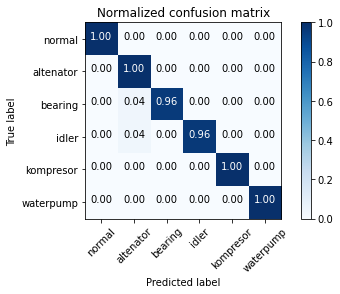


##########################################################################
######################## A-C-C-U-R-A-C-Y #################################
########################     98.71 %    #################################
##########################################################################


In [7]:
if __name__ == '__main__':
    main()
